In [1]:
"""
Created on Thu Jul  4 12:00:18 2019
@author: DataLoungeUser
"""
import numpy as np
import pandas as pd
import seaborn as sns
#import plotly
#%matplotlib inline
#import plotly.plotly as py
import matplotlib.pyplot as plt
from matplotlib import style

from sklearn.model_selection import train_test_split

In [2]:
style.use('fivethirtyeight')
df1 = pd.read_csv("hour.csv")
print (df1.head())
df = df1.drop(['dteday'], axis=1)
print (df.head())

   instant      dteday  season  yr  mnth  hr  holiday  weekday  workingday  \
0        1  2011-01-01       1   0     1   0        0        6           0   
1        2  2011-01-01       1   0     1   1        0        6           0   
2        3  2011-01-01       1   0     1   2        0        6           0   
3        4  2011-01-01       1   0     1   3        0        6           0   
4        5  2011-01-01       1   0     1   4        0        6           0   

   weathersit  temp   atemp   hum  windspeed  casual  registered  cnt  
0           1  0.24  0.2879  0.81        0.0       3          13   16  
1           1  0.22  0.2727  0.80        0.0       8          32   40  
2           1  0.22  0.2727  0.80        0.0       5          27   32  
3           1  0.24  0.2879  0.75        0.0       3          10   13  
4           1  0.24  0.2879  0.75        0.0       0           1    1  
   instant  season  yr  mnth  hr  holiday  weekday  workingday  weathersit  \
0        1       1   

In [3]:
df.info()

df.head()

df.shape
df_A,df_test = train_test_split(df, test_size=0.20, random_state=42)
df_train,df_val = train_test_split(df_A, test_size=0.20, random_state=42)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 16 columns):
instant       17379 non-null int64
season        17379 non-null int64
yr            17379 non-null int64
mnth          17379 non-null int64
hr            17379 non-null int64
holiday       17379 non-null int64
weekday       17379 non-null int64
workingday    17379 non-null int64
weathersit    17379 non-null int64
temp          17379 non-null float64
atemp         17379 non-null float64
hum           17379 non-null float64
windspeed     17379 non-null float64
casual        17379 non-null int64
registered    17379 non-null int64
cnt           17379 non-null int64
dtypes: float64(4), int64(12)
memory usage: 2.1 MB


In [4]:
def plotFeatures(col_list,title):
    plt.figure(figsize=(10, 14))
    i = 0
    print(len(col_list))
    for col in col_list:
        i+=1
        plt.subplot(8,2,i)
        plt.plot(df[col],df["cnt"],marker='.',linestyle='none')
        plt.title(title % (col))   
        plt.tight_layout()

16


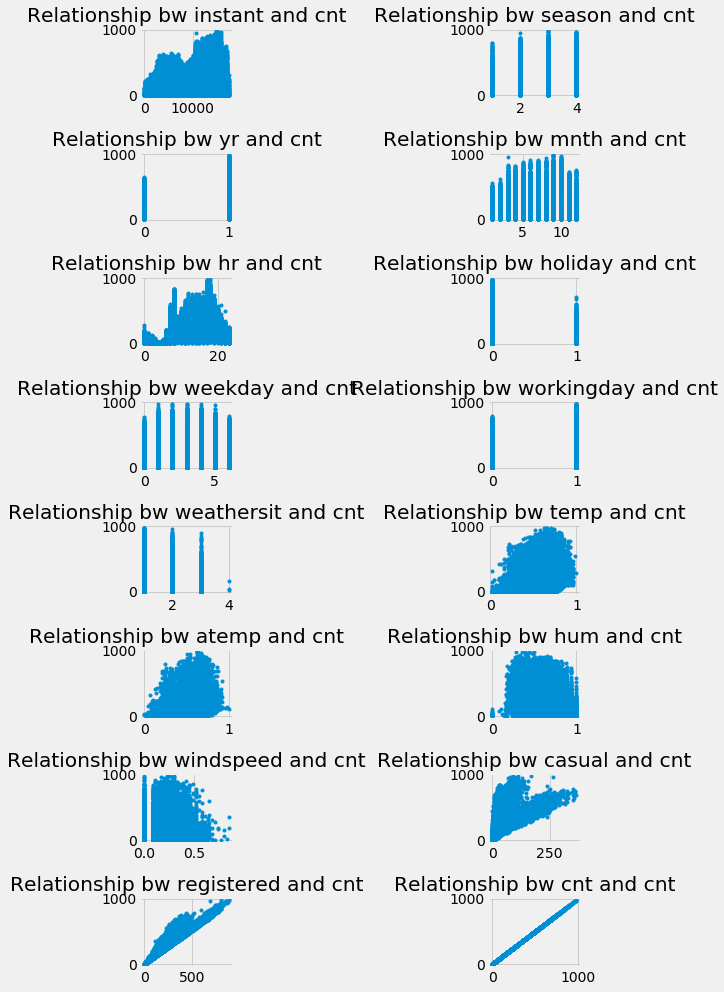

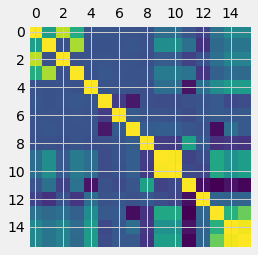

In [5]:

#colnames = ['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'registered', 'AGE', 'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT']

colnames = df.columns

plotFeatures(colnames,"Relationship bw %s and cnt")


plt.matshow(df.corr())

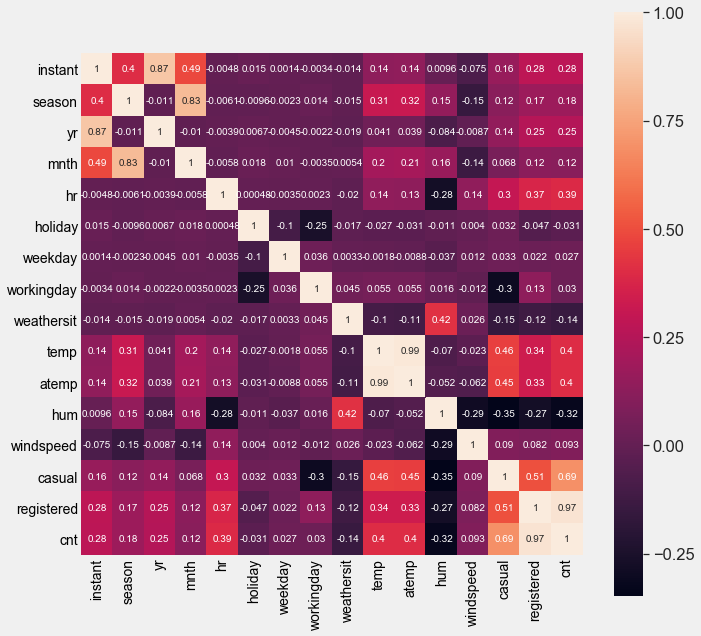

In [6]:

fig = plt.subplots(figsize = (10,10))
sns.set(font_scale=1.5)
sns.heatmap(df.corr(),square = True,cbar=True,annot=True,annot_kws={'size': 10})
plt.show()



In [7]:
def predictPrice(x,theta):
    return np.dot(x,theta)

In [8]:
def calculateCost(x,theta,Y):
    prediction = predictPrice(x,theta)
    return ((prediction - Y)**2).mean()/2

In [ ]:
def abline(x,theta,Y):
    """Plot a line from slope and intercept"""   
    y_vals = predictPrice(x,theta)
#    plt.xlim(-20, 20)
#    plt.ylim(-10, 60)
    plt.xlabel('No. of Rooms in the house')
    plt.ylabel('Price of house')
    plt.gca().set_aspect(0.1, adjustable='datalim')
    plt.plot(x[:,-1],Y,'.',x[:,-1], y_vals, '-.')
    plt.gca().legend(('Data','Regressor'))
    plt.show()

In [ ]:
def loss_plot(x,costs_train,costs_val):
    '''plot the loss informination'''
    plt.xlabel('No. of iteration')
    plt.ylabel('Loss')
    plt.plot(x,costs_train,'.',x, costs_val, '-.')
    plt.gca().legend(('Train','Val'))
    plt.show()

In [ ]:
def gradientDescentLinearRegression(alpha=0.00001,iter=20000,theta=[]):
    '''initialized the values'''
    prev_val = 1
    counter =0
    if any(theta):
        theta = theta
    else :
        theta = np.zeros(2)
#    else:
#        theta = np.zeros(2)
        
    theta0 = []
    theta1 = []
        
    costs_train = []
    costs_val = []
    
    '''provide the training informination'''
    predictor = df_train["registered"]
    x_train = np.column_stack((np.ones(len(predictor)),predictor))
    Y_train = df_train["cnt"]
    
    
    
    '''provide the validation informination'''
    predictor_val = df_val["registered"]
    x_val = np.column_stack((np.ones(len(predictor_val)),predictor_val))
    Y_val = df_val["cnt"]
     
    '''Do for number of iter'''
    for i in range(iter):
        '''do the prediction'''
        pred = predictPrice(x_train,theta)
        '''' correct the gradient '''
        t0 = theta[0] - alpha *(pred - Y_train).mean()
        t1 = theta[1] - alpha *((pred - Y_train)* x_train[:,1]).mean()
        theta = np.array([t0,t1])
        
        ''' training loss '''
        J_train = calculateCost(x_train,theta,Y_train)
        theta0.append(t0)
        theta1.append(t1)
        costs_train.append(J_train)
        '''validation loss'''
        J_val = calculateCost(x_val,theta,Y_val)
        costs_val.append(J_val)
        if i%10==0:
            print(f"Iteration: {i+1},Cost = {J_train},theta = {theta}")
            
            print(f"Iteration: {i+1},Cost_val = {J_val},theta = {theta}")
            
            abline(x_train,theta,Y_train)
        if J_val>prev_val:
            counter +=1   #counter = counter + 1
            prev_val = J_val
        else:
            counter = 0
            prev_val = J_val
            
        '''check the teregisteredination condition''' 
        if counter>10:
            print ("teregisteredinated")
            print(f'theta0 = {len(theta0)}\ntheta1 = {len(theta1)}\nCosts = {len(costs_train)}')
            print ( J_val,prev_val,counter,i)
            return costs_val,costs_train,theta,i+1
        
#            abline(x_train,theta,Y_train)
    print(f'theta0 = {len(theta0)}\ntheta1 = {len(theta1)}\nCosts = {len(costs_train)}')
    return costs_val,costs_train,theta,iter

Iteration: 1,Cost = 10416.758828235585,theta = [0.00190264 0.56444161]
Iteration: 1,Cost_val = 10448.144978051072,theta = [0.00190264 0.56444161]


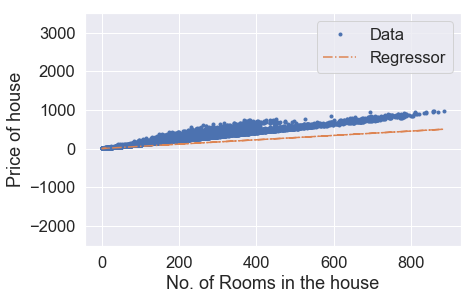

Iteration: 11,Cost = 943.6135885402562,theta = [0.00449718 1.19768563]
Iteration: 11,Cost_val = 948.0498707796667,theta = [0.00449718 1.19768563]


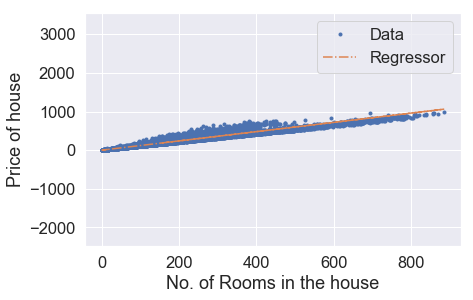

Iteration: 21,Cost = 943.5828425876023,theta = [0.00501883 1.19877382]
Iteration: 21,Cost_val = 947.8382294704114,theta = [0.00501883 1.19877382]


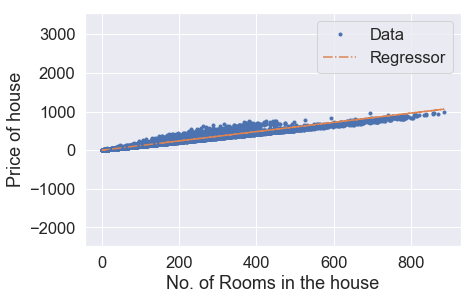

Iteration: 31,Cost = 943.5801587202974,theta = [0.00553688 1.198774  ]
Iteration: 31,Cost_val = 947.8352803676518,theta = [0.00553688 1.198774  ]


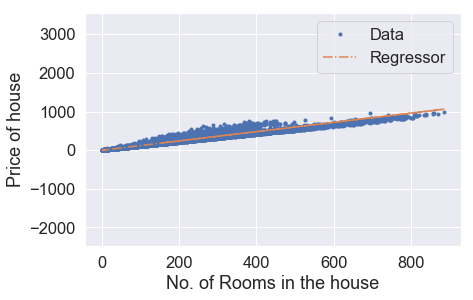

Iteration: 41,Cost = 943.5774752011329,theta = [0.00605491 1.19877231]
Iteration: 41,Cost_val = 947.8326428908274,theta = [0.00605491 1.19877231]


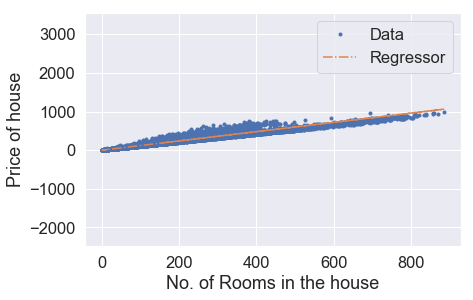

Iteration: 51,Cost = 943.5747919469492,theta = [0.00657291 1.19877061]
Iteration: 51,Cost_val = 947.8300062096909,theta = [0.00657291 1.19877061]


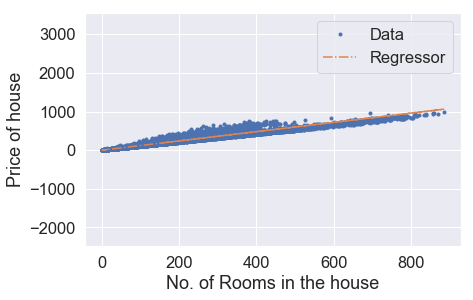

Iteration: 61,Cost = 943.5721089577314,theta = [0.00709088 1.19876891]
Iteration: 61,Cost_val = 947.8273697893806,theta = [0.00709088 1.19876891]


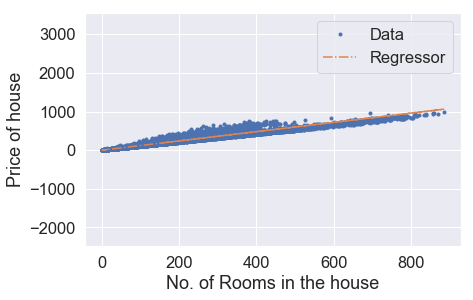

Iteration: 71,Cost = 943.5694262334353,theta = [0.00760883 1.19876721]
Iteration: 71,Cost_val = 947.8247336289529,theta = [0.00760883 1.19876721]


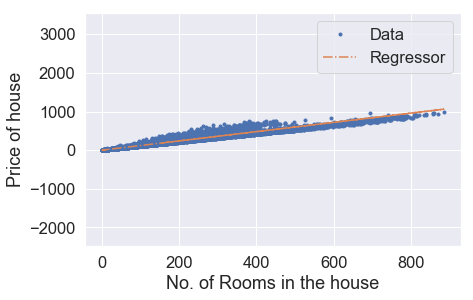

Iteration: 81,Cost = 943.5667437740706,theta = [0.00812675 1.19876551]
Iteration: 81,Cost_val = 947.8220977283788,theta = [0.00812675 1.19876551]


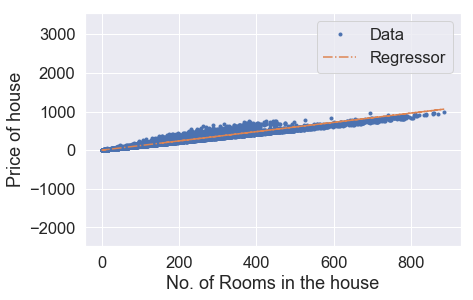

Iteration: 91,Cost = 943.5640615795646,theta = [0.00864465 1.19876381]
Iteration: 91,Cost_val = 947.8194620876371,theta = [0.00864465 1.19876381]


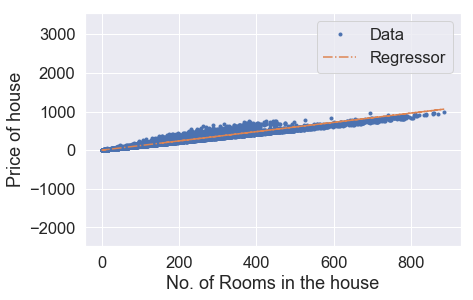

theta0 = 100
theta1 = 100
Costs = 100


In [ ]:

  
costs_val,costs_train,theta,iteration  = gradientDescentLinearRegression(alpha=0.00001,iter=100)


In [ ]:
'''prepare the test data'''

predictor_test = df_test["registered"]
x_test = np.column_stack((np.ones(len(predictor_test)),predictor_test))
Y_test = df_test["cnt"]  

In [ ]:
'''Calculate the loss for test data'''
J_test = calculateCost(x_test,theta,Y_test)
print(f"Cost_test = {J_test}")

Cost_test = 869.890643360146


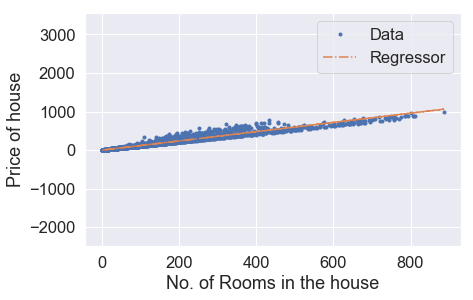

In [ ]:
'''plot the test data'''
abline(x_test,theta,Y_test)

In [ ]:
''' create range of iteration'''
iteration_range=list(range(0, iteration))

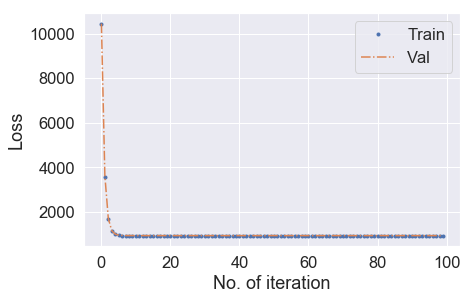

In [ ]:
'''plot loss'''
loss_plot(iteration_range,costs_train,costs_val)

Iteration: 1,Cost = 943.5613796499246,theta = [0.00916252 1.19876212]
Iteration: 1,Cost_val = 947.8168267067033,theta = [0.00916252 1.19876212]


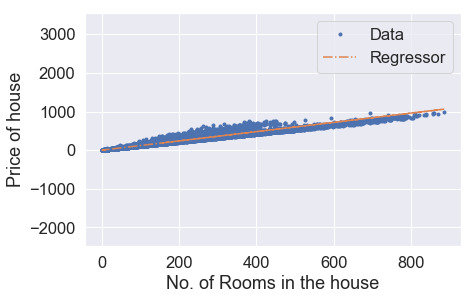

Iteration: 11,Cost = 943.5586979851054,theta = [0.00968037 1.19876042]
Iteration: 11,Cost_val = 947.8141915855412,theta = [0.00968037 1.19876042]


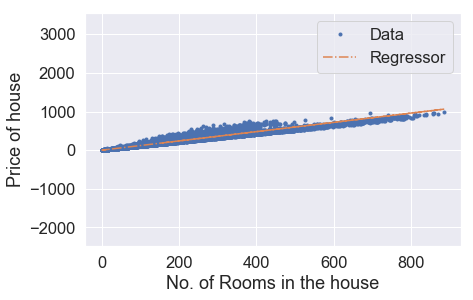

Iteration: 21,Cost = 943.5560165850976,theta = [0.01019819 1.19875872]
Iteration: 21,Cost_val = 947.811556724137,theta = [0.01019819 1.19875872]


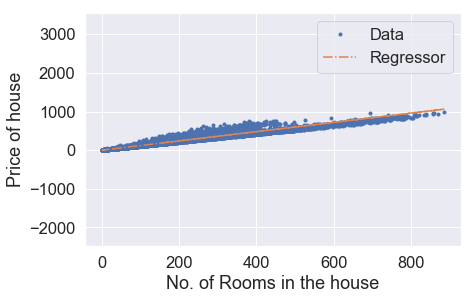

Iteration: 31,Cost = 943.5533354498708,theta = [0.01071598 1.19875702]
Iteration: 31,Cost_val = 947.8089221224551,theta = [0.01071598 1.19875702]


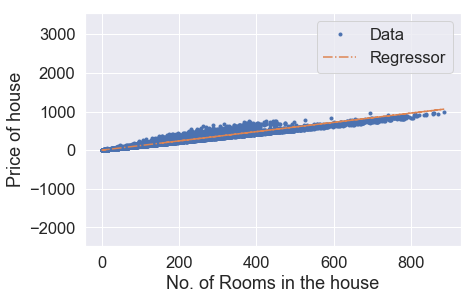

Iteration: 41,Cost = 943.5506545793787,theta = [0.01123375 1.19875532]
Iteration: 41,Cost_val = 947.8062877804729,theta = [0.01123375 1.19875532]


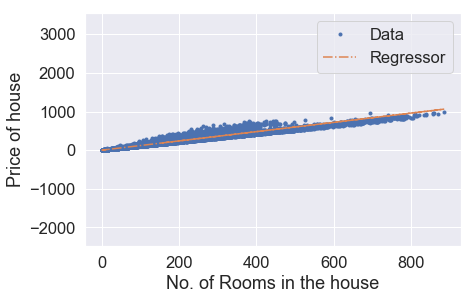

Iteration: 51,Cost = 943.5479739736122,theta = [0.01175149 1.19875363]
Iteration: 51,Cost_val = 947.8036536981705,theta = [0.01175149 1.19875363]


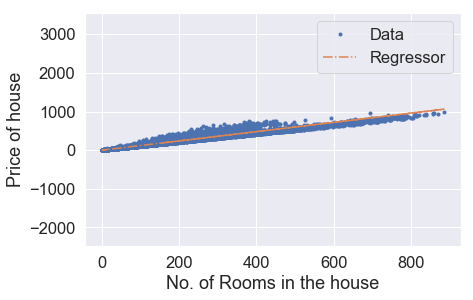

Iteration: 61,Cost = 943.5452936325504,theta = [0.01226921 1.19875193]
Iteration: 61,Cost_val = 947.8010198755211,theta = [0.01226921 1.19875193]


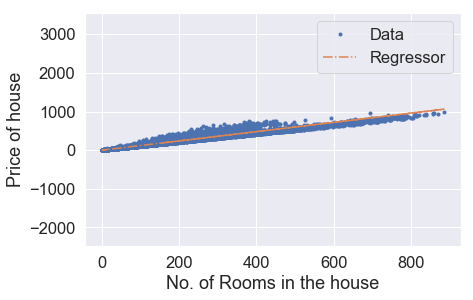

Iteration: 71,Cost = 943.542613556171,theta = [0.0127869  1.19875023]
Iteration: 71,Cost_val = 947.7983863124919,theta = [0.0127869  1.19875023]


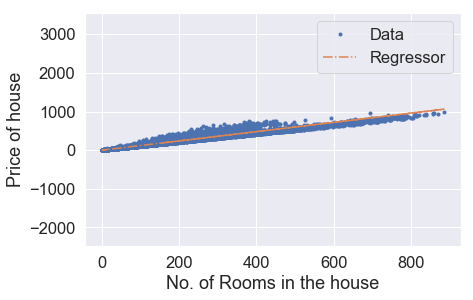

Iteration: 81,Cost = 943.539933744423,theta = [0.01330457 1.19874853]
Iteration: 81,Cost_val = 947.7957530090678,theta = [0.01330457 1.19874853]


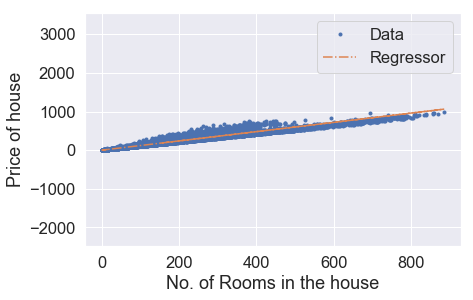

Iteration: 91,Cost = 943.5372541972794,theta = [0.01382221 1.19874684]
Iteration: 91,Cost_val = 947.7931199652106,theta = [0.01382221 1.19874684]


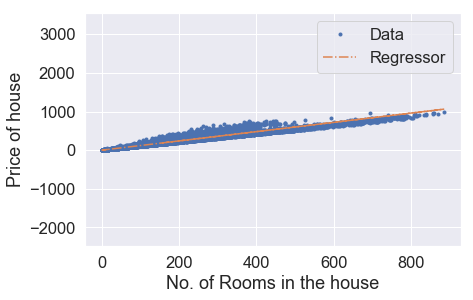

Iteration: 101,Cost = 943.5345749147613,theta = [0.01433983 1.19874514]
Iteration: 101,Cost_val = 947.7904871808958,theta = [0.01433983 1.19874514]


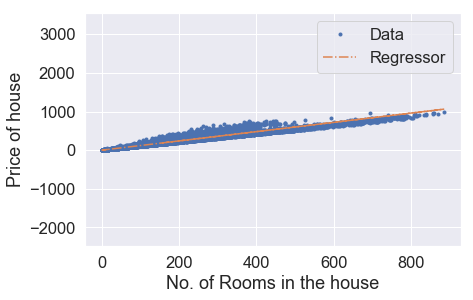

Iteration: 111,Cost = 943.5318958967965,theta = [0.01485742 1.19874344]
Iteration: 111,Cost_val = 947.7878546561171,theta = [0.01485742 1.19874344]


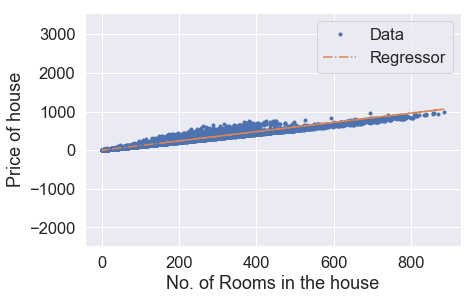

Iteration: 121,Cost = 943.5292171433757,theta = [0.01537498 1.19874174]
Iteration: 121,Cost_val = 947.7852223908257,theta = [0.01537498 1.19874174]


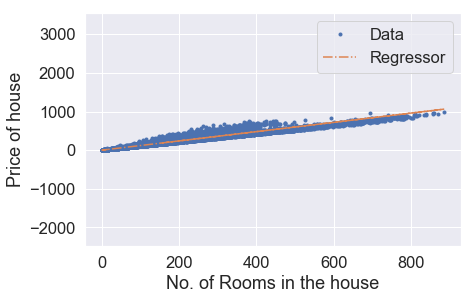

Iteration: 131,Cost = 943.5265386544748,theta = [0.01589252 1.19874005]
Iteration: 131,Cost_val = 947.78259038501,theta = [0.01589252 1.19874005]


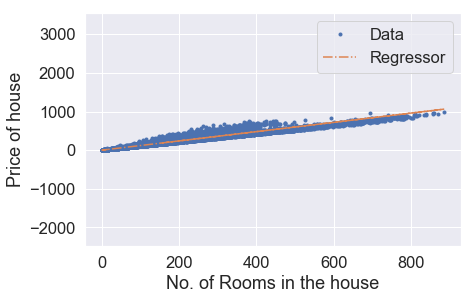

Iteration: 141,Cost = 943.5238604300571,theta = [0.01641003 1.19873835]
Iteration: 141,Cost_val = 947.7799586386328,theta = [0.01641003 1.19873835]


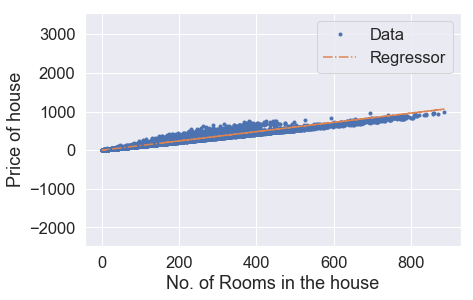

Iteration: 151,Cost = 943.5211824700933,theta = [0.01692752 1.19873665]
Iteration: 151,Cost_val = 947.7773271516779,theta = [0.01692752 1.19873665]


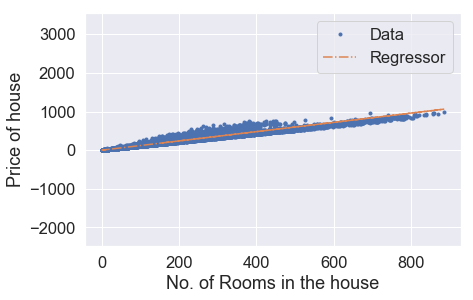

Iteration: 161,Cost = 943.5185047745725,theta = [0.01744498 1.19873496]
Iteration: 161,Cost_val = 947.7746959241251,theta = [0.01744498 1.19873496]


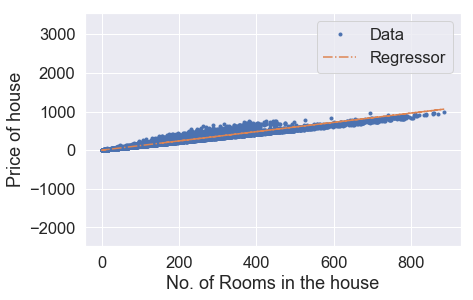

Iteration: 171,Cost = 943.5158273434798,theta = [0.01796242 1.19873326]
Iteration: 171,Cost_val = 947.7720649559327,theta = [0.01796242 1.19873326]


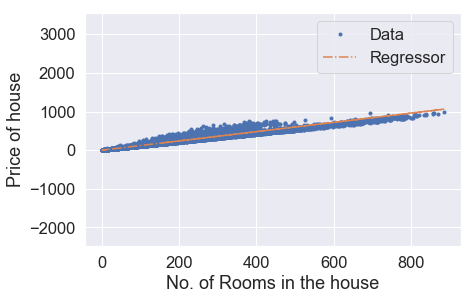

Iteration: 181,Cost = 943.5131501767452,theta = [0.01847983 1.19873156]
Iteration: 181,Cost_val = 947.7694342470869,theta = [0.01847983 1.19873156]


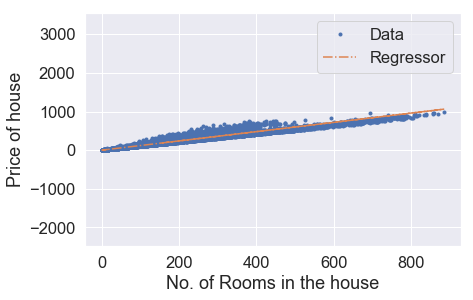

Iteration: 191,Cost = 943.5104732743808,theta = [0.01899722 1.19872987]
Iteration: 191,Cost_val = 947.7668037975541,theta = [0.01899722 1.19872987]


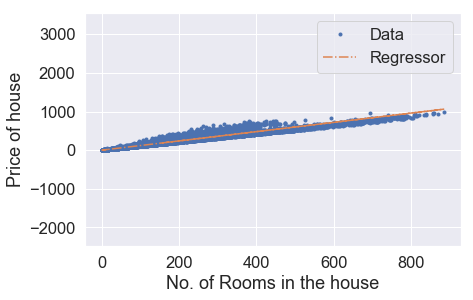

Iteration: 201,Cost = 943.5077966363597,theta = [0.01951458 1.19872817]
Iteration: 201,Cost_val = 947.7641736073153,theta = [0.01951458 1.19872817]


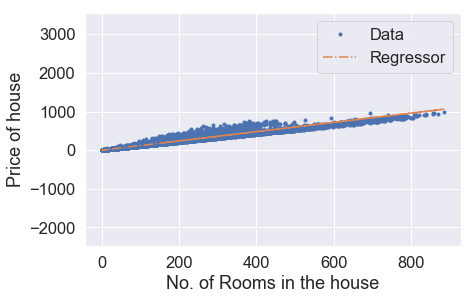

Iteration: 211,Cost = 943.5051202626297,theta = [0.02003191 1.19872647]
Iteration: 211,Cost_val = 947.7615436763459,theta = [0.02003191 1.19872647]


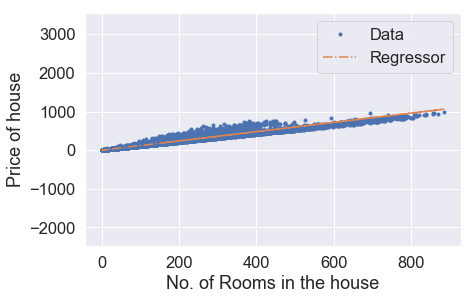

Iteration: 221,Cost = 943.5024441531815,theta = [0.02054922 1.19872478]
Iteration: 221,Cost_val = 947.758914004615,theta = [0.02054922 1.19872478]


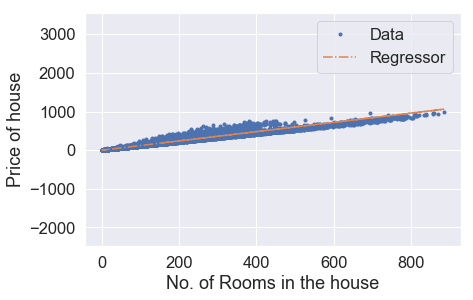

Iteration: 231,Cost = 943.4997683080003,theta = [0.02106651 1.19872308]
Iteration: 231,Cost_val = 947.7562845920964,theta = [0.02106651 1.19872308]


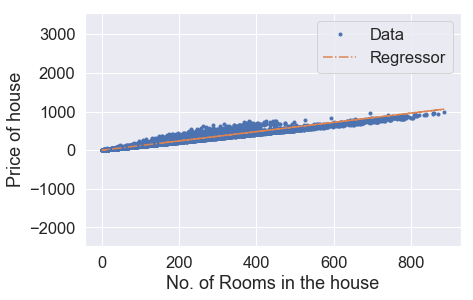

Iteration: 241,Cost = 943.4970927270319,theta = [0.02158376 1.19872139]
Iteration: 241,Cost_val = 947.7536554387718,theta = [0.02158376 1.19872139]


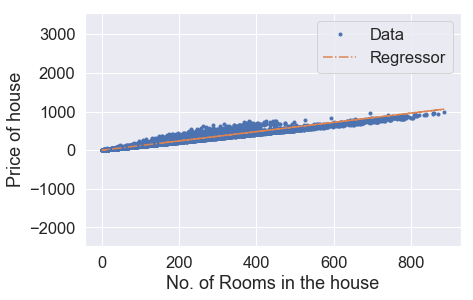

Iteration: 251,Cost = 943.4944174102744,theta = [0.022101   1.19871969]
Iteration: 251,Cost_val = 947.7510265446067,theta = [0.022101   1.19871969]


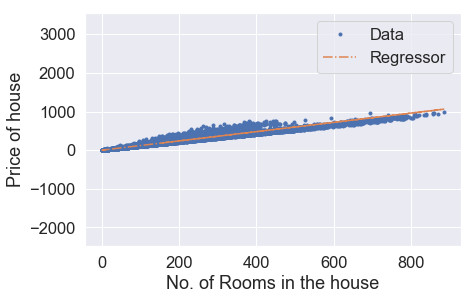

Iteration: 261,Cost = 943.4917423576973,theta = [0.0226182  1.19871799]
Iteration: 261,Cost_val = 947.7483979095817,theta = [0.0226182  1.19871799]


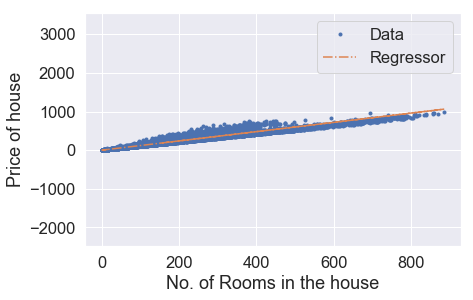

Iteration: 271,Cost = 943.4890675692484,theta = [0.02313539 1.1987163 ]
Iteration: 271,Cost_val = 947.7457695336718,theta = [0.02313539 1.1987163 ]


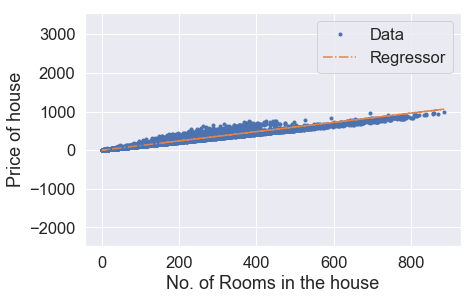

Iteration: 281,Cost = 943.4863930449434,theta = [0.02365254 1.1987146 ]
Iteration: 281,Cost_val = 947.7431414168469,theta = [0.02365254 1.1987146 ]


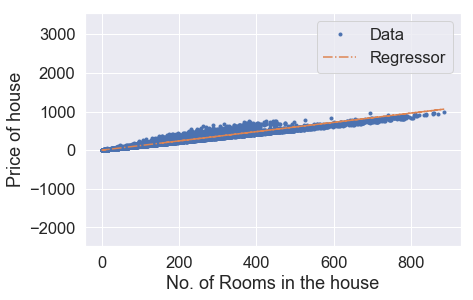

Iteration: 291,Cost = 943.4837187847229,theta = [0.02416967 1.19871291]
Iteration: 291,Cost_val = 947.7405135590867,theta = [0.02416967 1.19871291]


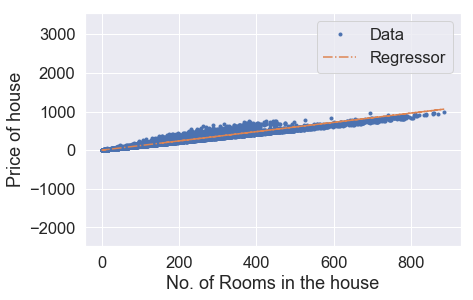

Iteration: 301,Cost = 943.481044788586,theta = [0.02468678 1.19871121]
Iteration: 301,Cost_val = 947.7378859603563,theta = [0.02468678 1.19871121]


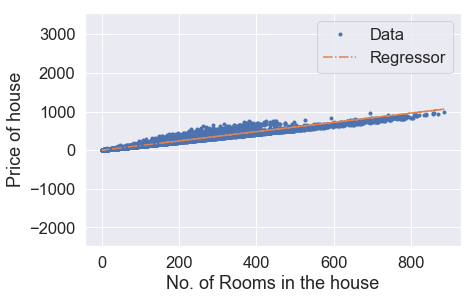

Iteration: 311,Cost = 943.4783710564961,theta = [0.02520386 1.19870952]
Iteration: 311,Cost_val = 947.7352586206414,theta = [0.02520386 1.19870952]


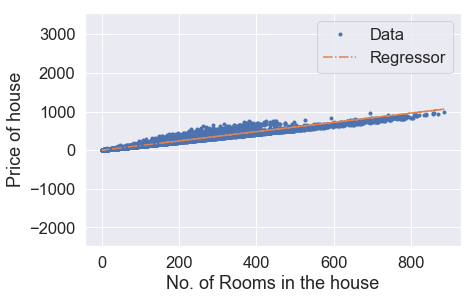

Iteration: 321,Cost = 943.4756975884255,theta = [0.02572091 1.19870782]
Iteration: 321,Cost_val = 947.73263153991,theta = [0.02572091 1.19870782]


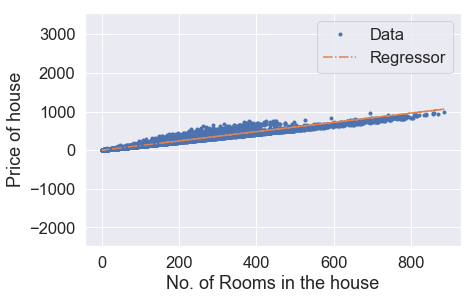

Iteration: 331,Cost = 943.4730243843261,theta = [0.02623794 1.19870612]
Iteration: 331,Cost_val = 947.7300047181357,theta = [0.02623794 1.19870612]


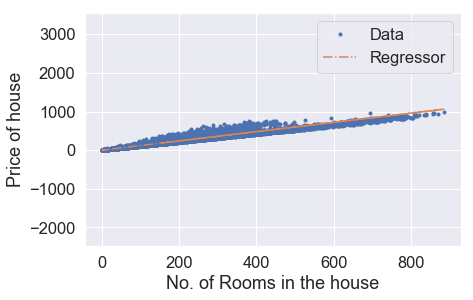

Iteration: 341,Cost = 943.4703514442195,theta = [0.02675494 1.19870443]
Iteration: 341,Cost_val = 947.7273781552981,theta = [0.02675494 1.19870443]


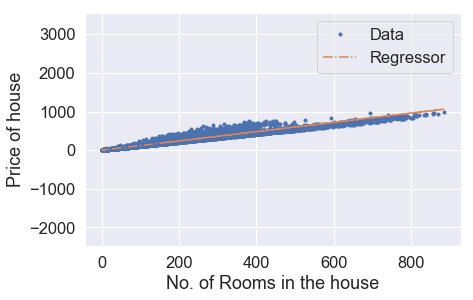

Iteration: 351,Cost = 943.4676787680402,theta = [0.02727192 1.19870273]
Iteration: 351,Cost_val = 947.7247518513688,theta = [0.02727192 1.19870273]


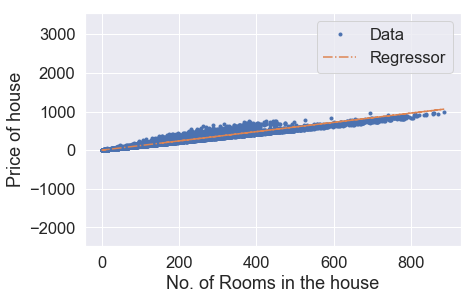

Iteration: 361,Cost = 943.4650063557807,theta = [0.02778887 1.19870104]
Iteration: 361,Cost_val = 947.7221258063249,theta = [0.02778887 1.19870104]


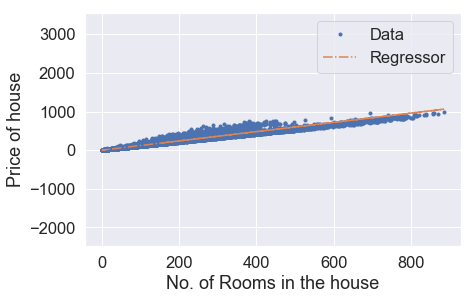

Iteration: 371,Cost = 943.4623342074118,theta = [0.0283058  1.19869934]
Iteration: 371,Cost_val = 947.7195000201323,theta = [0.0283058  1.19869934]


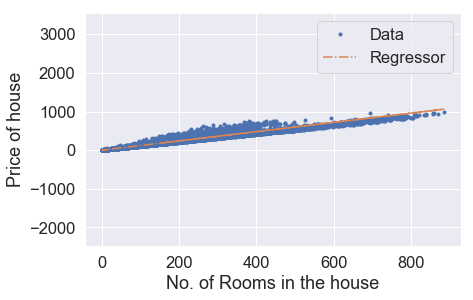

Iteration: 381,Cost = 943.459662322905,theta = [0.0288227  1.19869765]
Iteration: 381,Cost_val = 947.7168744927767,theta = [0.0288227  1.19869765]


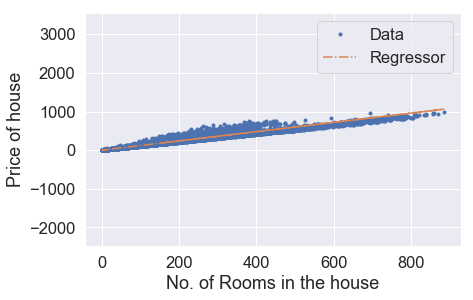

Iteration: 391,Cost = 943.4569907022346,theta = [0.02933957 1.19869595]
Iteration: 391,Cost_val = 947.7142492242249,theta = [0.02933957 1.19869595]


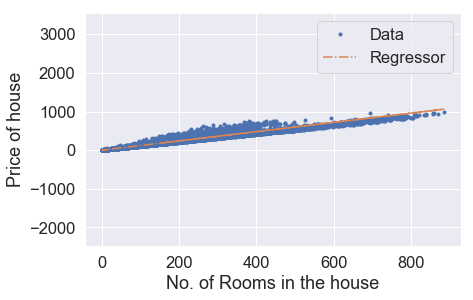

Iteration: 401,Cost = 943.4543193453699,theta = [0.02985642 1.19869426]
Iteration: 401,Cost_val = 947.7116242144565,theta = [0.02985642 1.19869426]


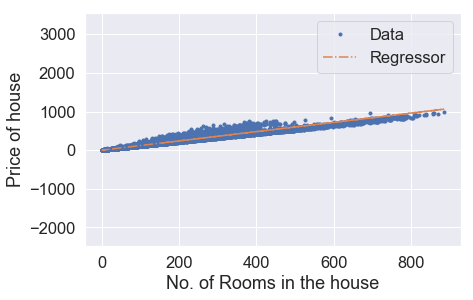

Iteration: 411,Cost = 943.4516482522984,theta = [0.03037324 1.19869256]
Iteration: 411,Cost_val = 947.7089994634367,theta = [0.03037324 1.19869256]


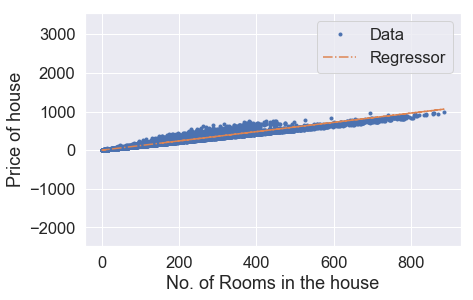

Iteration: 421,Cost = 943.4489774229819,theta = [0.03089004 1.19869087]
Iteration: 421,Cost_val = 947.7063749711524,theta = [0.03089004 1.19869087]


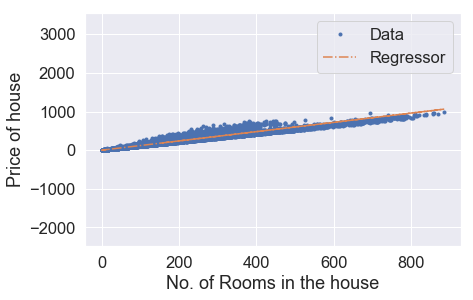

Iteration: 431,Cost = 943.4463068573945,theta = [0.03140682 1.19868918]
Iteration: 431,Cost_val = 947.7037507375696,theta = [0.03140682 1.19868918]


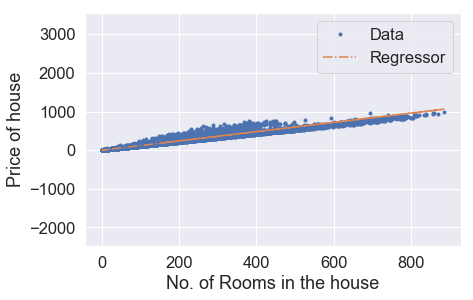

Iteration: 441,Cost = 943.4436365555233,theta = [0.03192356 1.19868748]
Iteration: 441,Cost_val = 947.7011267626663,theta = [0.03192356 1.19868748]


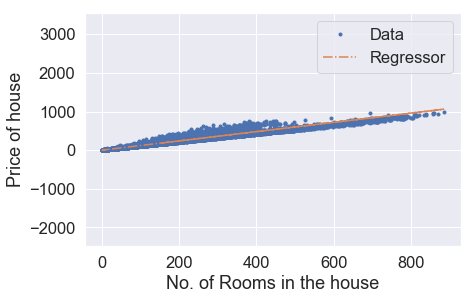

Iteration: 451,Cost = 943.4409665173307,theta = [0.03244029 1.19868579]
Iteration: 451,Cost_val = 947.698503046413,theta = [0.03244029 1.19868579]


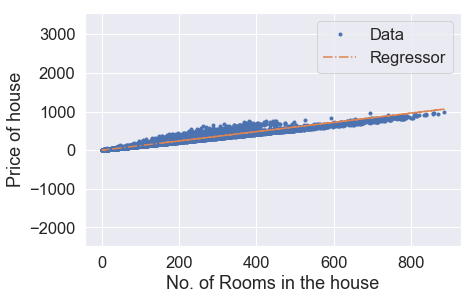

Iteration: 461,Cost = 943.4382967427836,theta = [0.03295698 1.19868409]
Iteration: 461,Cost_val = 947.6958795887931,theta = [0.03295698 1.19868409]


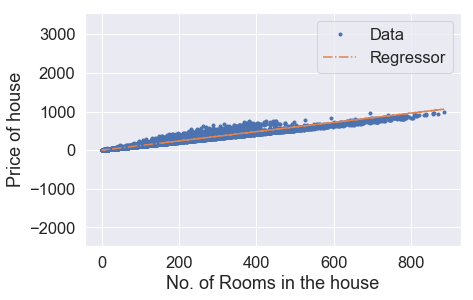

Iteration: 471,Cost = 943.4356272318743,theta = [0.03347365 1.1986824 ]
Iteration: 471,Cost_val = 947.6932563897707,theta = [0.03347365 1.1986824 ]


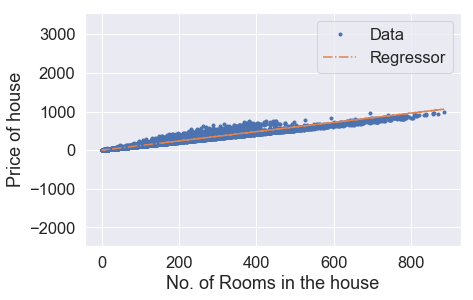

Iteration: 481,Cost = 943.4329579845672,theta = [0.0339903 1.1986807]
Iteration: 481,Cost_val = 947.6906334493278,theta = [0.0339903 1.1986807]


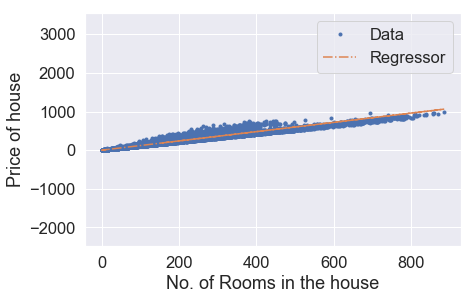

Iteration: 491,Cost = 943.4302890008279,theta = [0.03450692 1.19867901]
Iteration: 491,Cost_val = 947.6880107674318,theta = [0.03450692 1.19867901]


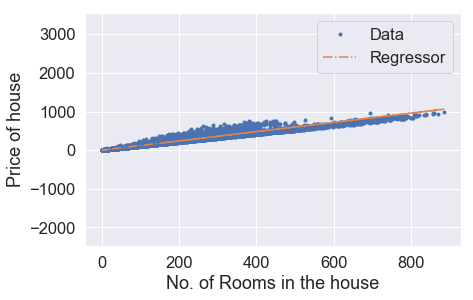

Iteration: 501,Cost = 943.4276202806474,theta = [0.03502351 1.19867732]
Iteration: 501,Cost_val = 947.6853883440623,theta = [0.03502351 1.19867732]


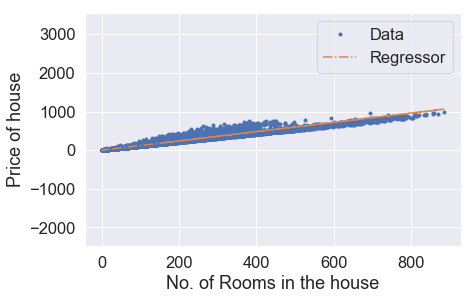

Iteration: 511,Cost = 943.4249518239923,theta = [0.03554008 1.19867562]
Iteration: 511,Cost_val = 947.6827661791966,theta = [0.03554008 1.19867562]


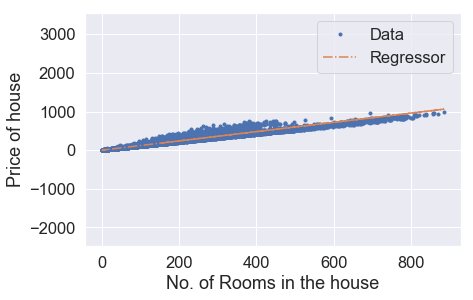

Iteration: 521,Cost = 943.4222836308252,theta = [0.03605663 1.19867393]
Iteration: 521,Cost_val = 947.6801442728017,theta = [0.03605663 1.19867393]


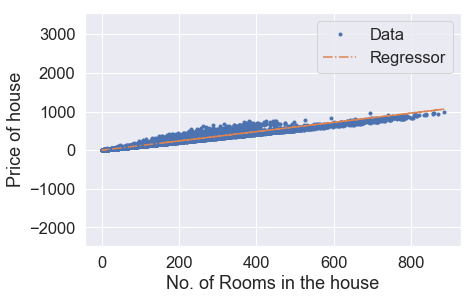

Iteration: 531,Cost = 943.4196157011454,theta = [0.03657314 1.19867223]
Iteration: 531,Cost_val = 947.6775226248569,theta = [0.03657314 1.19867223]


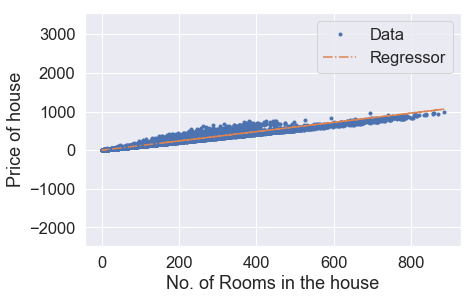

Iteration: 541,Cost = 943.4169480349025,theta = [0.03708964 1.19867054]
Iteration: 541,Cost_val = 947.6749012353324,theta = [0.03708964 1.19867054]


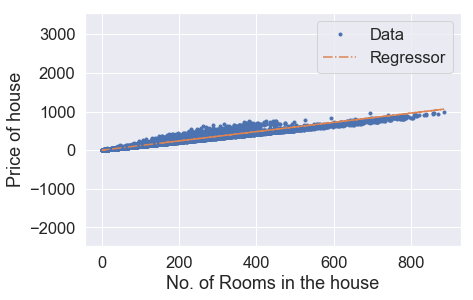

Iteration: 551,Cost = 943.4142806320872,theta = [0.0376061  1.19866885]
Iteration: 551,Cost_val = 947.6722801042113,theta = [0.0376061  1.19866885]


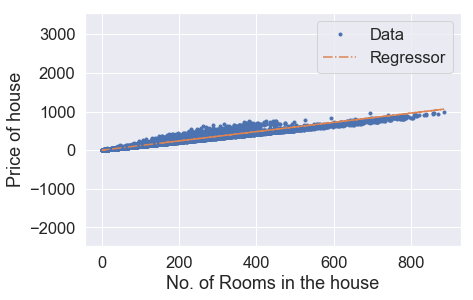

Iteration: 561,Cost = 943.4116134926526,theta = [0.03812254 1.19866715]
Iteration: 561,Cost_val = 947.669659231463,theta = [0.03812254 1.19866715]


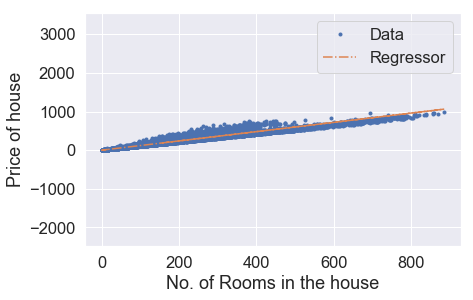

Iteration: 571,Cost = 943.4089466166071,theta = [0.03863896 1.19866546]
Iteration: 571,Cost_val = 947.6670386170572,theta = [0.03863896 1.19866546]


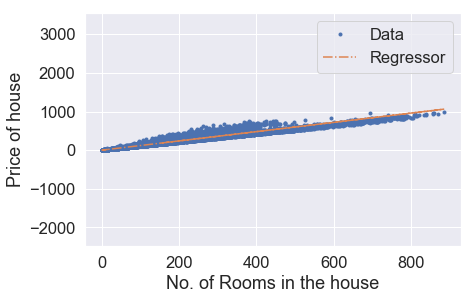

Iteration: 581,Cost = 943.406280003893,theta = [0.03915535 1.19866377]
Iteration: 581,Cost_val = 947.6644182609726,theta = [0.03915535 1.19866377]


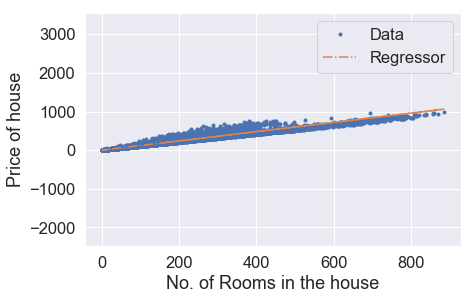

Iteration: 591,Cost = 943.4036136544935,theta = [0.03967171 1.19866207]
Iteration: 591,Cost_val = 947.6617981631875,theta = [0.03967171 1.19866207]


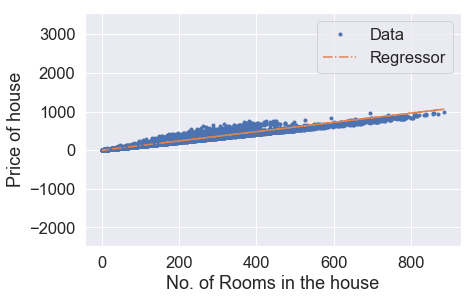

Iteration: 601,Cost = 943.4009475683871,theta = [0.04018805 1.19866038]
Iteration: 601,Cost_val = 947.6591783236673,theta = [0.04018805 1.19866038]


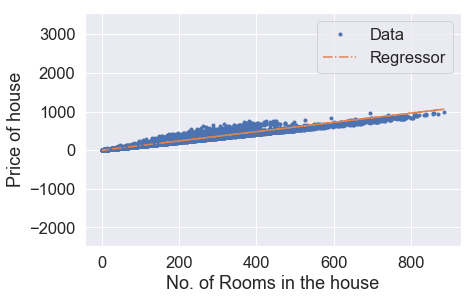

Iteration: 611,Cost = 943.3982817455309,theta = [0.04070437 1.19865869]
Iteration: 611,Cost_val = 947.6565587424016,theta = [0.04070437 1.19865869]


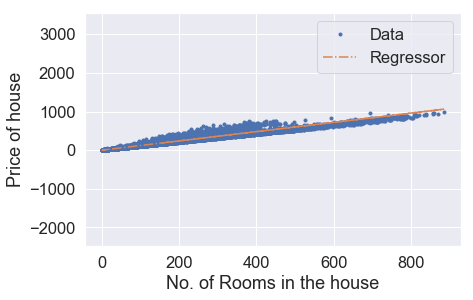

Iteration: 621,Cost = 943.395616185931,theta = [0.04122066 1.198657  ]
Iteration: 621,Cost_val = 947.65393941935,theta = [0.04122066 1.198657  ]


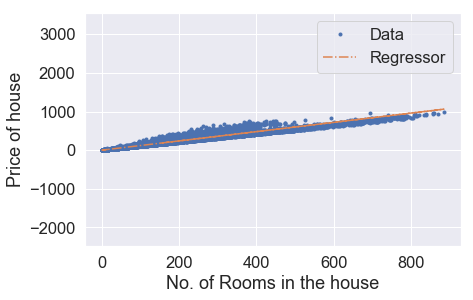

Iteration: 631,Cost = 943.3929508895355,theta = [0.04173692 1.1986553 ]
Iteration: 631,Cost_val = 947.6513203544916,theta = [0.04173692 1.1986553 ]


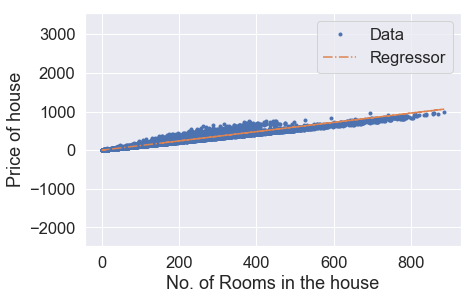

Iteration: 641,Cost = 943.3902858563358,theta = [0.04225316 1.19865361]
Iteration: 641,Cost_val = 947.6487015477992,theta = [0.04225316 1.19865361]


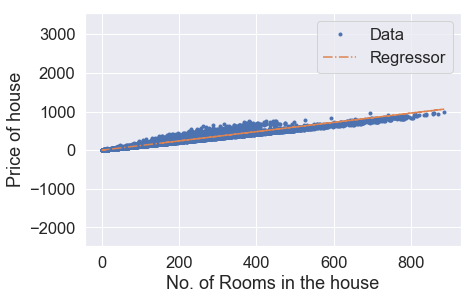

Iteration: 651,Cost = 943.3876210862884,theta = [0.04276937 1.19865192]
Iteration: 651,Cost_val = 947.6460829992556,theta = [0.04276937 1.19865192]


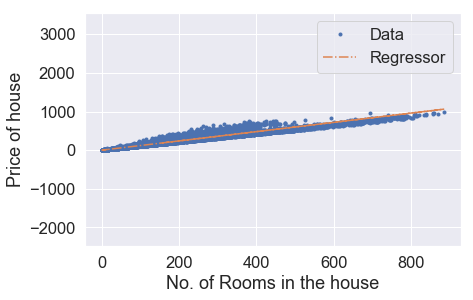

Iteration: 661,Cost = 943.3849565793776,theta = [0.04328556 1.19865022]
Iteration: 661,Cost_val = 947.643464708828,theta = [0.04328556 1.19865022]


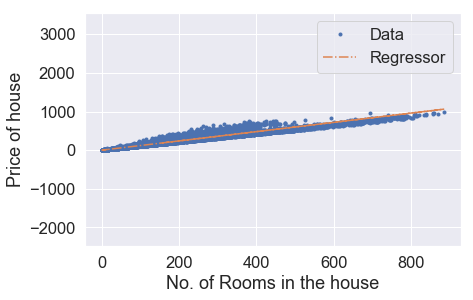

Iteration: 671,Cost = 943.382292335567,theta = [0.04380172 1.19864853]
Iteration: 671,Cost_val = 947.6408466764906,theta = [0.04380172 1.19864853]


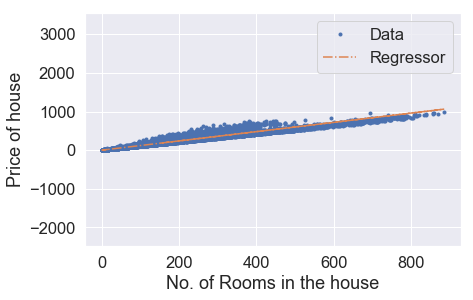

Iteration: 681,Cost = 943.3796283548639,theta = [0.04431785 1.19864684]
Iteration: 681,Cost_val = 947.6382289022222,theta = [0.04431785 1.19864684]


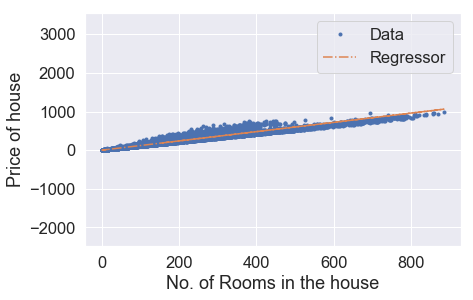

Iteration: 691,Cost = 943.3769646371927,theta = [0.04483396 1.19864515]
Iteration: 691,Cost_val = 947.6356113859952,theta = [0.04483396 1.19864515]


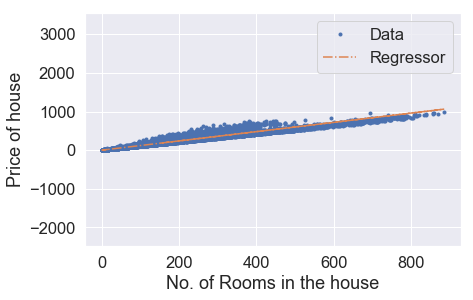

Iteration: 701,Cost = 943.3743011825561,theta = [0.04535005 1.19864346]
Iteration: 701,Cost_val = 947.6329941277853,theta = [0.04535005 1.19864346]


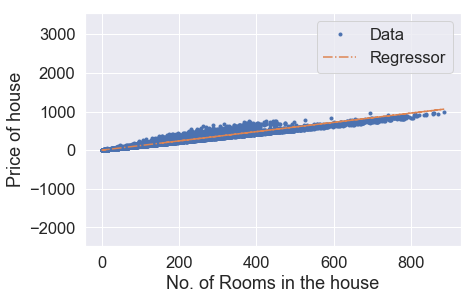

Iteration: 711,Cost = 943.3716379909262,theta = [0.04586611 1.19864176]
Iteration: 711,Cost_val = 947.630377127563,theta = [0.04586611 1.19864176]


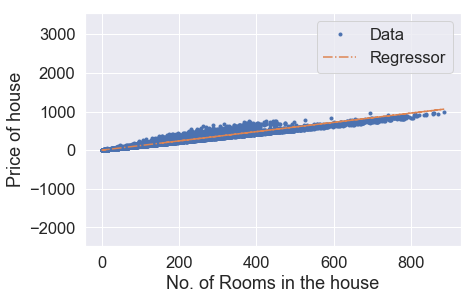

Iteration: 721,Cost = 943.3689750622812,theta = [0.04638214 1.19864007]
Iteration: 721,Cost_val = 947.6277603853059,theta = [0.04638214 1.19864007]


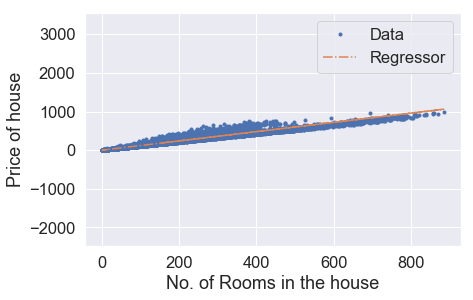

Iteration: 731,Cost = 943.366312396582,theta = [0.04689815 1.19863838]
Iteration: 731,Cost_val = 947.6251439009868,theta = [0.04689815 1.19863838]


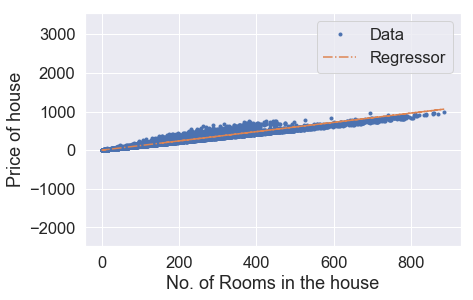

Iteration: 741,Cost = 943.3636499938109,theta = [0.04741413 1.19863669]
Iteration: 741,Cost_val = 947.6225276745835,theta = [0.04741413 1.19863669]


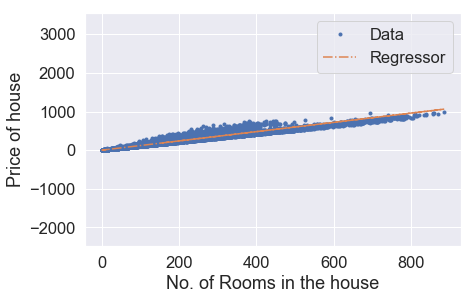

Iteration: 751,Cost = 943.3609878539438,theta = [0.04793009 1.198635  ]
Iteration: 751,Cost_val = 947.6199117060692,theta = [0.04793009 1.198635  ]


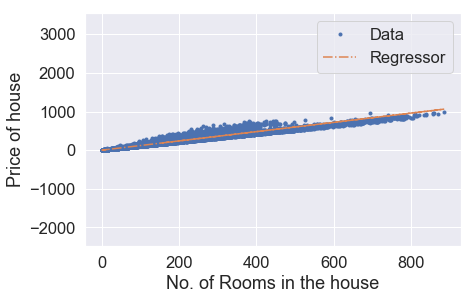

Iteration: 761,Cost = 943.358325976946,theta = [0.04844602 1.1986333 ]
Iteration: 761,Cost_val = 947.6172959954146,theta = [0.04844602 1.1986333 ]


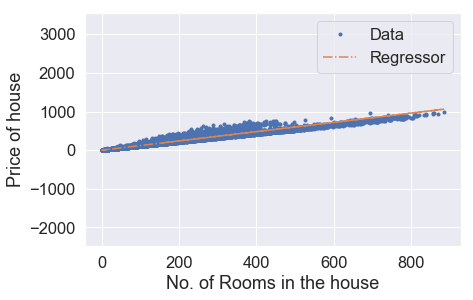

Iteration: 771,Cost = 943.3556643628117,theta = [0.04896193 1.19863161]
Iteration: 771,Cost_val = 947.6146805426025,theta = [0.04896193 1.19863161]


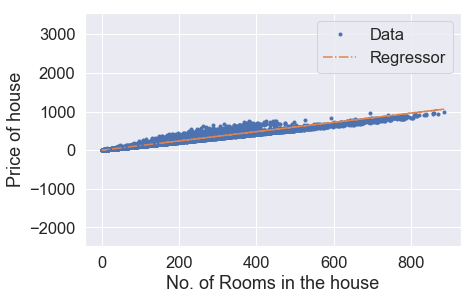

Iteration: 781,Cost = 943.3530030114787,theta = [0.04947781 1.19862992]
Iteration: 781,Cost_val = 947.6120653475978,theta = [0.04947781 1.19862992]


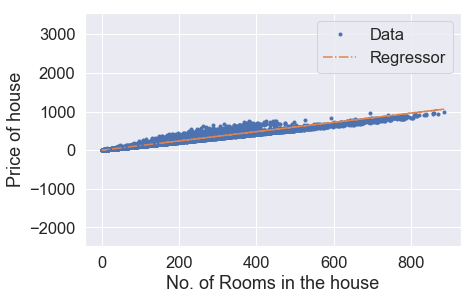

Iteration: 791,Cost = 943.3503419229597,theta = [0.04999366 1.19862823]
Iteration: 791,Cost_val = 947.609450410384,theta = [0.04999366 1.19862823]


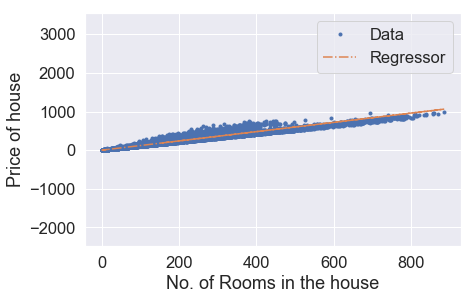

Iteration: 801,Cost = 943.347681097196,theta = [0.05050949 1.19862654]
Iteration: 801,Cost_val = 947.6068357309302,theta = [0.05050949 1.19862654]


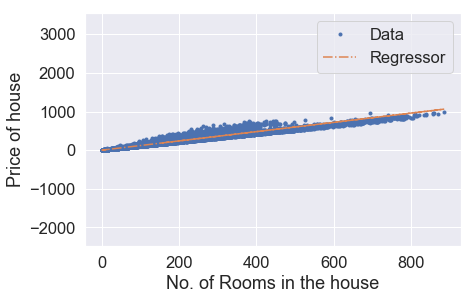

Iteration: 811,Cost = 943.3450205341857,theta = [0.0510253  1.19862485]
Iteration: 811,Cost_val = 947.6042213092132,theta = [0.0510253  1.19862485]


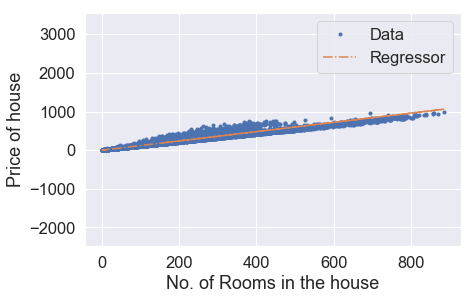

Iteration: 821,Cost = 943.342360233886,theta = [0.05154107 1.19862315]
Iteration: 821,Cost_val = 947.6016071452087,theta = [0.05154107 1.19862315]


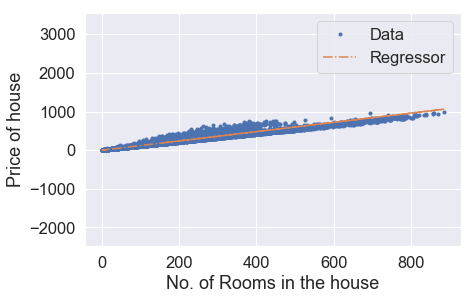

Iteration: 831,Cost = 943.3397001963062,theta = [0.05205683 1.19862146]
Iteration: 831,Cost_val = 947.598993238884,theta = [0.05205683 1.19862146]


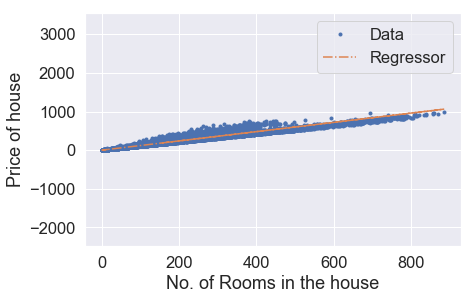

Iteration: 841,Cost = 943.3370404213621,theta = [0.05257256 1.19861977]
Iteration: 841,Cost_val = 947.5963795902215,theta = [0.05257256 1.19861977]


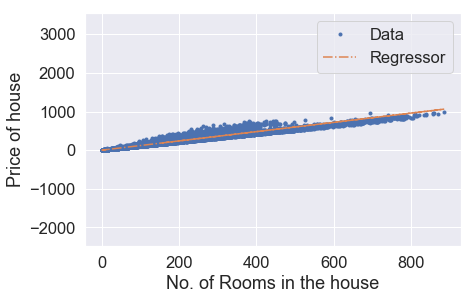

Iteration: 851,Cost = 943.3343809090675,theta = [0.05308826 1.19861808]
Iteration: 851,Cost_val = 947.5937661991928,theta = [0.05308826 1.19861808]


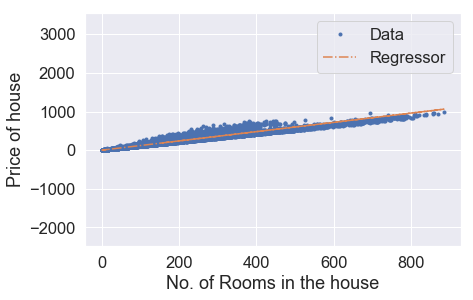

Iteration: 861,Cost = 943.3317216594032,theta = [0.05360393 1.19861639]
Iteration: 861,Cost_val = 947.5911530657755,theta = [0.05360393 1.19861639]


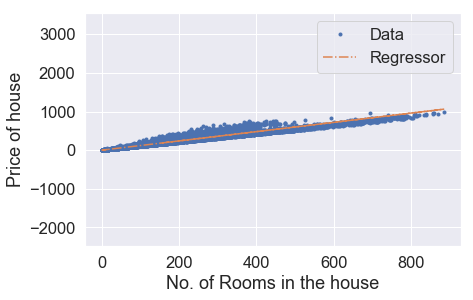

Iteration: 871,Cost = 943.3290626723159,theta = [0.05411959 1.1986147 ]
Iteration: 871,Cost_val = 947.5885401899371,theta = [0.05411959 1.1986147 ]


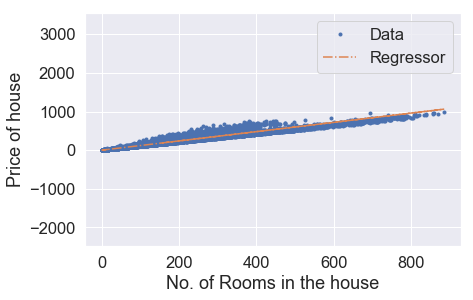

Iteration: 881,Cost = 943.3264039477889,theta = [0.05463521 1.19861301]
Iteration: 881,Cost_val = 947.5859275716593,theta = [0.05463521 1.19861301]


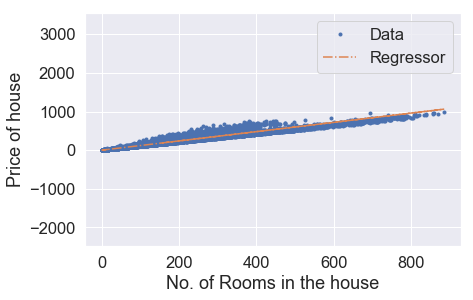

Iteration: 891,Cost = 943.3237454858076,theta = [0.05515081 1.19861132]
Iteration: 891,Cost_val = 947.5833152109133,theta = [0.05515081 1.19861132]


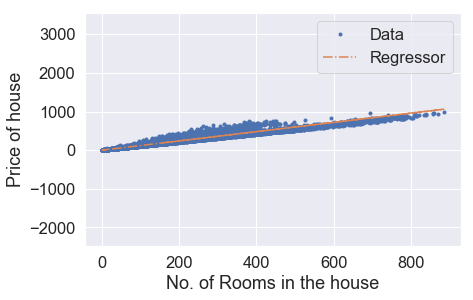

Iteration: 901,Cost = 943.3210872863358,theta = [0.05566639 1.19860963]
Iteration: 901,Cost_val = 947.5807031076766,theta = [0.05566639 1.19860963]


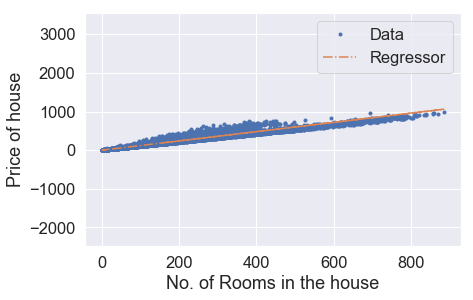

Iteration: 911,Cost = 943.3184293493478,theta = [0.05618194 1.19860794]
Iteration: 911,Cost_val = 947.5780912619184,theta = [0.05618194 1.19860794]


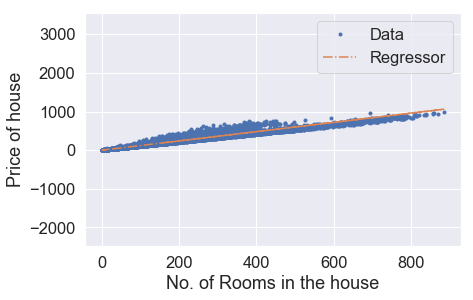

Iteration: 921,Cost = 943.3157716748195,theta = [0.05669746 1.19860625]
Iteration: 921,Cost_val = 947.5754796736184,theta = [0.05669746 1.19860625]


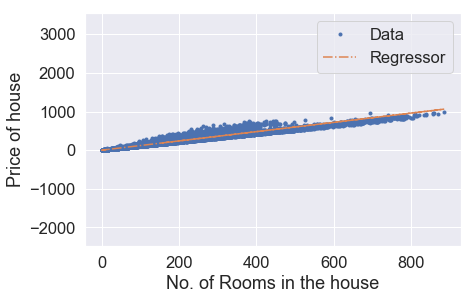

Iteration: 931,Cost = 943.3131142627149,theta = [0.05721296 1.19860456]
Iteration: 931,Cost_val = 947.5728683427498,theta = [0.05721296 1.19860456]


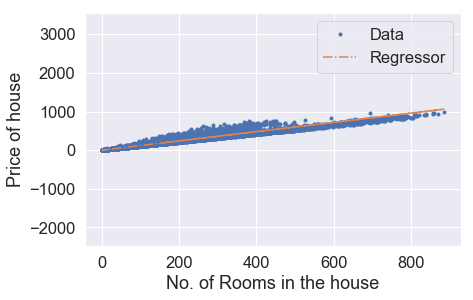

Iteration: 941,Cost = 943.3104571130401,theta = [0.05772843 1.19860287]
Iteration: 941,Cost_val = 947.5702572692851,theta = [0.05772843 1.19860287]


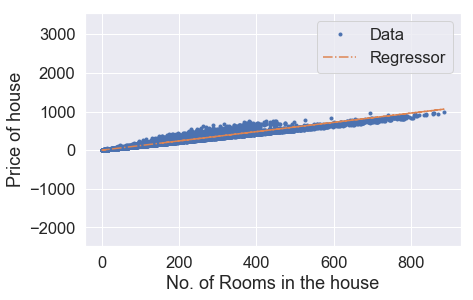

Iteration: 951,Cost = 943.3078002257333,theta = [0.05824388 1.19860118]
Iteration: 951,Cost_val = 947.5676464532074,theta = [0.05824388 1.19860118]


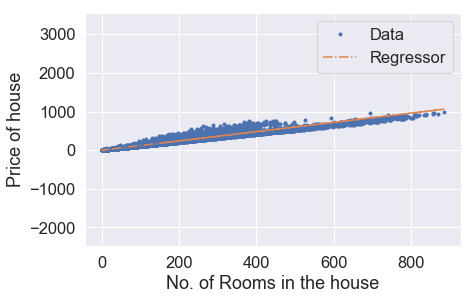

Iteration: 961,Cost = 943.3051436007868,theta = [0.0587593  1.19859949]
Iteration: 961,Cost_val = 947.5650358944773,theta = [0.0587593  1.19859949]


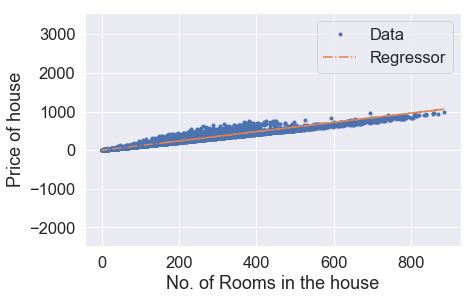

Iteration: 971,Cost = 943.3024872381654,theta = [0.0592747 1.1985978]
Iteration: 971,Cost_val = 947.5624255930758,theta = [0.0592747 1.1985978]


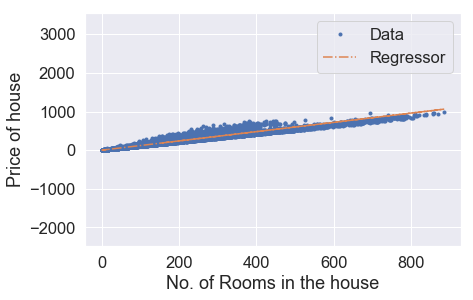

Iteration: 981,Cost = 943.2998311378556,theta = [0.05979007 1.19859611]
Iteration: 981,Cost_val = 947.5598155489822,theta = [0.05979007 1.19859611]


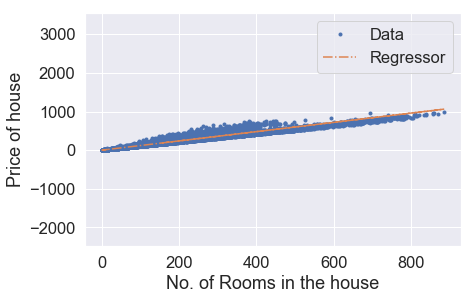

Iteration: 991,Cost = 943.297175299823,theta = [0.06030542 1.19859442]
Iteration: 991,Cost_val = 947.5572057621631,theta = [0.06030542 1.19859442]


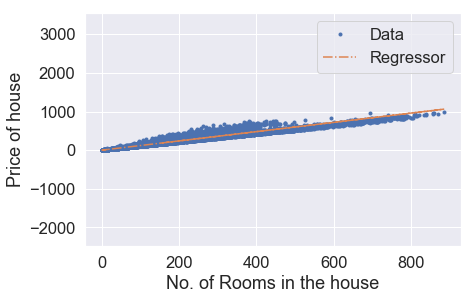

Iteration: 1001,Cost = 943.2945197240377,theta = [0.06082074 1.19859273]
Iteration: 1001,Cost_val = 947.5545962326012,theta = [0.06082074 1.19859273]


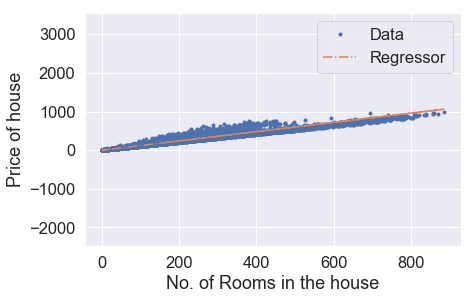

Iteration: 1011,Cost = 943.2918644104839,theta = [0.06133604 1.19859104]
Iteration: 1011,Cost_val = 947.5519869602653,theta = [0.06133604 1.19859104]


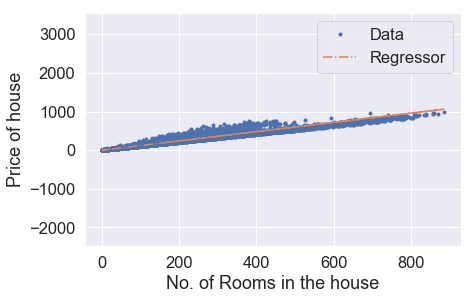

Iteration: 1021,Cost = 943.28920935913,theta = [0.0618513  1.19858935]
Iteration: 1021,Cost_val = 947.5493779451315,theta = [0.0618513  1.19858935]


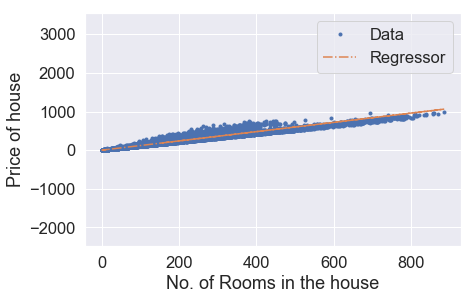

Iteration: 1031,Cost = 943.2865545699448,theta = [0.06236655 1.19858766]
Iteration: 1031,Cost_val = 947.5467691871738,theta = [0.06236655 1.19858766]


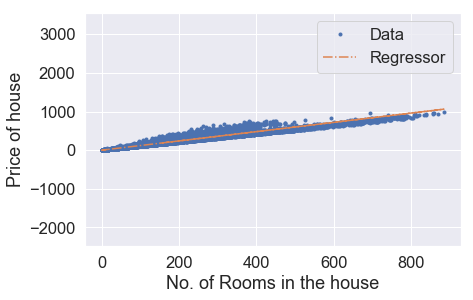

Iteration: 1041,Cost = 943.2839000429193,theta = [0.06288177 1.19858597]
Iteration: 1041,Cost_val = 947.54416068637,theta = [0.06288177 1.19858597]


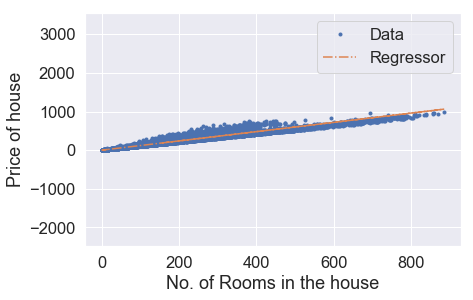

Iteration: 1051,Cost = 943.2812457780107,theta = [0.06339696 1.19858428]
Iteration: 1051,Cost_val = 947.5415524426911,theta = [0.06339696 1.19858428]


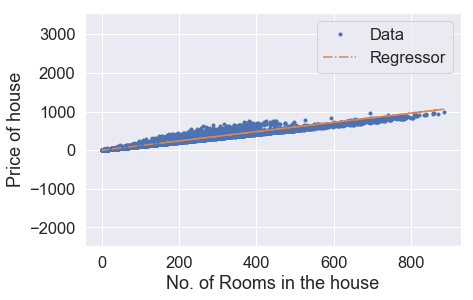

Iteration: 1061,Cost = 943.2785917752005,theta = [0.06391213 1.19858259]
Iteration: 1061,Cost_val = 947.5389444561147,theta = [0.06391213 1.19858259]


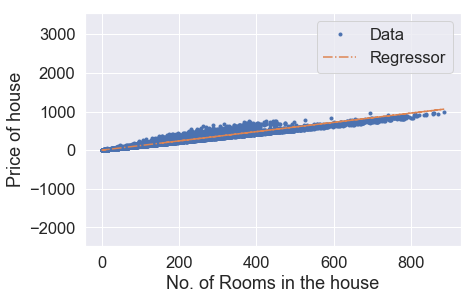

Iteration: 1071,Cost = 943.2759380344555,theta = [0.06442727 1.1985809 ]
Iteration: 1071,Cost_val = 947.5363367266159,theta = [0.06442727 1.1985809 ]


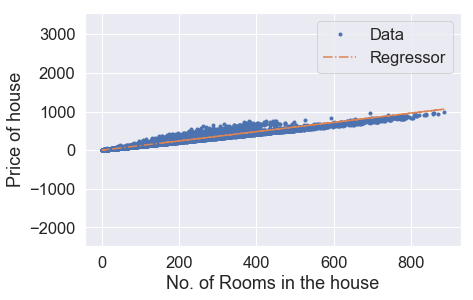

Iteration: 1081,Cost = 943.2732845557572,theta = [0.06494239 1.19857921]
Iteration: 1081,Cost_val = 947.533729254163,theta = [0.06494239 1.19857921]


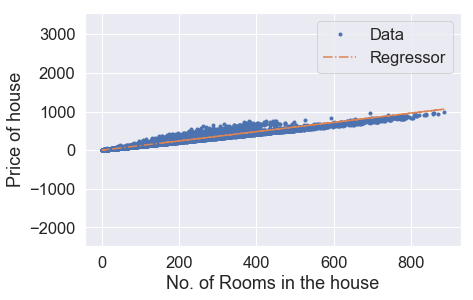

Iteration: 1091,Cost = 943.2706313390843,theta = [0.06545748 1.19857752]
Iteration: 1091,Cost_val = 947.531122038734,theta = [0.06545748 1.19857752]


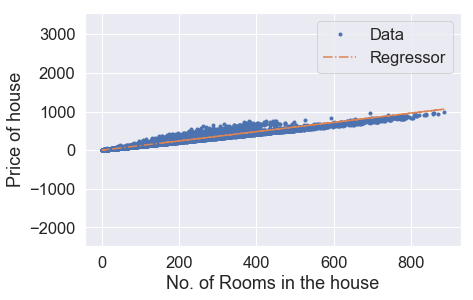

Iteration: 1101,Cost = 943.2679783844073,theta = [0.06597255 1.19857583]
Iteration: 1101,Cost_val = 947.5285150803112,theta = [0.06597255 1.19857583]


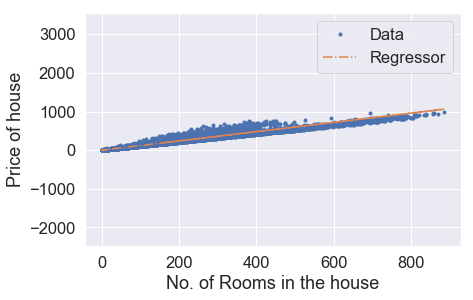

Iteration: 1111,Cost = 943.2653256917054,theta = [0.06648759 1.19857414]
Iteration: 1111,Cost_val = 947.525908378858,theta = [0.06648759 1.19857414]


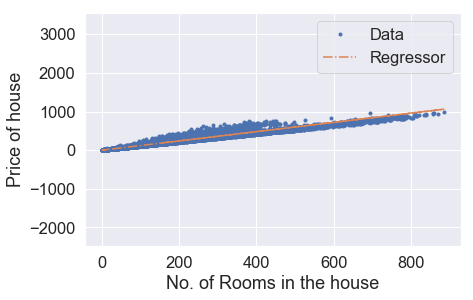

Iteration: 1121,Cost = 943.262673260928,theta = [0.0670026  1.19857246]
Iteration: 1121,Cost_val = 947.5233019343556,theta = [0.0670026  1.19857246]


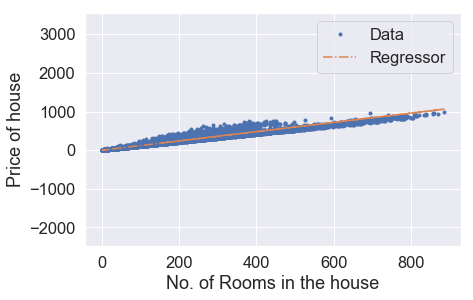

Iteration: 1131,Cost = 943.2600210920657,theta = [0.06751759 1.19857077]
Iteration: 1131,Cost_val = 947.5206957467793,theta = [0.06751759 1.19857077]


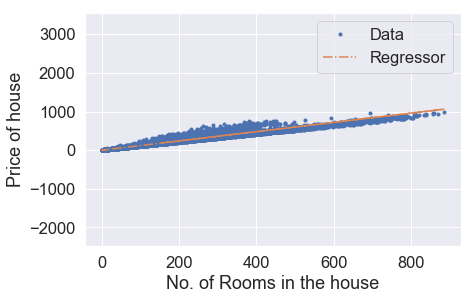

Iteration: 1141,Cost = 943.2573691851047,theta = [0.06803256 1.19856908]
Iteration: 1141,Cost_val = 947.5180898160932,theta = [0.06803256 1.19856908]


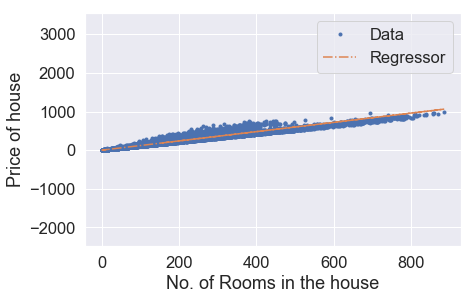

Iteration: 1151,Cost = 943.2547175399976,theta = [0.0685475  1.19856739]
Iteration: 1151,Cost_val = 947.5154841422843,theta = [0.0685475  1.19856739]


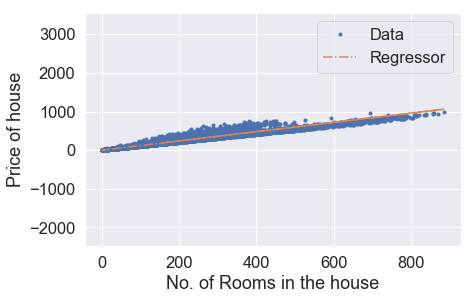

Iteration: 1161,Cost = 943.2520661567363,theta = [0.06906241 1.1985657 ]
Iteration: 1161,Cost_val = 947.5128787253233,theta = [0.06906241 1.1985657 ]


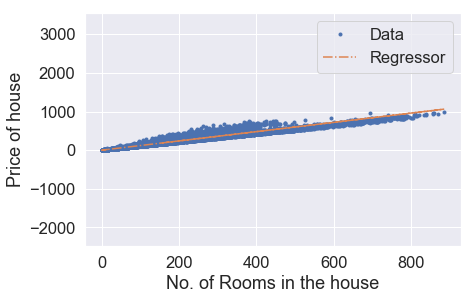

Iteration: 1171,Cost = 943.2494150352844,theta = [0.0695773  1.19856401]
Iteration: 1171,Cost_val = 947.5102735651831,theta = [0.0695773  1.19856401]


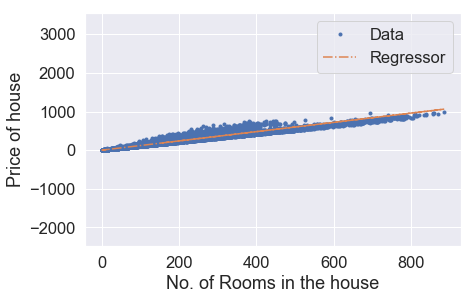

Iteration: 1181,Cost = 943.2467641756191,theta = [0.07009216 1.19856232]
Iteration: 1181,Cost_val = 947.5076686618429,theta = [0.07009216 1.19856232]


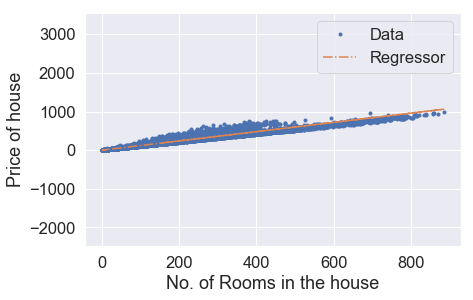

Iteration: 1191,Cost = 943.2441135777157,theta = [0.070607   1.19856064]
Iteration: 1191,Cost_val = 947.5050640152689,theta = [0.070607   1.19856064]


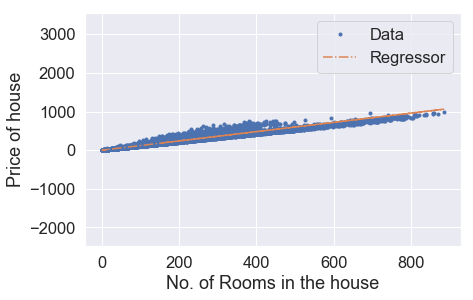

Iteration: 1201,Cost = 943.2414632415437,theta = [0.07112181 1.19855895]
Iteration: 1201,Cost_val = 947.5024596254431,theta = [0.07112181 1.19855895]


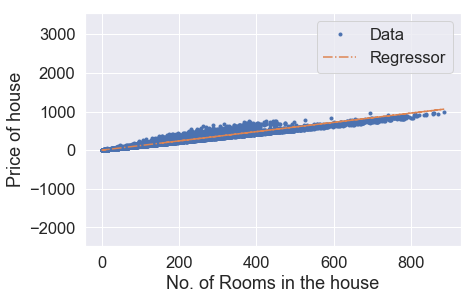

Iteration: 1211,Cost = 943.2388131670875,theta = [0.0716366  1.19855726]
Iteration: 1211,Cost_val = 947.4998554923388,theta = [0.0716366  1.19855726]


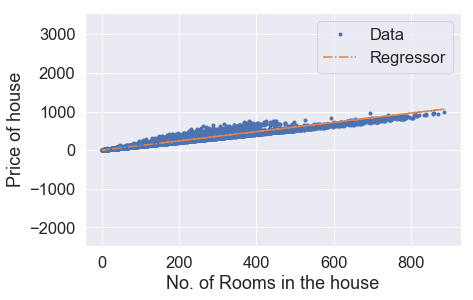

Iteration: 1221,Cost = 943.236163354313,theta = [0.07215136 1.19855557]
Iteration: 1221,Cost_val = 947.4972516159294,theta = [0.07215136 1.19855557]


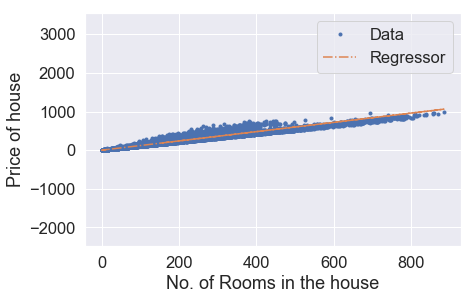

Iteration: 1231,Cost = 943.233513803206,theta = [0.0726661  1.19855388]
Iteration: 1231,Cost_val = 947.4946479961907,theta = [0.0726661  1.19855388]


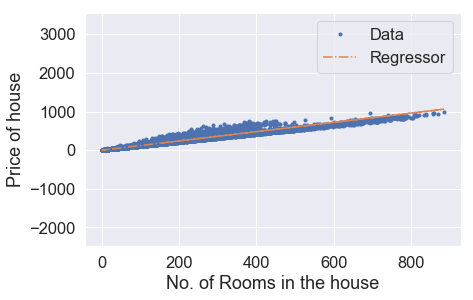

Iteration: 1241,Cost = 943.2308645137165,theta = [0.07318081 1.1985522 ]
Iteration: 1241,Cost_val = 947.4920446330965,theta = [0.07318081 1.1985522 ]


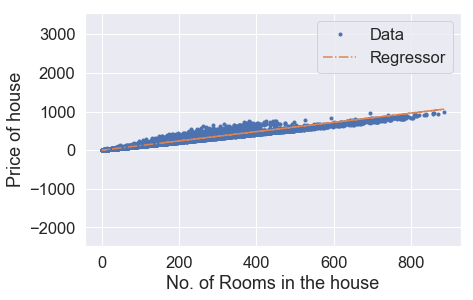

Iteration: 1251,Cost = 943.2282154858327,theta = [0.07369549 1.19855051]
Iteration: 1251,Cost_val = 947.4894415266203,theta = [0.07369549 1.19855051]


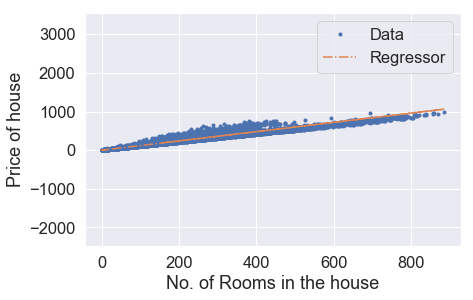

Iteration: 1261,Cost = 943.2255667195342,theta = [0.07421015 1.19854882]
Iteration: 1261,Cost_val = 947.4868386767408,theta = [0.07421015 1.19854882]


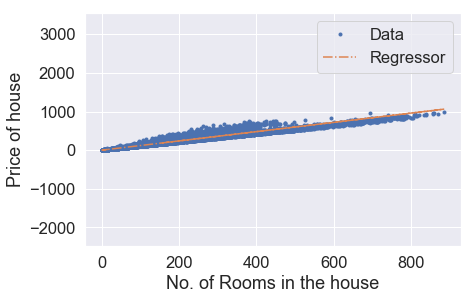

Iteration: 1271,Cost = 943.2229182147869,theta = [0.07472478 1.19854713]
Iteration: 1271,Cost_val = 947.4842360834294,theta = [0.07472478 1.19854713]


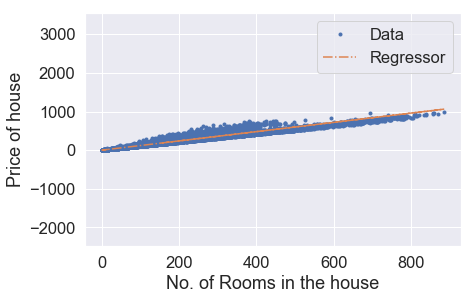

Iteration: 1281,Cost = 943.2202699715721,theta = [0.07523939 1.19854545]
Iteration: 1281,Cost_val = 947.4816337466622,theta = [0.07523939 1.19854545]


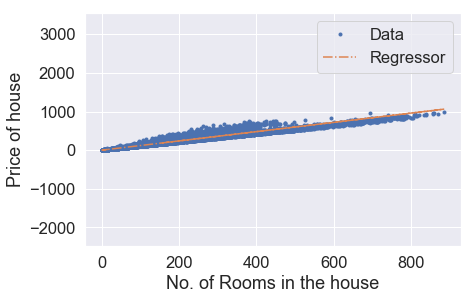

Iteration: 1291,Cost = 943.217621989851,theta = [0.07575398 1.19854376]
Iteration: 1291,Cost_val = 947.4790316664117,theta = [0.07575398 1.19854376]


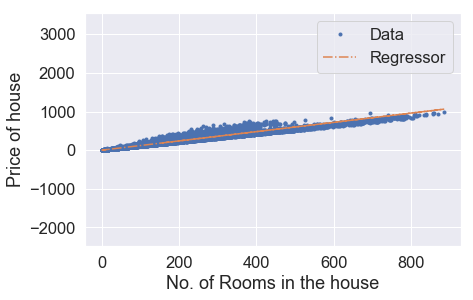

Iteration: 1301,Cost = 943.2149742696164,theta = [0.07626853 1.19854207]
Iteration: 1301,Cost_val = 947.4764298426571,theta = [0.07626853 1.19854207]


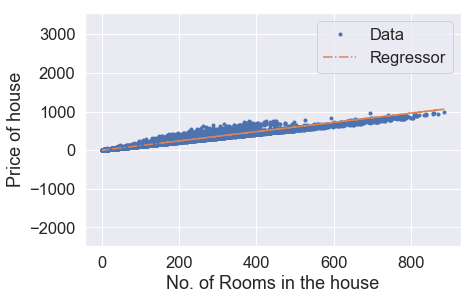

Iteration: 1311,Cost = 943.2123268108203,theta = [0.07678307 1.19854039]
Iteration: 1311,Cost_val = 947.4738282753665,theta = [0.07678307 1.19854039]


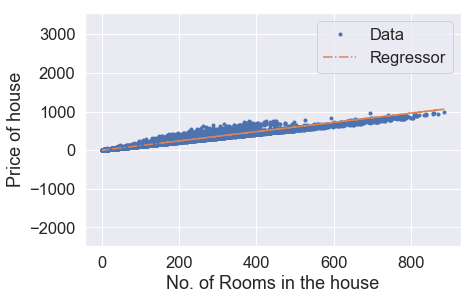

Iteration: 1321,Cost = 943.2096796134573,theta = [0.07729757 1.1985387 ]
Iteration: 1321,Cost_val = 947.4712269645188,theta = [0.07729757 1.1985387 ]


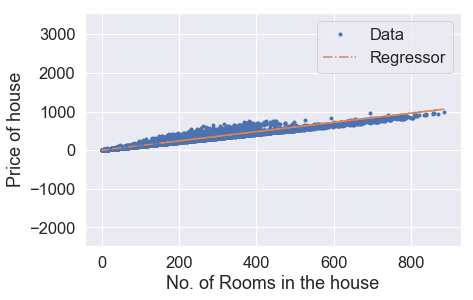

Iteration: 1331,Cost = 943.2070326774999,theta = [0.07781206 1.19853701]
Iteration: 1331,Cost_val = 947.46862591009,theta = [0.07781206 1.19853701]


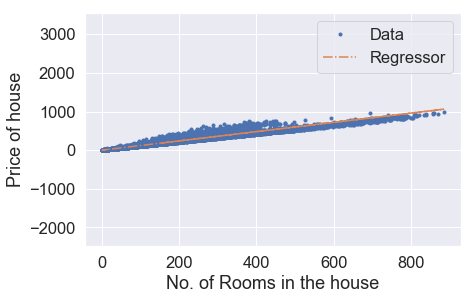

Iteration: 1341,Cost = 943.2043860029138,theta = [0.07832651 1.19853532]
Iteration: 1341,Cost_val = 947.4660251120483,theta = [0.07832651 1.19853532]


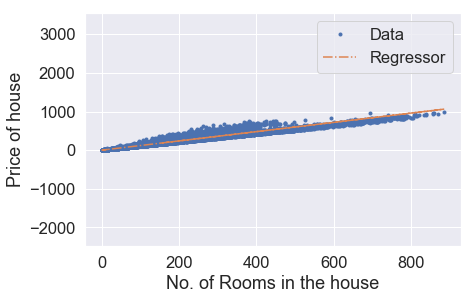

Iteration: 1351,Cost = 943.201739589666,theta = [0.07884094 1.19853364]
Iteration: 1351,Cost_val = 947.4634245703793,theta = [0.07884094 1.19853364]


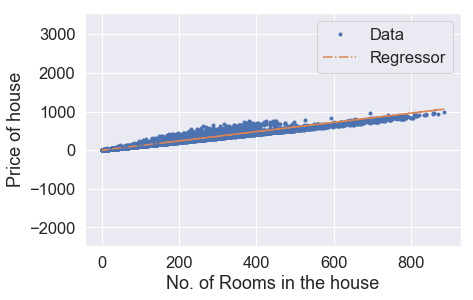

Iteration: 1361,Cost = 943.1990934377451,theta = [0.07935535 1.19853195]
Iteration: 1361,Cost_val = 947.460824285046,theta = [0.07935535 1.19853195]


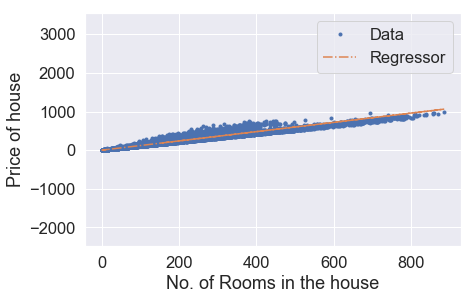

Iteration: 1371,Cost = 943.1964475471311,theta = [0.07986973 1.19853026]
Iteration: 1371,Cost_val = 947.4582242560335,theta = [0.07986973 1.19853026]


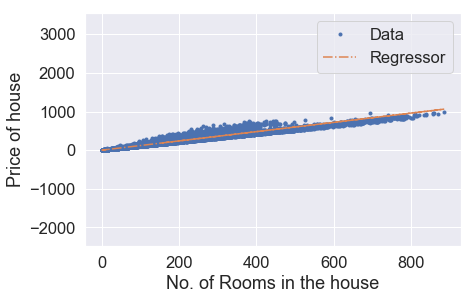

Iteration: 1381,Cost = 943.1938019177701,theta = [0.08038408 1.19852858]
Iteration: 1381,Cost_val = 947.4556244833079,theta = [0.08038408 1.19852858]


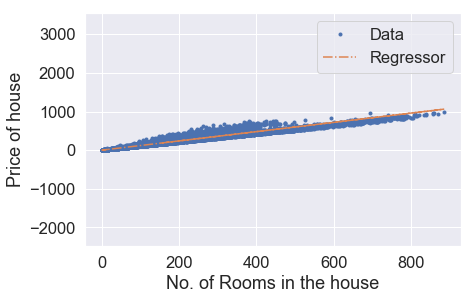

Iteration: 1391,Cost = 943.1911565496533,theta = [0.08089841 1.19852689]
Iteration: 1391,Cost_val = 947.4530249668454,theta = [0.08089841 1.19852689]


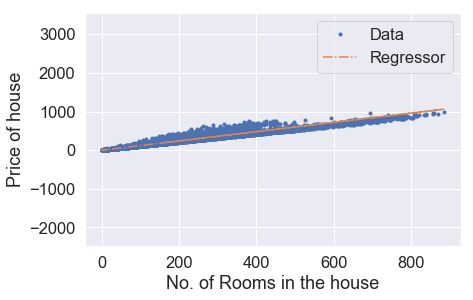

Iteration: 1401,Cost = 943.18851144277,theta = [0.08141272 1.1985252 ]
Iteration: 1401,Cost_val = 947.4504257066307,theta = [0.08141272 1.1985252 ]


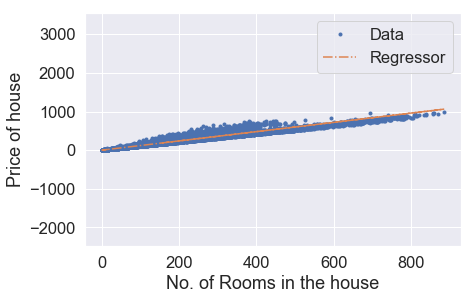

Iteration: 1411,Cost = 943.1858665970802,theta = [0.08192699 1.19852352]
Iteration: 1411,Cost_val = 947.4478267026246,theta = [0.08192699 1.19852352]


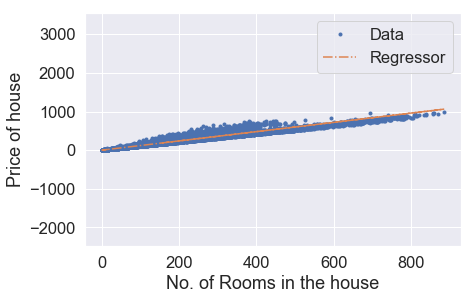

Iteration: 1421,Cost = 943.1832220125383,theta = [0.08244125 1.19852183]
Iteration: 1421,Cost_val = 947.4452279548121,theta = [0.08244125 1.19852183]


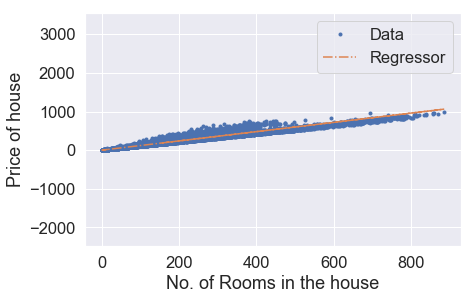

Iteration: 1431,Cost = 943.1805776891485,theta = [0.08295548 1.19852015]
Iteration: 1431,Cost_val = 947.4426294631577,theta = [0.08295548 1.19852015]


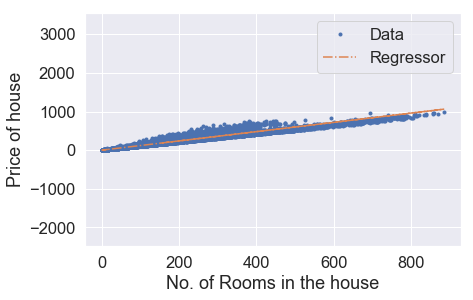

Iteration: 1441,Cost = 943.177933626869,theta = [0.08346968 1.19851846]
Iteration: 1441,Cost_val = 947.440031227644,theta = [0.08346968 1.19851846]


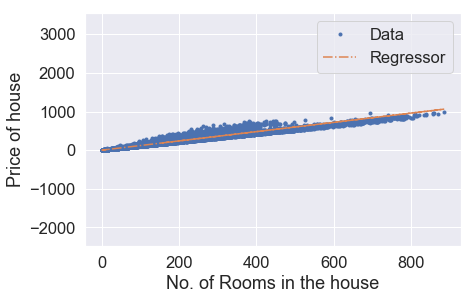

Iteration: 1451,Cost = 943.1752898256868,theta = [0.08398385 1.19851677]
Iteration: 1451,Cost_val = 947.4374332482474,theta = [0.08398385 1.19851677]


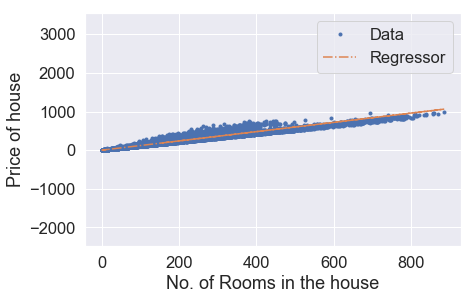

Iteration: 1461,Cost = 943.1726462855639,theta = [0.08449801 1.19851509]
Iteration: 1461,Cost_val = 947.4348355249382,theta = [0.08449801 1.19851509]


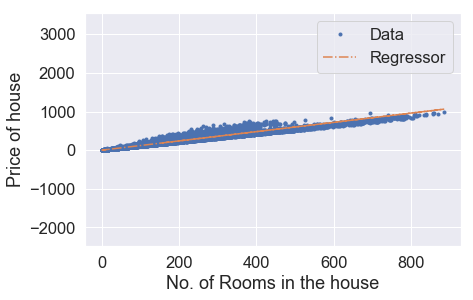

Iteration: 1471,Cost = 943.170003006483,theta = [0.08501213 1.1985134 ]
Iteration: 1471,Cost_val = 947.4322380576906,theta = [0.08501213 1.1985134 ]


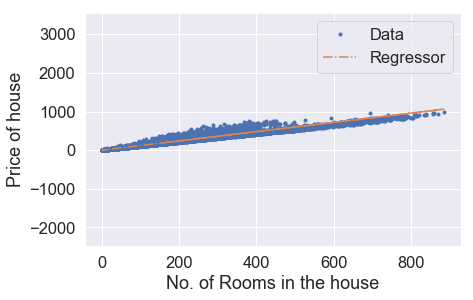

Iteration: 1481,Cost = 943.1673599884141,theta = [0.08552623 1.19851172]
Iteration: 1481,Cost_val = 947.4296408464805,theta = [0.08552623 1.19851172]


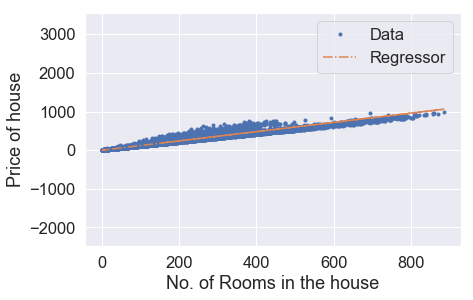

Iteration: 1491,Cost = 943.1647172313352,theta = [0.08604031 1.19851003]
Iteration: 1491,Cost_val = 947.4270438912865,theta = [0.08604031 1.19851003]


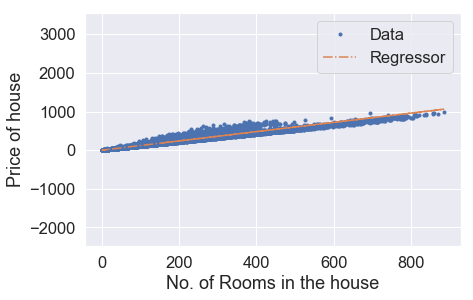

Iteration: 1501,Cost = 943.1620747352101,theta = [0.08655436 1.19850834]
Iteration: 1501,Cost_val = 947.424447192076,theta = [0.08655436 1.19850834]


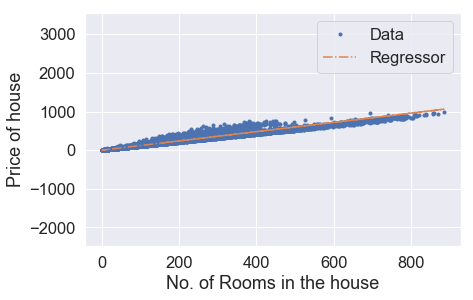

Iteration: 1511,Cost = 943.1594325000246,theta = [0.08706838 1.19850666]
Iteration: 1511,Cost_val = 947.4218507488265,theta = [0.08706838 1.19850666]


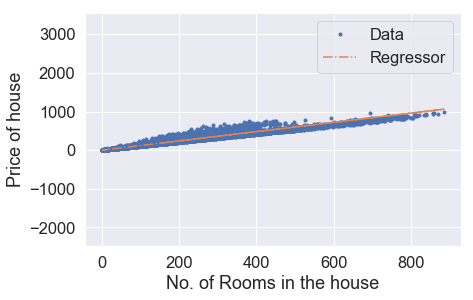

Iteration: 1521,Cost = 943.1567905257434,theta = [0.08758238 1.19850497]
Iteration: 1521,Cost_val = 947.419254561515,theta = [0.08758238 1.19850497]


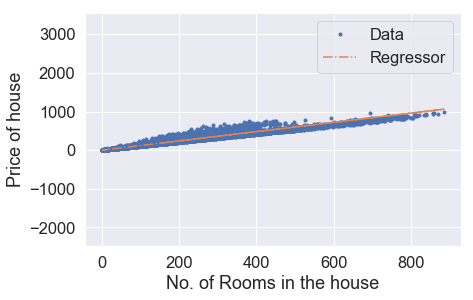

Iteration: 1531,Cost = 943.1541488123474,theta = [0.08809636 1.19850329]
Iteration: 1531,Cost_val = 947.4166586301193,theta = [0.08809636 1.19850329]


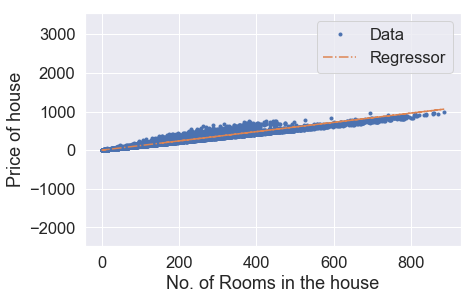

Iteration: 1541,Cost = 943.1515073598059,theta = [0.0886103 1.1985016]
Iteration: 1541,Cost_val = 947.414062954608,theta = [0.0886103 1.1985016]


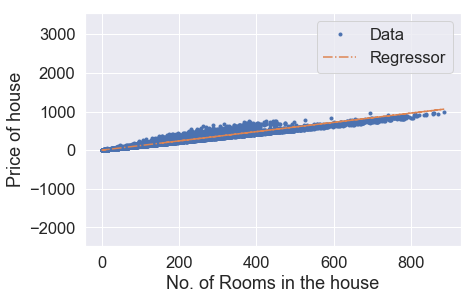

Iteration: 1551,Cost = 943.1488661681024,theta = [0.08912423 1.19849992]
Iteration: 1551,Cost_val = 947.4114675349549,theta = [0.08912423 1.19849992]


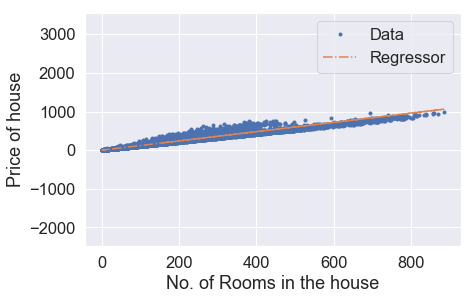

Iteration: 1561,Cost = 943.146225237187,theta = [0.08963813 1.19849823]
Iteration: 1561,Cost_val = 947.4088723711369,theta = [0.08963813 1.19849823]


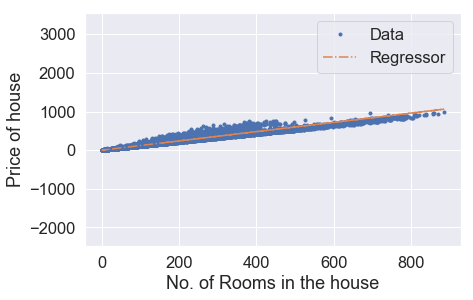

Iteration: 1571,Cost = 943.1435845670825,theta = [0.090152   1.19849655]
Iteration: 1571,Cost_val = 947.406277463133,theta = [0.090152   1.19849655]


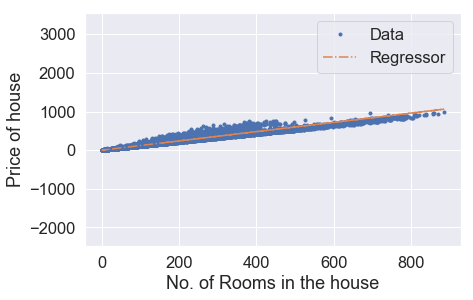

Iteration: 1581,Cost = 943.1409441577208,theta = [0.09066585 1.19849486]
Iteration: 1581,Cost_val = 947.403682810913,theta = [0.09066585 1.19849486]


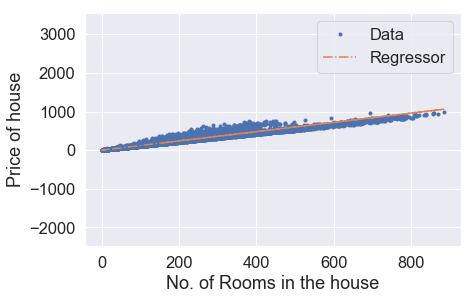

Iteration: 1591,Cost = 943.1383040090811,theta = [0.09117967 1.19849318]
Iteration: 1591,Cost_val = 947.401088414452,theta = [0.09117967 1.19849318]


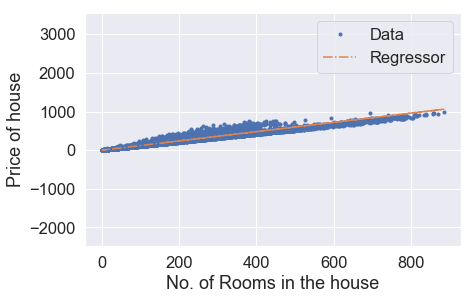

Iteration: 1601,Cost = 943.1356641211537,theta = [0.09169346 1.19849149]
Iteration: 1601,Cost_val = 947.3984942737261,theta = [0.09169346 1.19849149]


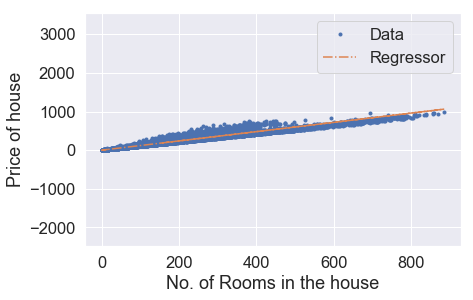

Iteration: 1611,Cost = 943.1330244938877,theta = [0.09220723 1.19848981]
Iteration: 1611,Cost_val = 947.3959003887111,theta = [0.09220723 1.19848981]


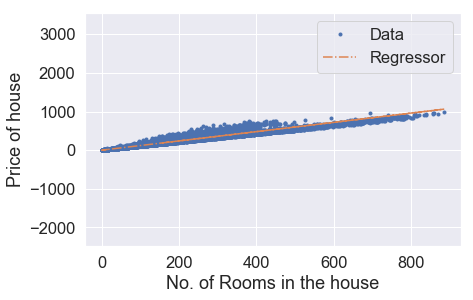

Iteration: 1621,Cost = 943.1303851272891,theta = [0.09272098 1.19848812]
Iteration: 1621,Cost_val = 947.393306759378,theta = [0.09272098 1.19848812]


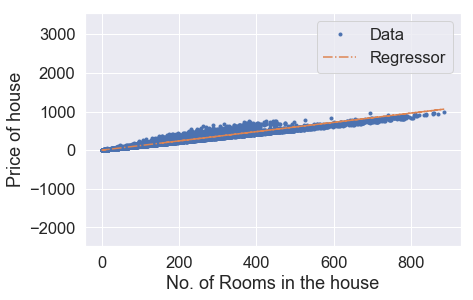

Iteration: 1631,Cost = 943.1277460213244,theta = [0.0932347  1.19848644]
Iteration: 1631,Cost_val = 947.3907133857065,theta = [0.0932347  1.19848644]


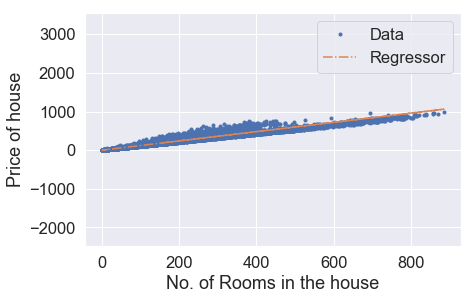

Iteration: 1641,Cost = 943.1251071759248,theta = [0.09374839 1.19848476]
Iteration: 1641,Cost_val = 947.388120267672,theta = [0.09374839 1.19848476]


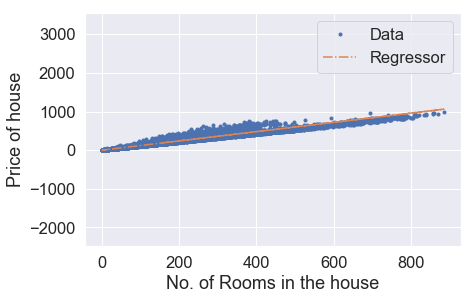

Iteration: 1651,Cost = 943.1224685911353,theta = [0.09426206 1.19848307]
Iteration: 1651,Cost_val = 947.3855274052413,theta = [0.09426206 1.19848307]


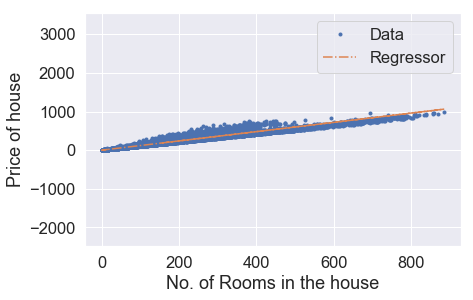

Iteration: 1661,Cost = 943.1198302668854,theta = [0.09477571 1.19848139]
Iteration: 1661,Cost_val = 947.3829347983924,theta = [0.09477571 1.19848139]


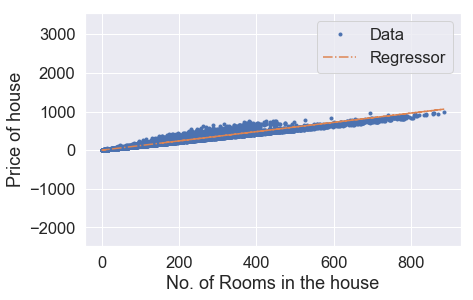

Iteration: 1671,Cost = 943.1171922031535,theta = [0.09528933 1.1984797 ]
Iteration: 1671,Cost_val = 947.3803424471068,theta = [0.09528933 1.1984797 ]


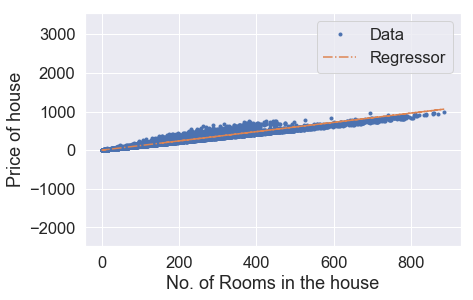

Iteration: 1681,Cost = 943.1145543999203,theta = [0.09580292 1.19847802]
Iteration: 1681,Cost_val = 947.3777503513508,theta = [0.09580292 1.19847802]


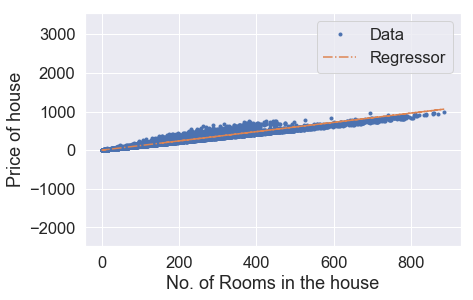

Iteration: 1691,Cost = 943.1119168571536,theta = [0.09631649 1.19847633]
Iteration: 1691,Cost_val = 947.3751585111039,theta = [0.09631649 1.19847633]


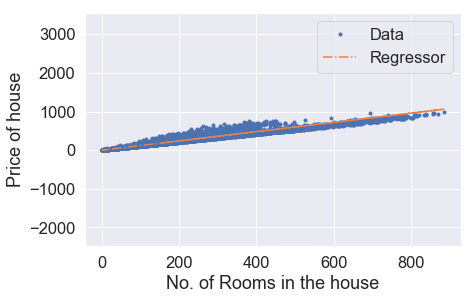

Iteration: 1701,Cost = 943.1092795748511,theta = [0.09683003 1.19847465]
Iteration: 1701,Cost_val = 947.3725669263401,theta = [0.09683003 1.19847465]


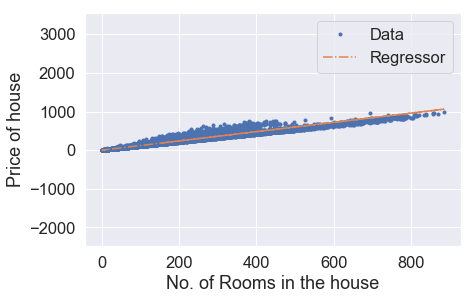

Iteration: 1711,Cost = 943.1066425529546,theta = [0.09734355 1.19847297]
Iteration: 1711,Cost_val = 947.3699755970318,theta = [0.09734355 1.19847297]


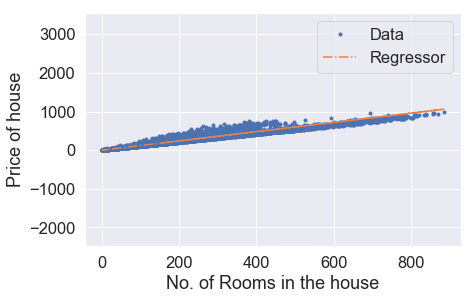

Iteration: 1721,Cost = 943.1040057914447,theta = [0.09785704 1.19847128]
Iteration: 1721,Cost_val = 947.3673845231572,theta = [0.09785704 1.19847128]


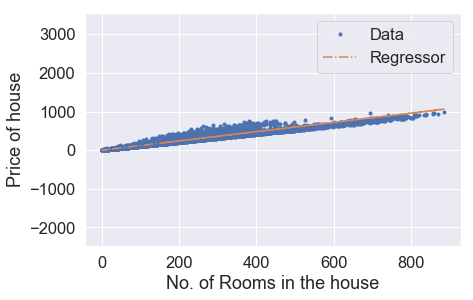

Iteration: 1731,Cost = 943.1013692903136,theta = [0.09837051 1.1984696 ]
Iteration: 1731,Cost_val = 947.3647937046895,theta = [0.09837051 1.1984696 ]


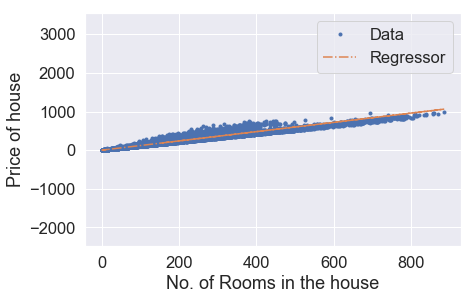

Iteration: 1741,Cost = 943.0987330495245,theta = [0.09888395 1.19846792]
Iteration: 1741,Cost_val = 947.3622031416054,theta = [0.09888395 1.19846792]


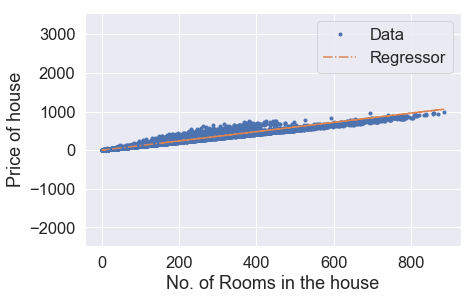

Iteration: 1751,Cost = 943.0960970690609,theta = [0.09939736 1.19846623]
Iteration: 1751,Cost_val = 947.359612833876,theta = [0.09939736 1.19846623]


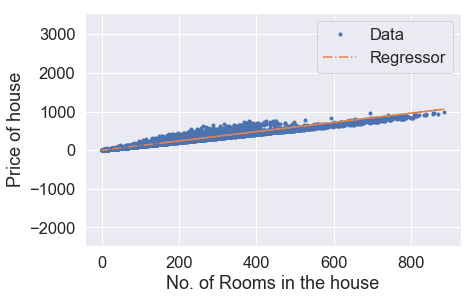

Iteration: 1761,Cost = 943.0934613488716,theta = [0.09991075 1.19846455]
Iteration: 1761,Cost_val = 947.3570227814816,theta = [0.09991075 1.19846455]


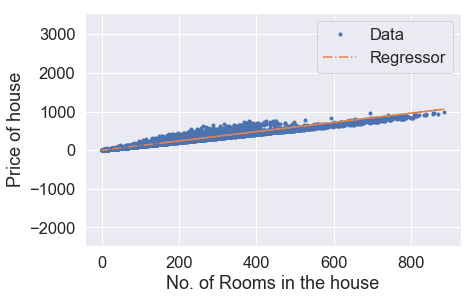

Iteration: 1771,Cost = 943.0908258889541,theta = [0.10042412 1.19846287]
Iteration: 1771,Cost_val = 947.3544329843866,theta = [0.10042412 1.19846287]


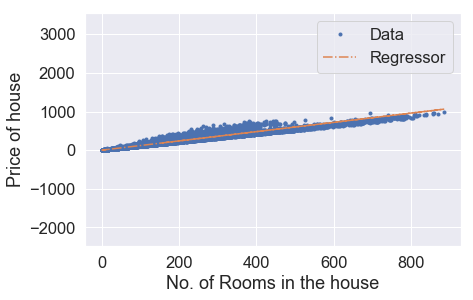

Iteration: 1781,Cost = 943.0881906892848,theta = [0.10093746 1.19846118]
Iteration: 1781,Cost_val = 947.3518434425771,theta = [0.10093746 1.19846118]


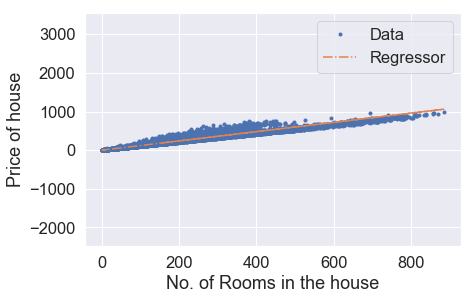

Iteration: 1791,Cost = 943.0855557498201,theta = [0.10145077 1.1984595 ]
Iteration: 1791,Cost_val = 947.3492541560203,theta = [0.10145077 1.1984595 ]


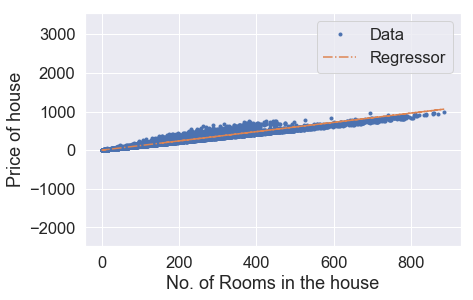

Iteration: 1801,Cost = 943.08292107056,theta = [0.10196406 1.19845782]
Iteration: 1801,Cost_val = 947.3466651246982,theta = [0.10196406 1.19845782]


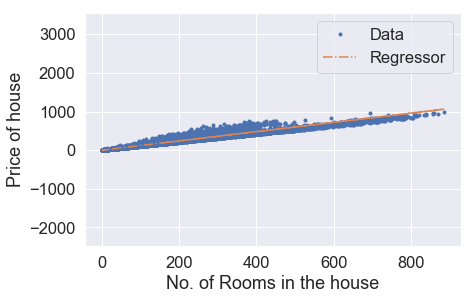

Iteration: 1811,Cost = 943.08028665145,theta = [0.10247733 1.19845613]
Iteration: 1811,Cost_val = 947.34407634858,theta = [0.10247733 1.19845613]


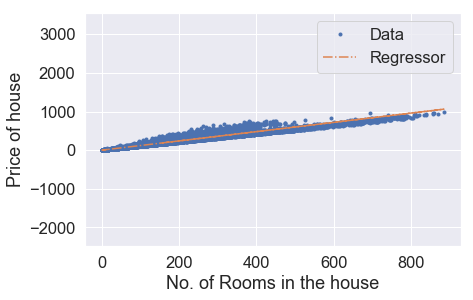

Iteration: 1821,Cost = 943.077652492474,theta = [0.10299056 1.19845445]
Iteration: 1821,Cost_val = 947.3414878276457,theta = [0.10299056 1.19845445]


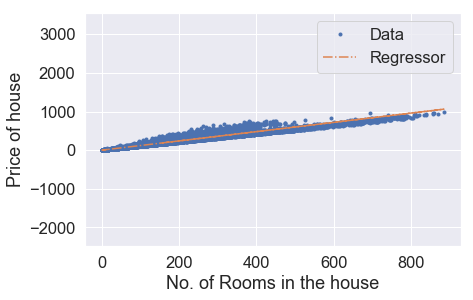

Iteration: 1831,Cost = 943.0750185936201,theta = [0.10350378 1.19845277]
Iteration: 1831,Cost_val = 947.3388995618599,theta = [0.10350378 1.19845277]


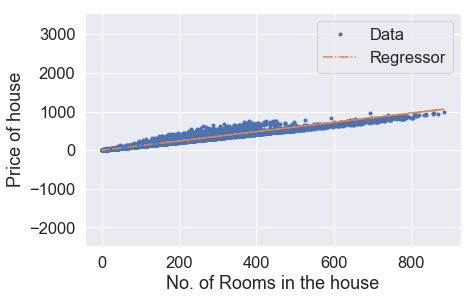

Iteration: 1841,Cost = 943.0723849548432,theta = [0.10401697 1.19845108]
Iteration: 1841,Cost_val = 947.3363115512083,theta = [0.10401697 1.19845108]


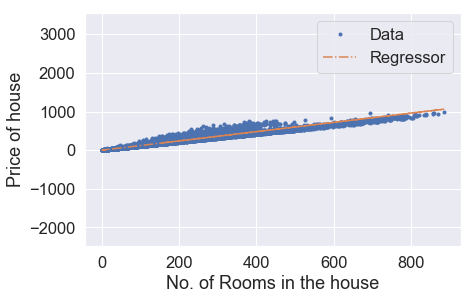

Iteration: 1851,Cost = 943.0697515761291,theta = [0.10453013 1.1984494 ]
Iteration: 1851,Cost_val = 947.333723795658,theta = [0.10453013 1.1984494 ]


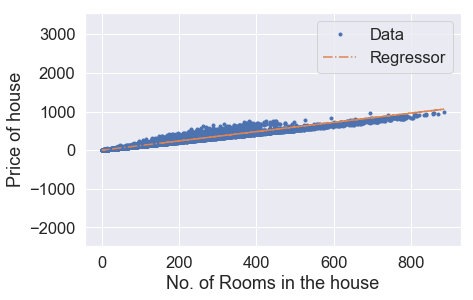

Iteration: 1861,Cost = 943.0671184574626,theta = [0.10504327 1.19844772]
Iteration: 1861,Cost_val = 947.3311362951923,theta = [0.10504327 1.19844772]


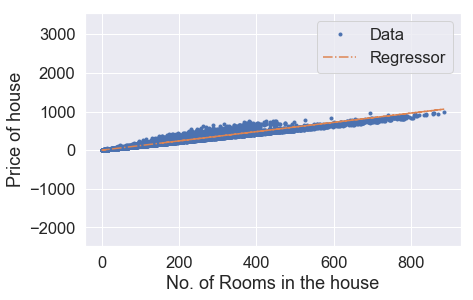

Iteration: 1871,Cost = 943.0644855987828,theta = [0.10555638 1.19844604]
Iteration: 1871,Cost_val = 947.3285490497802,theta = [0.10555638 1.19844604]


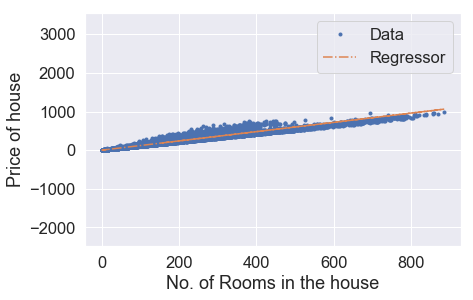

Iteration: 1881,Cost = 943.0618530000943,theta = [0.10606946 1.19844435]
Iteration: 1881,Cost_val = 947.3259620593924,theta = [0.10606946 1.19844435]


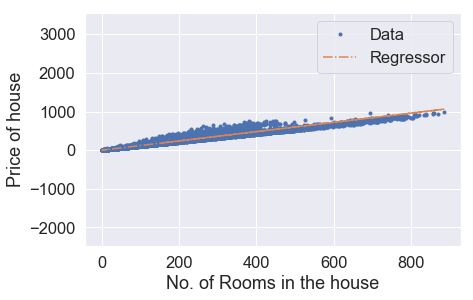

Iteration: 1891,Cost = 943.0592206613755,theta = [0.10658252 1.19844267]
Iteration: 1891,Cost_val = 947.323375324014,theta = [0.10658252 1.19844267]


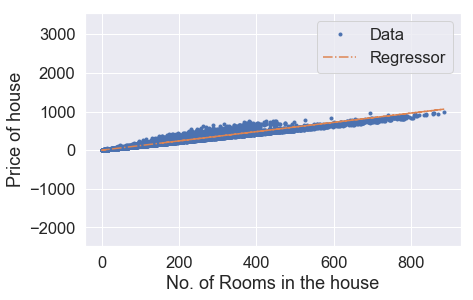

Iteration: 1901,Cost = 943.0565885825837,theta = [0.10709556 1.19844099]
Iteration: 1901,Cost_val = 947.3207888436136,theta = [0.10709556 1.19844099]


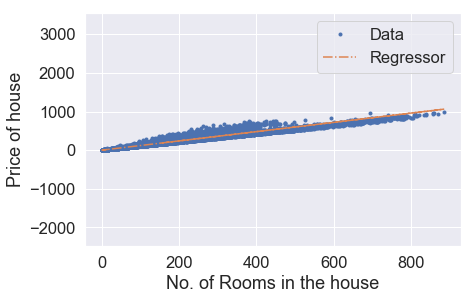

Iteration: 1911,Cost = 943.0539567636818,theta = [0.10760857 1.19843931]
Iteration: 1911,Cost_val = 947.318202618167,theta = [0.10760857 1.19843931]


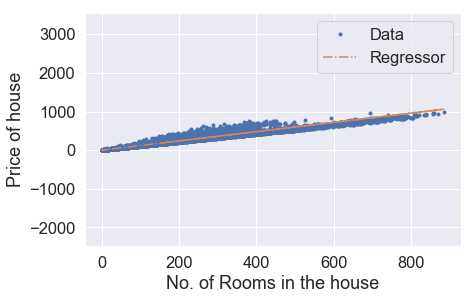

Iteration: 1921,Cost = 943.051325204674,theta = [0.10812156 1.19843762]
Iteration: 1921,Cost_val = 947.3156166476494,theta = [0.10812156 1.19843762]


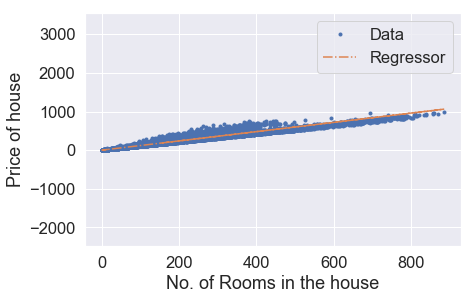

Iteration: 1931,Cost = 943.0486939055338,theta = [0.10863452 1.19843594]
Iteration: 1931,Cost_val = 947.313030932032,theta = [0.10863452 1.19843594]


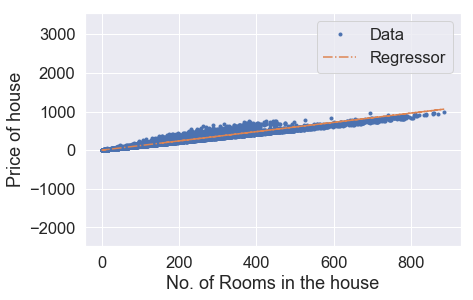

Iteration: 1941,Cost = 943.046062866207,theta = [0.10914745 1.19843426]
Iteration: 1941,Cost_val = 947.310445471295,theta = [0.10914745 1.19843426]


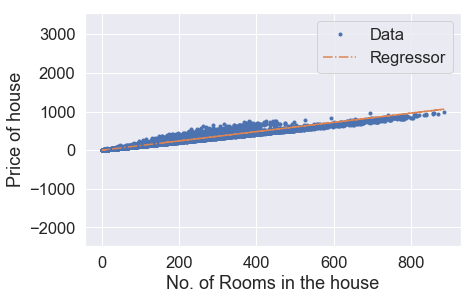

Iteration: 1951,Cost = 943.0434320866827,theta = [0.10966036 1.19843258]
Iteration: 1951,Cost_val = 947.3078602654118,theta = [0.10966036 1.19843258]


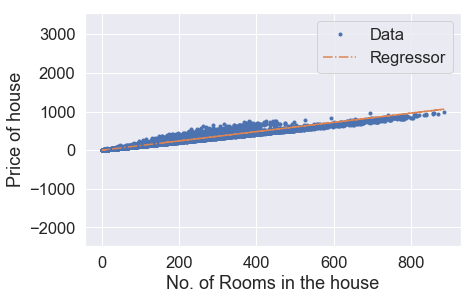

Iteration: 1961,Cost = 943.0408015669433,theta = [0.11017324 1.1984309 ]
Iteration: 1961,Cost_val = 947.3052753143604,theta = [0.11017324 1.1984309 ]


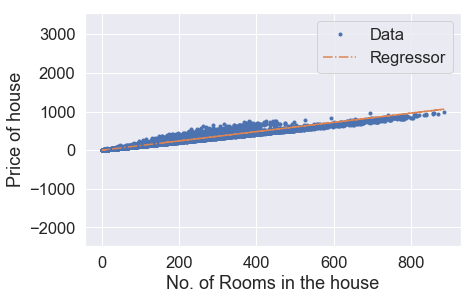

Iteration: 1971,Cost = 943.0381713069572,theta = [0.1106861  1.19842922]
Iteration: 1971,Cost_val = 947.3026906181053,theta = [0.1106861  1.19842922]


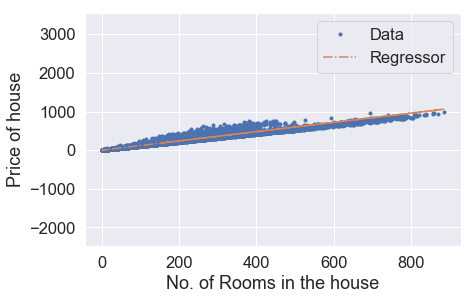

Iteration: 1981,Cost = 943.0355413066911,theta = [0.11119893 1.19842753]
Iteration: 1981,Cost_val = 947.3001061766303,theta = [0.11119893 1.19842753]


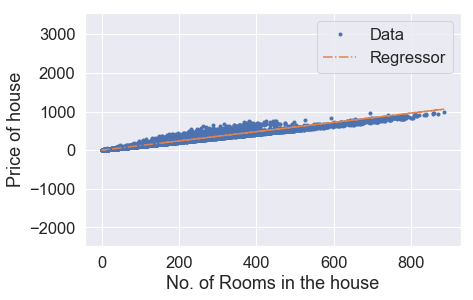

Iteration: 1991,Cost = 943.0329115661292,theta = [0.11171174 1.19842585]
Iteration: 1991,Cost_val = 947.2975219899055,theta = [0.11171174 1.19842585]


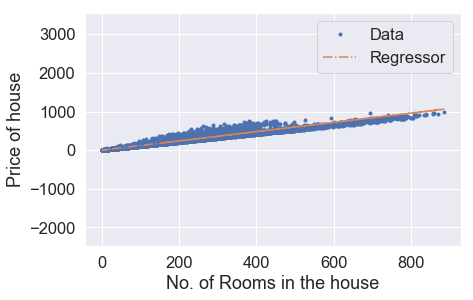

Iteration: 2001,Cost = 943.0302820852468,theta = [0.11222453 1.19842417]
Iteration: 2001,Cost_val = 947.2949380579139,theta = [0.11222453 1.19842417]


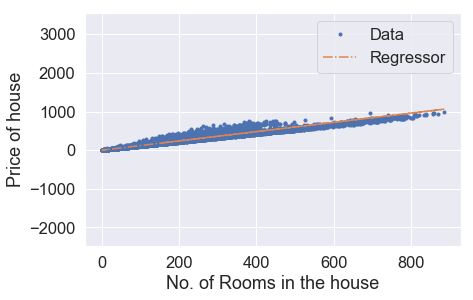

Iteration: 2011,Cost = 943.0276528640056,theta = [0.11273728 1.19842249]
Iteration: 2011,Cost_val = 947.2923543806238,theta = [0.11273728 1.19842249]


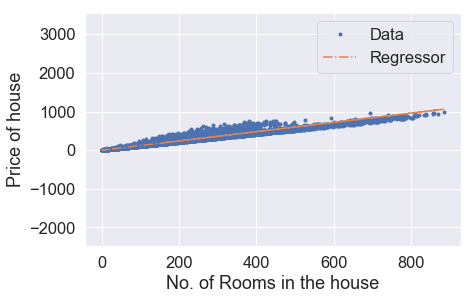

Iteration: 2021,Cost = 943.0250239024093,theta = [0.11325001 1.19842081]
Iteration: 2021,Cost_val = 947.2897709580086,theta = [0.11325001 1.19842081]


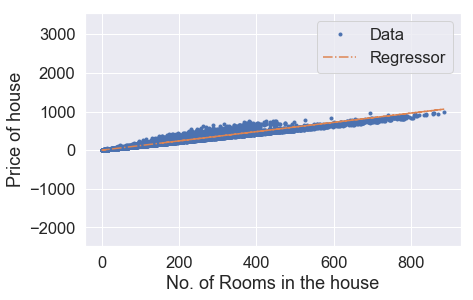

Iteration: 2031,Cost = 943.022395200391,theta = [0.11376272 1.19841913]
Iteration: 2031,Cost_val = 947.2871877900466,theta = [0.11376272 1.19841913]


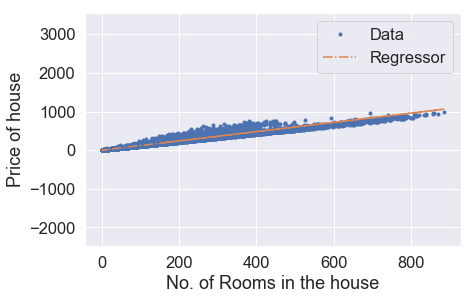

Iteration: 2041,Cost = 943.0197667579499,theta = [0.1142754  1.19841745]
Iteration: 2041,Cost_val = 947.2846048767115,theta = [0.1142754  1.19841745]


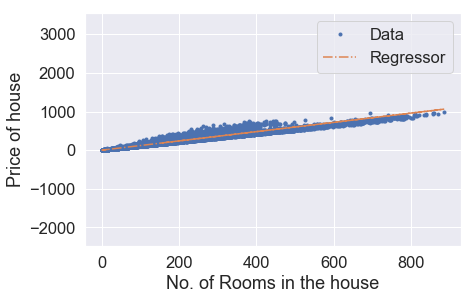

Iteration: 2051,Cost = 943.0171385750479,theta = [0.11478806 1.19841577]
Iteration: 2051,Cost_val = 947.2820222179777,theta = [0.11478806 1.19841577]


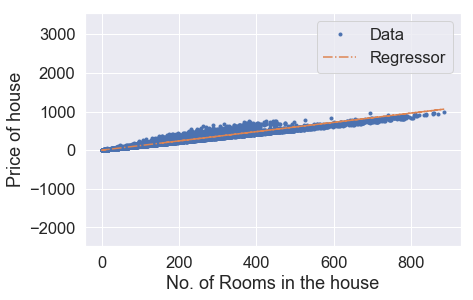

Iteration: 2061,Cost = 943.0145106516752,theta = [0.11530069 1.19841408]
Iteration: 2061,Cost_val = 947.2794398138229,theta = [0.11530069 1.19841408]


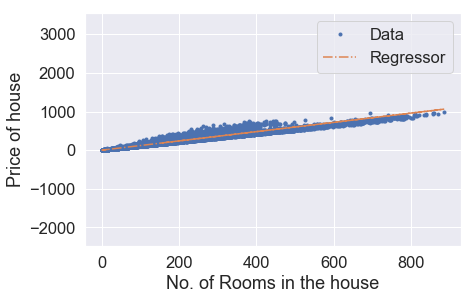

Iteration: 2071,Cost = 943.0118829877947,theta = [0.11581329 1.1984124 ]
Iteration: 2071,Cost_val = 947.2768576642162,theta = [0.11581329 1.1984124 ]


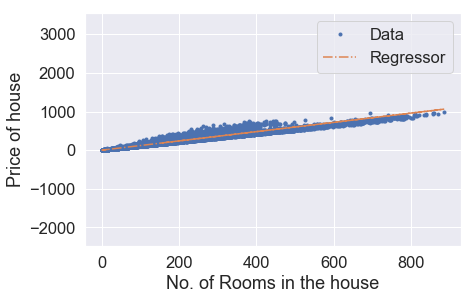

Iteration: 2081,Cost = 943.0092555834016,theta = [0.11632587 1.19841072]
Iteration: 2081,Cost_val = 947.2742757691414,theta = [0.11632587 1.19841072]


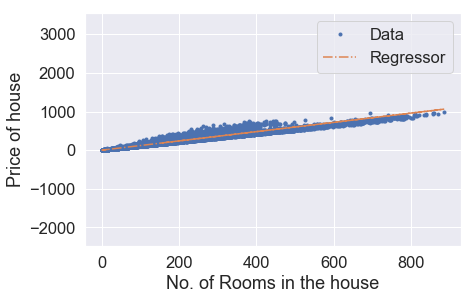

Iteration: 2091,Cost = 943.00662843844,theta = [0.11683843 1.19840904]
Iteration: 2091,Cost_val = 947.2716941285637,theta = [0.11683843 1.19840904]


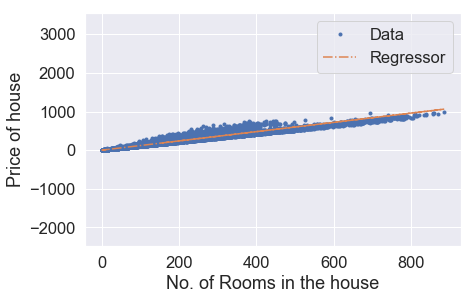

Iteration: 2101,Cost = 943.0040015528994,theta = [0.11735096 1.19840736]
Iteration: 2101,Cost_val = 947.2691127424617,theta = [0.11735096 1.19840736]


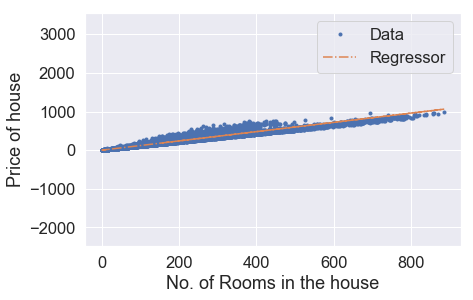

Iteration: 2111,Cost = 943.0013749267431,theta = [0.11786346 1.19840568]
Iteration: 2111,Cost_val = 947.2665316108125,theta = [0.11786346 1.19840568]


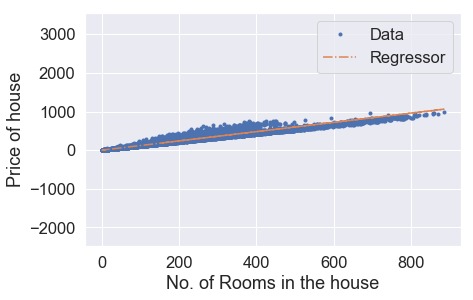

Iteration: 2121,Cost = 942.998748559972,theta = [0.11837594 1.198404  ]
Iteration: 2121,Cost_val = 947.2639507335913,theta = [0.11837594 1.198404  ]


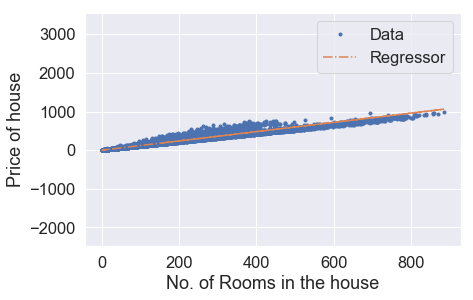

Iteration: 2131,Cost = 942.996122452525,theta = [0.11888839 1.19840232]
Iteration: 2131,Cost_val = 947.2613701107692,theta = [0.11888839 1.19840232]


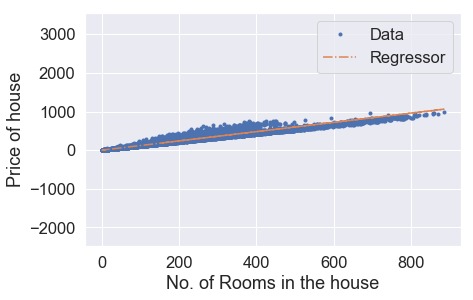

Iteration: 2141,Cost = 942.9934966044108,theta = [0.11940082 1.19840064]
Iteration: 2141,Cost_val = 947.2587897423198,theta = [0.11940082 1.19840064]


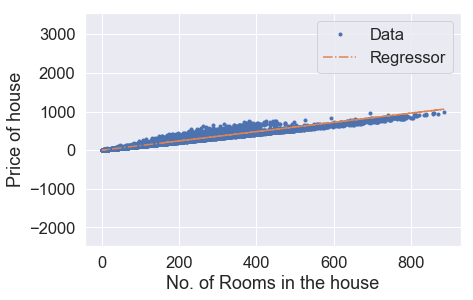

Iteration: 2151,Cost = 942.990871015581,theta = [0.11991323 1.19839896]
Iteration: 2151,Cost_val = 947.2562096282294,theta = [0.11991323 1.19839896]


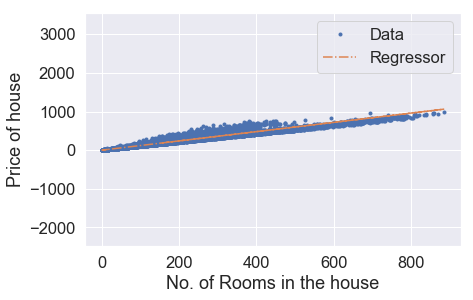

Iteration: 2161,Cost = 942.9882456860174,theta = [0.1204256  1.19839728]
Iteration: 2161,Cost_val = 947.2536297684561,theta = [0.1204256  1.19839728]


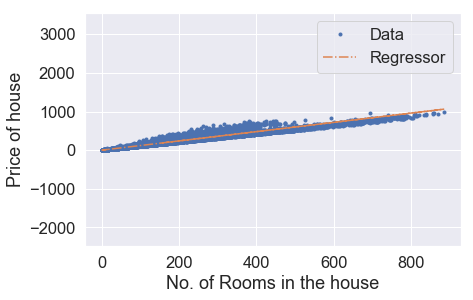

Iteration: 2171,Cost = 942.9856206156927,theta = [0.12093796 1.1983956 ]
Iteration: 2171,Cost_val = 947.2510501629876,theta = [0.12093796 1.1983956 ]


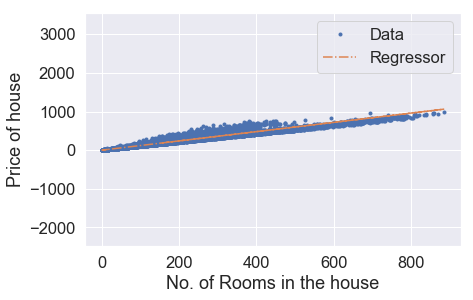

Iteration: 2181,Cost = 942.9829958045882,theta = [0.12145028 1.19839392]
Iteration: 2181,Cost_val = 947.2484708117969,theta = [0.12145028 1.19839392]


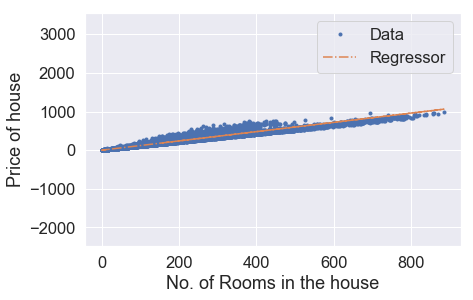

Iteration: 2191,Cost = 942.9803712526538,theta = [0.12196258 1.19839224]
Iteration: 2191,Cost_val = 947.2458917148557,theta = [0.12196258 1.19839224]


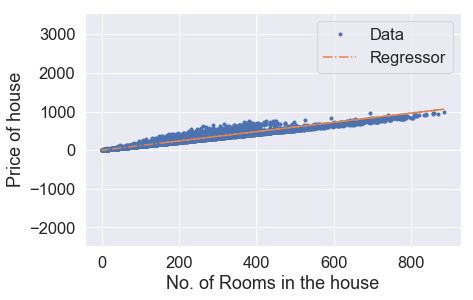

Iteration: 2201,Cost = 942.9777469598939,theta = [0.12247486 1.19839056]
Iteration: 2201,Cost_val = 947.2433128721364,theta = [0.12247486 1.19839056]


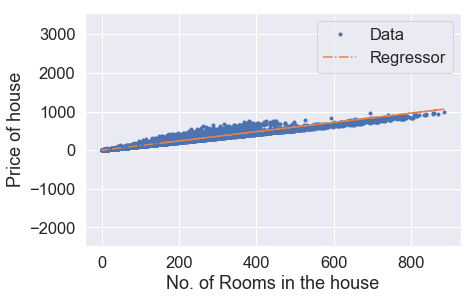

Iteration: 2211,Cost = 942.9751229262831,theta = [0.12298711 1.19838888]
Iteration: 2211,Cost_val = 947.2407342836235,theta = [0.12298711 1.19838888]


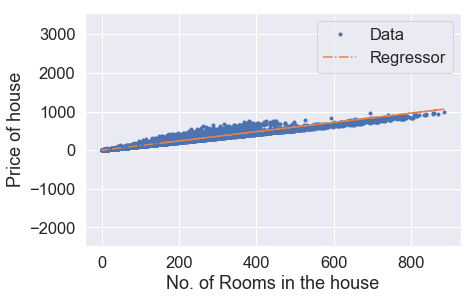

Iteration: 2221,Cost = 942.9724991517736,theta = [0.12349934 1.1983872 ]
Iteration: 2221,Cost_val = 947.2381559492744,theta = [0.12349934 1.1983872 ]


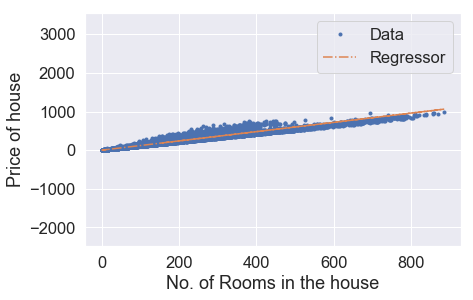

Iteration: 2231,Cost = 942.9698756363512,theta = [0.12401154 1.19838552]
Iteration: 2231,Cost_val = 947.235577869087,theta = [0.12401154 1.19838552]


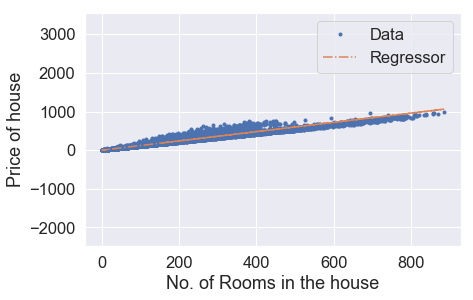

Iteration: 2241,Cost = 942.9672523799837,theta = [0.12452371 1.19838384]
Iteration: 2241,Cost_val = 947.2330000430206,theta = [0.12452371 1.19838384]


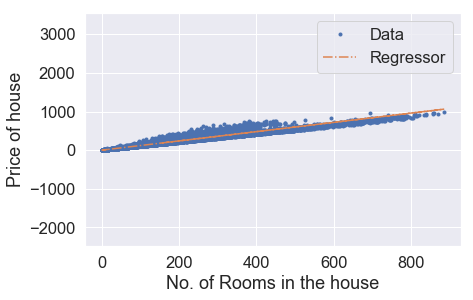

Iteration: 2251,Cost = 942.9646293826601,theta = [0.12503586 1.19838216]
Iteration: 2251,Cost_val = 947.2304224710542,theta = [0.12503586 1.19838216]


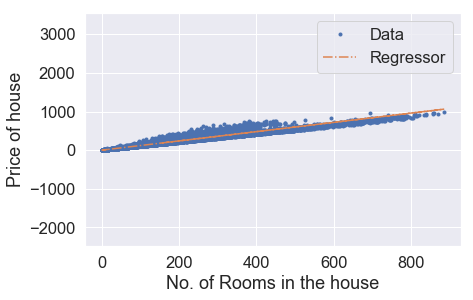

Iteration: 2261,Cost = 942.9620066443489,theta = [0.12554799 1.19838048]
Iteration: 2261,Cost_val = 947.2278451531615,theta = [0.12554799 1.19838048]


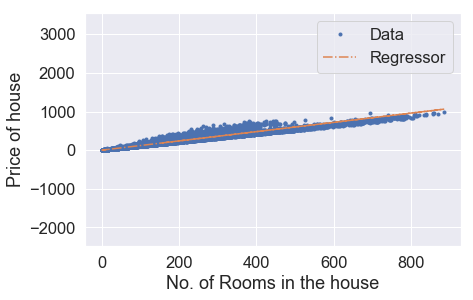

Iteration: 2271,Cost = 942.9593841650066,theta = [0.12606009 1.1983788 ]
Iteration: 2271,Cost_val = 947.2252680893238,theta = [0.12606009 1.1983788 ]


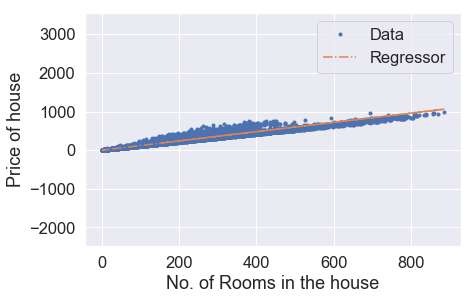

Iteration: 2281,Cost = 942.956761944632,theta = [0.12657216 1.19837712]
Iteration: 2281,Cost_val = 947.2226912795041,theta = [0.12657216 1.19837712]


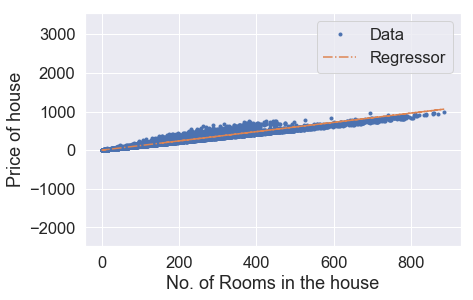

Iteration: 2291,Cost = 942.9541399831958,theta = [0.12708421 1.19837545]
Iteration: 2291,Cost_val = 947.220114723686,theta = [0.12708421 1.19837545]


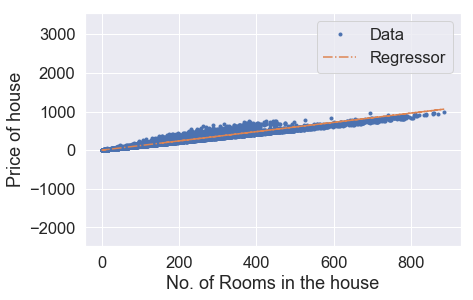

Iteration: 2301,Cost = 942.9515182806529,theta = [0.12759623 1.19837377]
Iteration: 2301,Cost_val = 947.2175384218473,theta = [0.12759623 1.19837377]


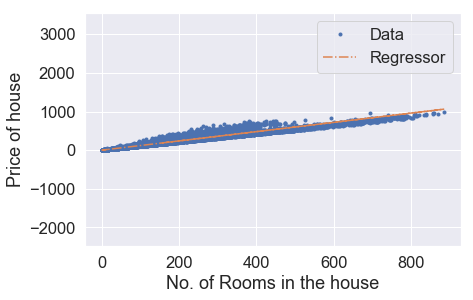

Iteration: 2311,Cost = 942.9488968370046,theta = [0.12810823 1.19837209]
Iteration: 2311,Cost_val = 947.2149623739508,theta = [0.12810823 1.19837209]


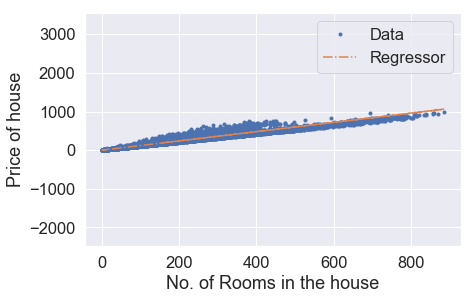

Iteration: 2321,Cost = 942.9462756522138,theta = [0.1286202  1.19837041]
Iteration: 2321,Cost_val = 947.2123865799879,theta = [0.1286202  1.19837041]


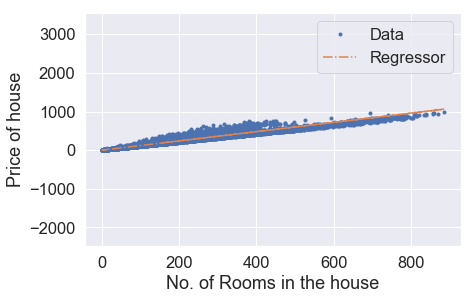

Iteration: 2331,Cost = 942.9436547262519,theta = [0.12913215 1.19836873]
Iteration: 2331,Cost_val = 947.2098110399181,theta = [0.12913215 1.19836873]


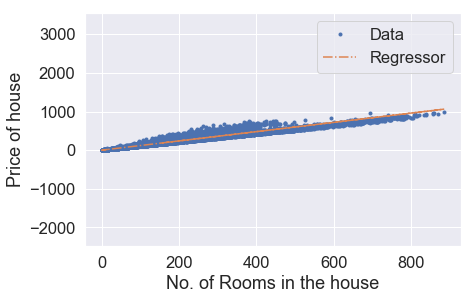

Iteration: 2341,Cost = 942.9410340590838,theta = [0.12964407 1.19836705]
Iteration: 2341,Cost_val = 947.2072357537239,theta = [0.12964407 1.19836705]


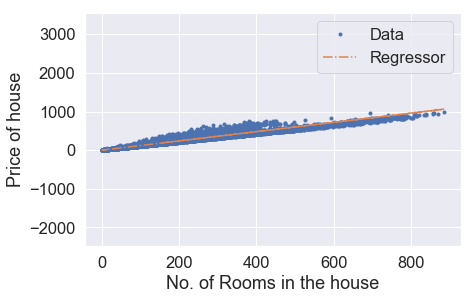

Iteration: 2351,Cost = 942.9384136507051,theta = [0.13015597 1.19836537]
Iteration: 2351,Cost_val = 947.2046607213814,theta = [0.13015597 1.19836537]


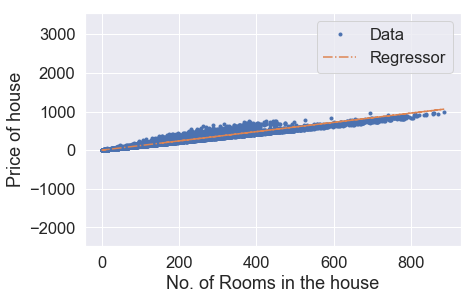

Iteration: 2361,Cost = 942.9357935010764,theta = [0.13066784 1.19836369]
Iteration: 2361,Cost_val = 947.2020859428593,theta = [0.13066784 1.19836369]


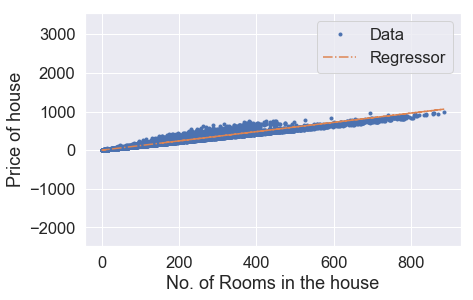

Iteration: 2371,Cost = 942.9331736101792,theta = [0.13117969 1.19836202]
Iteration: 2371,Cost_val = 947.1995114181385,theta = [0.13117969 1.19836202]


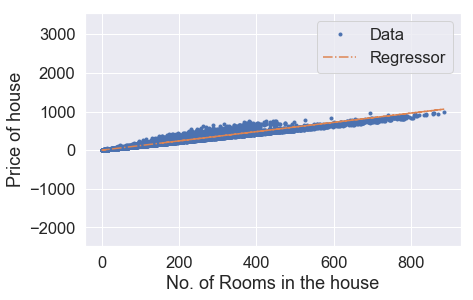

Iteration: 2381,Cost = 942.9305539779856,theta = [0.13169151 1.19836034]
Iteration: 2381,Cost_val = 947.196937147193,theta = [0.13169151 1.19836034]


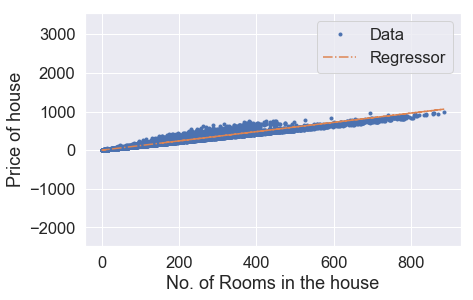

Iteration: 2391,Cost = 942.9279346044634,theta = [0.13220331 1.19835866]
Iteration: 2391,Cost_val = 947.1943631299963,theta = [0.13220331 1.19835866]


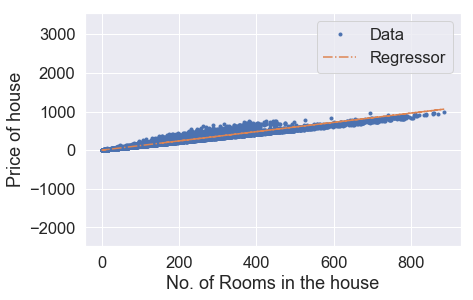

Iteration: 2401,Cost = 942.9253154895995,theta = [0.13271508 1.19835698]
Iteration: 2401,Cost_val = 947.1917893665226,theta = [0.13271508 1.19835698]


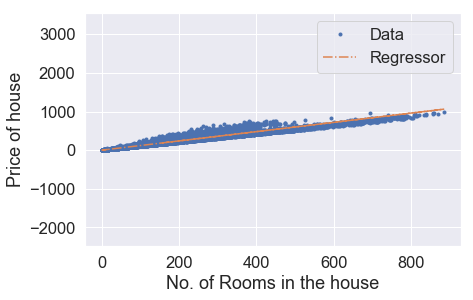

Iteration: 2411,Cost = 942.9226966333567,theta = [0.13322682 1.1983553 ]
Iteration: 2411,Cost_val = 947.1892158567524,theta = [0.13322682 1.1983553 ]


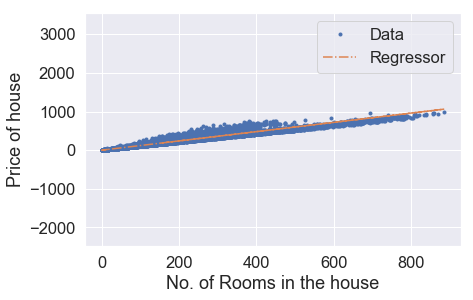

Iteration: 2421,Cost = 942.9200780357113,theta = [0.13373854 1.19835363]
Iteration: 2421,Cost_val = 947.1866426006495,theta = [0.13373854 1.19835363]


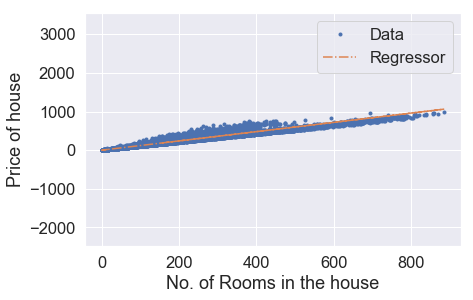

Iteration: 2431,Cost = 942.9174596966592,theta = [0.13425024 1.19835195]
Iteration: 2431,Cost_val = 947.1840695981991,theta = [0.13425024 1.19835195]


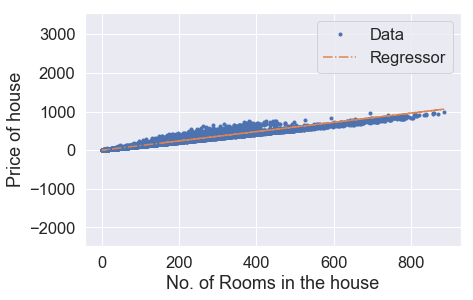

Iteration: 2441,Cost = 942.9148416161316,theta = [0.13476191 1.19835027]
Iteration: 2441,Cost_val = 947.1814968493727,theta = [0.13476191 1.19835027]


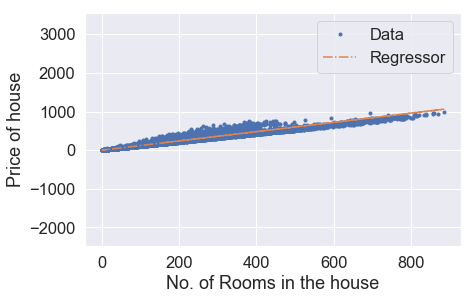

Iteration: 2451,Cost = 942.9122237941326,theta = [0.13527355 1.19834859]
Iteration: 2451,Cost_val = 947.1789243541466,theta = [0.13527355 1.19834859]


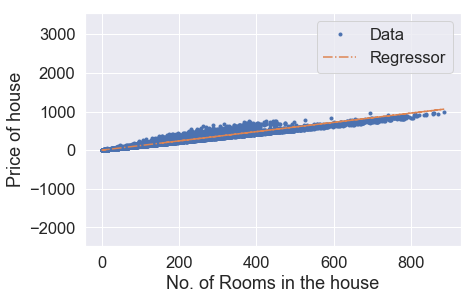

Iteration: 2461,Cost = 942.9096062306501,theta = [0.13578517 1.19834691]
Iteration: 2461,Cost_val = 947.1763521124959,theta = [0.13578517 1.19834691]


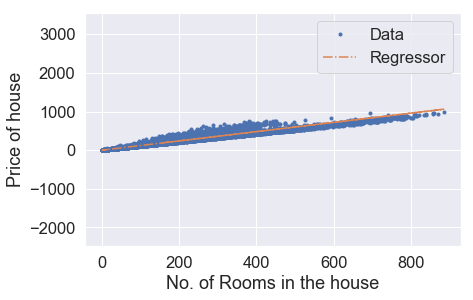

Iteration: 2471,Cost = 942.9069889256301,theta = [0.13629677 1.19834524]
Iteration: 2471,Cost_val = 947.1737801243929,theta = [0.13629677 1.19834524]


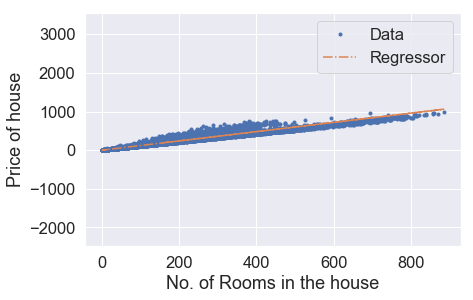

Iteration: 2481,Cost = 942.9043718790565,theta = [0.13680833 1.19834356]
Iteration: 2481,Cost_val = 947.1712083898113,theta = [0.13680833 1.19834356]


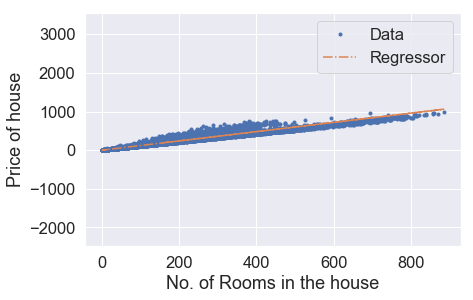

Iteration: 2491,Cost = 942.9017550909052,theta = [0.13731988 1.19834188]
Iteration: 2491,Cost_val = 947.1686369087336,theta = [0.13731988 1.19834188]


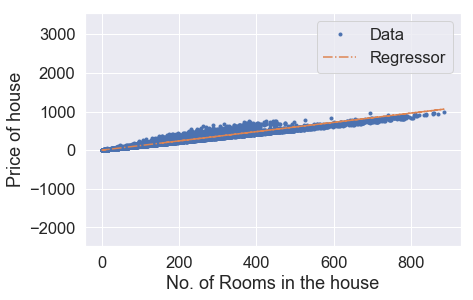

Iteration: 2501,Cost = 942.8991385611522,theta = [0.1378314  1.19834021]
Iteration: 2501,Cost_val = 947.1660656811256,theta = [0.1378314  1.19834021]


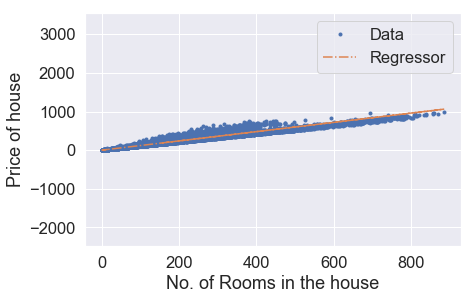

Iteration: 2511,Cost = 942.8965222897813,theta = [0.13834289 1.19833853]
Iteration: 2511,Cost_val = 947.1634947069631,theta = [0.13834289 1.19833853]


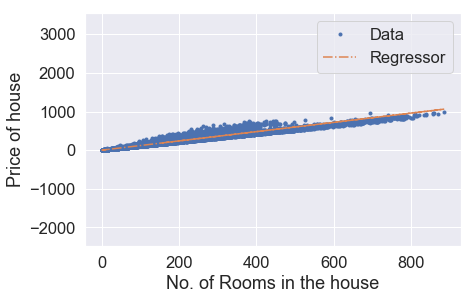

Iteration: 2521,Cost = 942.8939062767311,theta = [0.13885436 1.19833685]
Iteration: 2521,Cost_val = 947.1609239862339,theta = [0.13885436 1.19833685]


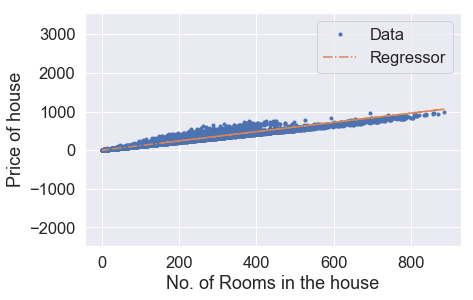

Iteration: 2531,Cost = 942.891290522012,theta = [0.1393658  1.19833517]
Iteration: 2531,Cost_val = 947.1583535188994,theta = [0.1393658  1.19833517]


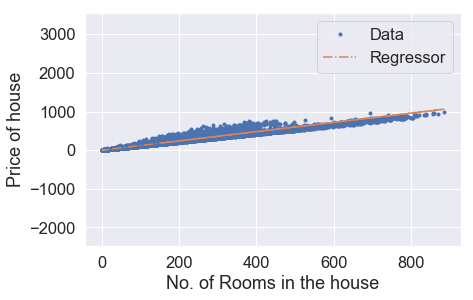

Iteration: 2541,Cost = 942.8886750255956,theta = [0.13987722 1.1983335 ]
Iteration: 2541,Cost_val = 947.1557833049396,theta = [0.13987722 1.1983335 ]


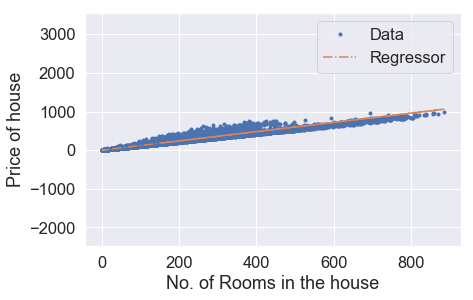

Iteration: 2551,Cost = 942.8860597874411,theta = [0.14038861 1.19833182]
Iteration: 2551,Cost_val = 947.1532133443278,theta = [0.14038861 1.19833182]


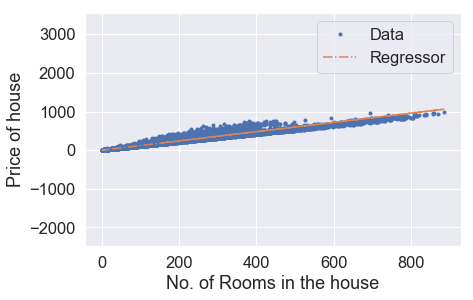

Iteration: 2561,Cost = 942.8834448075241,theta = [0.14089997 1.19833014]
Iteration: 2561,Cost_val = 947.1506436370377,theta = [0.14089997 1.19833014]


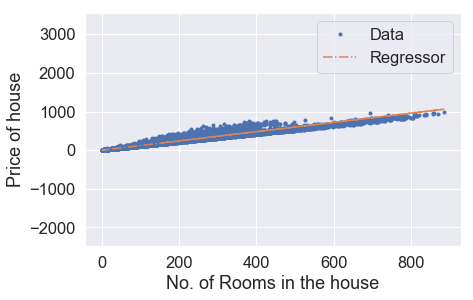

Iteration: 2571,Cost = 942.8808300858365,theta = [0.14141132 1.19832847]
Iteration: 2571,Cost_val = 947.1480741830517,theta = [0.14141132 1.19832847]


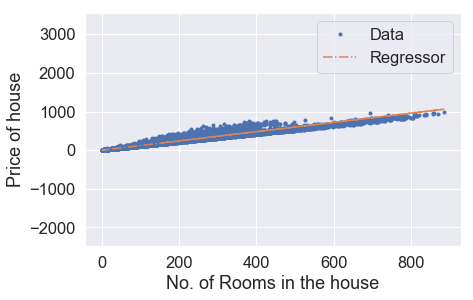

Iteration: 2581,Cost = 942.8782156223314,theta = [0.14192263 1.19832679]
Iteration: 2581,Cost_val = 947.1455049823372,theta = [0.14192263 1.19832679]


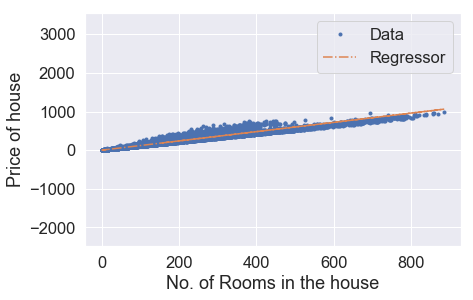

Iteration: 2591,Cost = 942.8756014170104,theta = [0.14243392 1.19832511]
Iteration: 2591,Cost_val = 947.1429360348731,theta = [0.14243392 1.19832511]


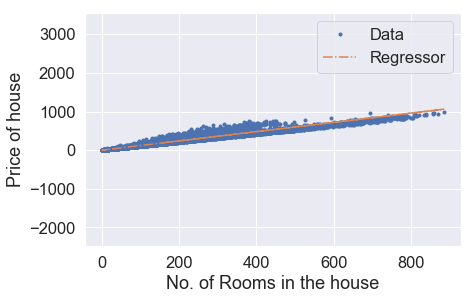

Iteration: 2601,Cost = 942.8729874698112,theta = [0.14294519 1.19832344]
Iteration: 2601,Cost_val = 947.1403673406336,theta = [0.14294519 1.19832344]


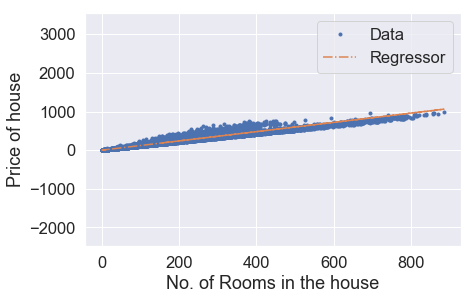

Iteration: 2611,Cost = 942.8703737807319,theta = [0.14345643 1.19832176]
Iteration: 2611,Cost_val = 947.137798899587,theta = [0.14345643 1.19832176]


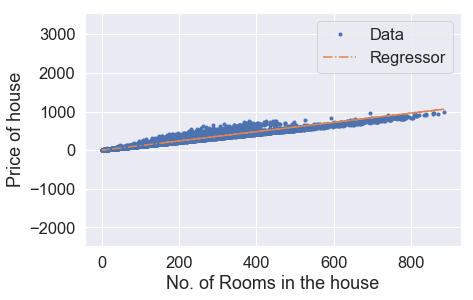

Iteration: 2621,Cost = 942.8677603497423,theta = [0.14396764 1.19832008]
Iteration: 2621,Cost_val = 947.1352307117214,theta = [0.14396764 1.19832008]


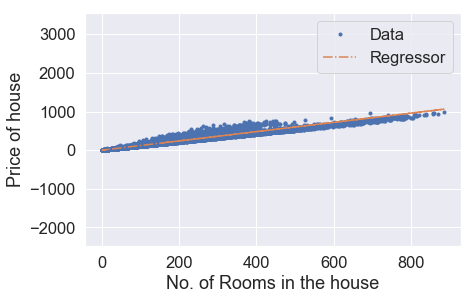

Iteration: 2631,Cost = 942.8651471768278,theta = [0.14447883 1.19831841]
Iteration: 2631,Cost_val = 947.1326627770023,theta = [0.14447883 1.19831841]


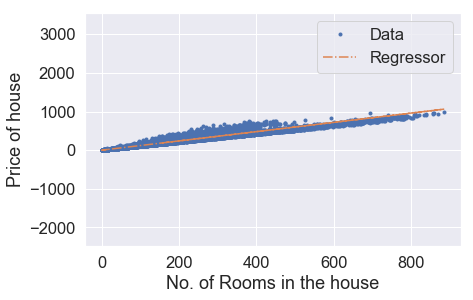

Iteration: 2641,Cost = 942.8625342619531,theta = [0.14499    1.19831673]
Iteration: 2641,Cost_val = 947.130095095409,theta = [0.14499    1.19831673]


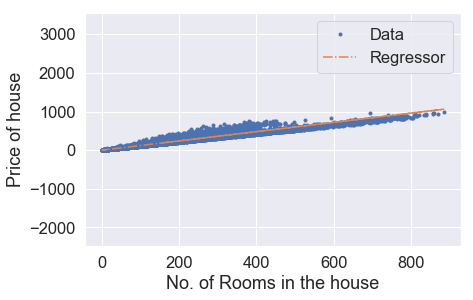

Iteration: 2651,Cost = 942.8599216050807,theta = [0.14550114 1.19831506]
Iteration: 2651,Cost_val = 947.1275276669118,theta = [0.14550114 1.19831506]


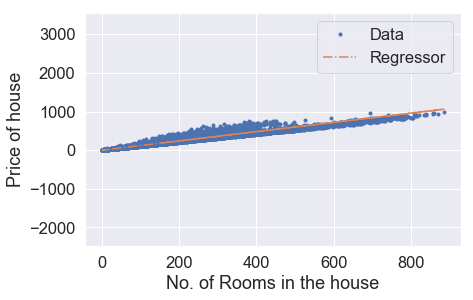

Iteration: 2661,Cost = 942.8573092062027,theta = [0.14601225 1.19831338]
Iteration: 2661,Cost_val = 947.1249604914947,theta = [0.14601225 1.19831338]


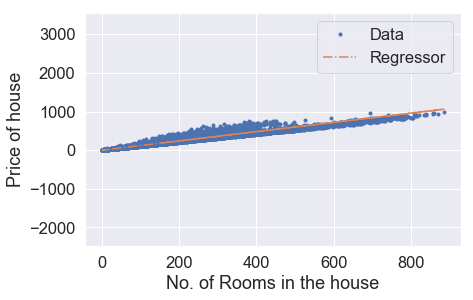

Iteration: 2671,Cost = 942.8546970652887,theta = [0.14652334 1.1983117 ]
Iteration: 2671,Cost_val = 947.1223935691175,theta = [0.14652334 1.1983117 ]


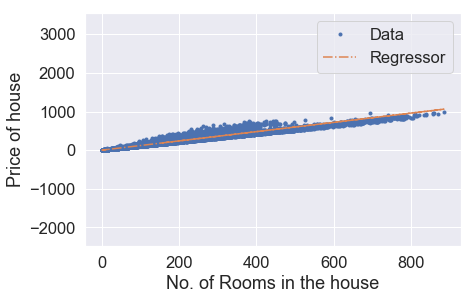

Iteration: 2681,Cost = 942.8520851823101,theta = [0.14703441 1.19831003]
Iteration: 2681,Cost_val = 947.1198268997703,theta = [0.14703441 1.19831003]


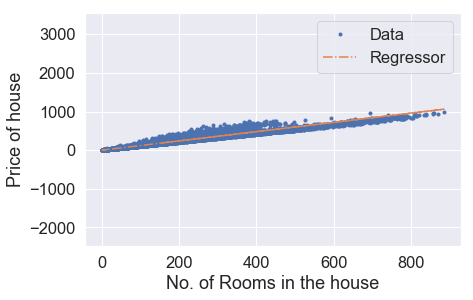

Iteration: 2691,Cost = 942.8494735572407,theta = [0.14754544 1.19830835]
Iteration: 2691,Cost_val = 947.1172604834243,theta = [0.14754544 1.19830835]


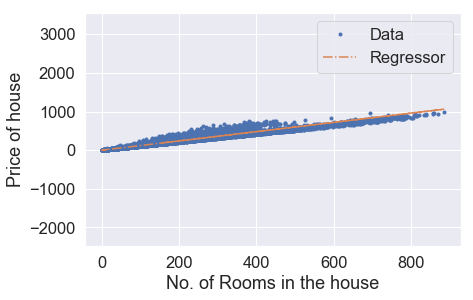

Iteration: 2701,Cost = 942.8468621900562,theta = [0.14805646 1.19830668]
Iteration: 2701,Cost_val = 947.1146943200478,theta = [0.14805646 1.19830668]


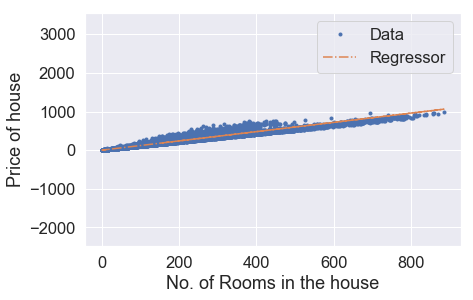

Iteration: 2711,Cost = 942.8442510807421,theta = [0.14856745 1.198305  ]
Iteration: 2711,Cost_val = 947.1121284096258,theta = [0.14856745 1.198305  ]


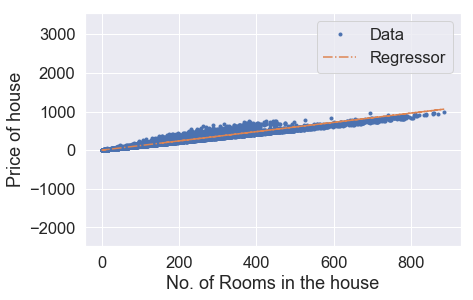

Iteration: 2721,Cost = 942.8416402292565,theta = [0.14907841 1.19830333]
Iteration: 2721,Cost_val = 947.1095627521278,theta = [0.14907841 1.19830333]


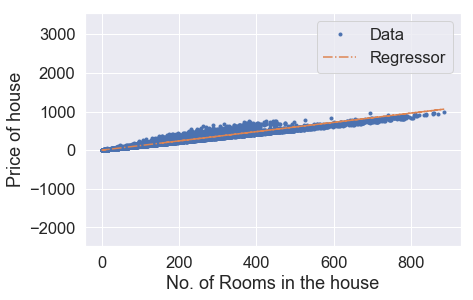

Iteration: 2731,Cost = 942.8390296355877,theta = [0.14958935 1.19830165]
Iteration: 2731,Cost_val = 947.106997347526,theta = [0.14958935 1.19830165]


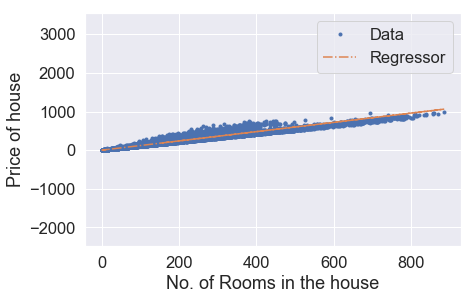

Iteration: 2741,Cost = 942.8364192996938,theta = [0.15010026 1.19829998]
Iteration: 2741,Cost_val = 947.1044321957983,theta = [0.15010026 1.19829998]


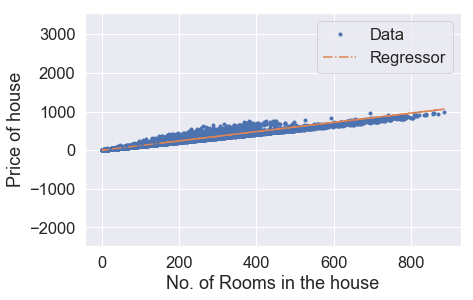

Iteration: 2751,Cost = 942.8338092215774,theta = [0.15061115 1.1982983 ]
Iteration: 2751,Cost_val = 947.1018672969228,theta = [0.15061115 1.1982983 ]


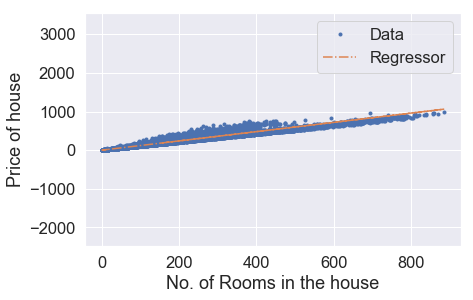

Iteration: 2761,Cost = 942.8311994011792,theta = [0.15112201 1.19829662]
Iteration: 2761,Cost_val = 947.0993026508722,theta = [0.15112201 1.19829662]


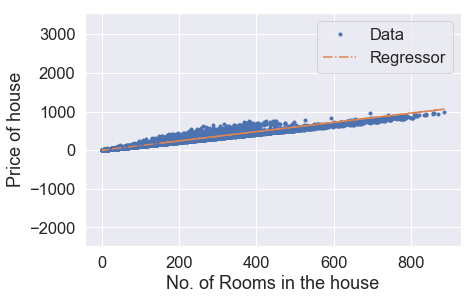

Iteration: 2771,Cost = 942.8285898384947,theta = [0.15163284 1.19829495]
Iteration: 2771,Cost_val = 947.0967382576174,theta = [0.15163284 1.19829495]


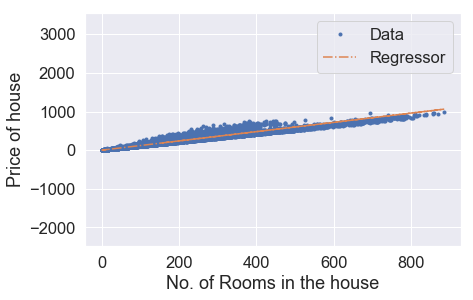

Iteration: 2781,Cost = 942.825980533494,theta = [0.15214366 1.19829327]
Iteration: 2781,Cost_val = 947.0941741171389,theta = [0.15214366 1.19829327]


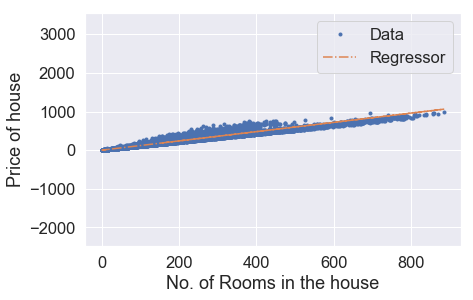

Iteration: 2791,Cost = 942.8233714861524,theta = [0.15265444 1.1982916 ]
Iteration: 2791,Cost_val = 947.0916102294145,theta = [0.15265444 1.1982916 ]


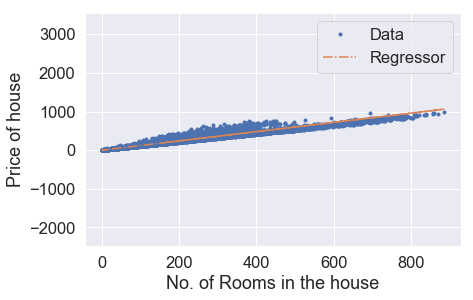

Iteration: 2801,Cost = 942.8207626964339,theta = [0.1531652  1.19828993]
Iteration: 2801,Cost_val = 947.0890465944112,theta = [0.1531652  1.19828993]


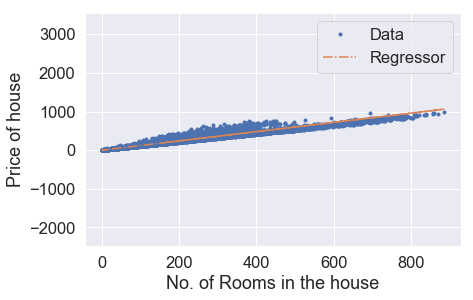

Iteration: 2811,Cost = 942.8181541643247,theta = [0.15367594 1.19828825]
Iteration: 2811,Cost_val = 947.0864832121114,theta = [0.15367594 1.19828825]


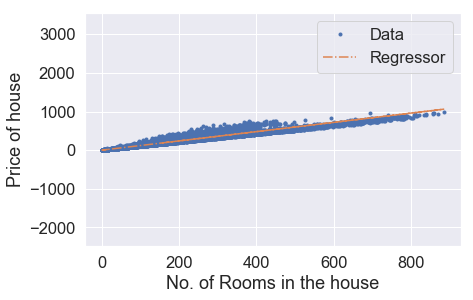

Iteration: 2821,Cost = 942.8155458897985,theta = [0.15418665 1.19828658]
Iteration: 2821,Cost_val = 947.0839200824829,theta = [0.15418665 1.19828658]


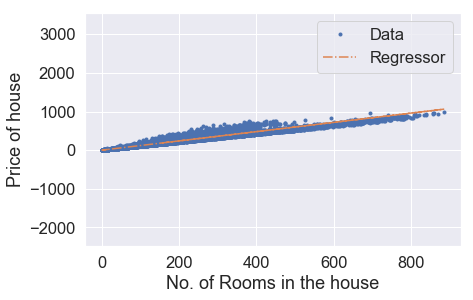

Iteration: 2831,Cost = 942.8129378728266,theta = [0.15469733 1.1982849 ]
Iteration: 2831,Cost_val = 947.0813572055043,theta = [0.15469733 1.1982849 ]


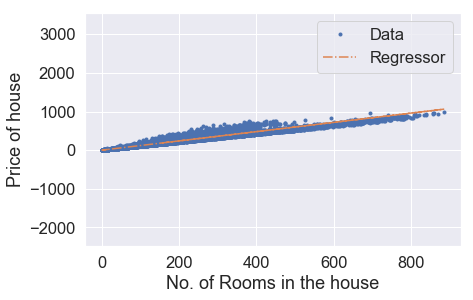

Iteration: 2841,Cost = 942.810330113393,theta = [0.15520799 1.19828323]
Iteration: 2841,Cost_val = 947.0787945811537,theta = [0.15520799 1.19828323]


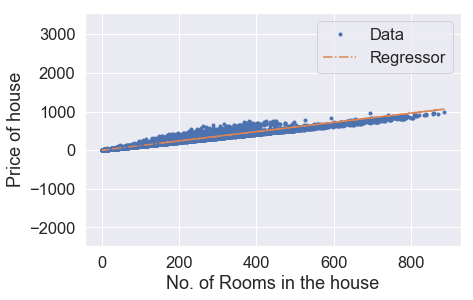

Iteration: 2851,Cost = 942.8077226114531,theta = [0.15571863 1.19828155]
Iteration: 2851,Cost_val = 947.0762322094005,theta = [0.15571863 1.19828155]


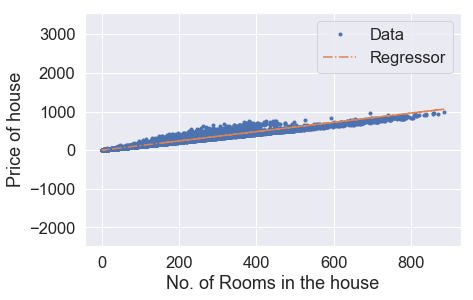

Iteration: 2861,Cost = 942.805115367003,theta = [0.15622924 1.19827988]
Iteration: 2861,Cost_val = 947.073670090223,theta = [0.15622924 1.19827988]


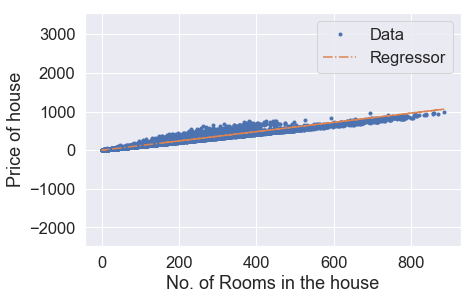

Iteration: 2871,Cost = 942.8025083800057,theta = [0.15673982 1.1982782 ]
Iteration: 2871,Cost_val = 947.0711082235958,theta = [0.15673982 1.1982782 ]


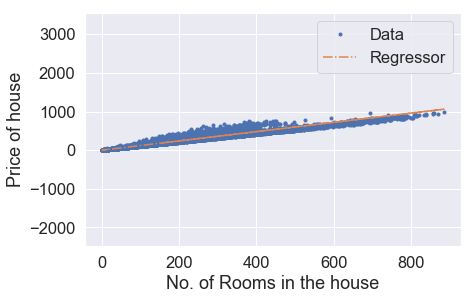

Iteration: 2881,Cost = 942.7999016504267,theta = [0.15725038 1.19827653]
Iteration: 2881,Cost_val = 947.0685466094951,theta = [0.15725038 1.19827653]


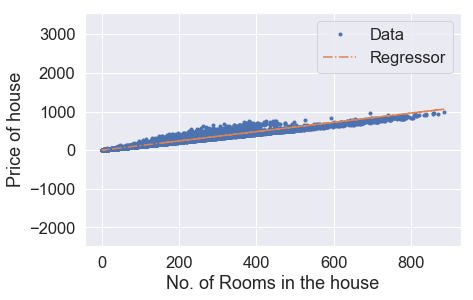

Iteration: 2891,Cost = 942.7972951782573,theta = [0.15776092 1.19827486]
Iteration: 2891,Cost_val = 947.0659852478964,theta = [0.15776092 1.19827486]


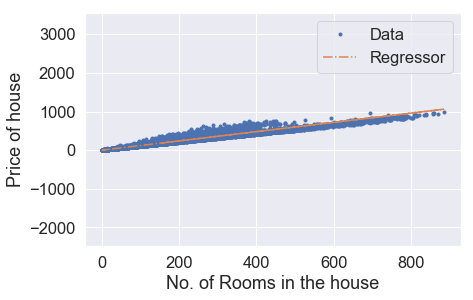

Iteration: 2901,Cost = 942.794688963471,theta = [0.15827143 1.19827318]
Iteration: 2901,Cost_val = 947.0634241387723,theta = [0.15827143 1.19827318]


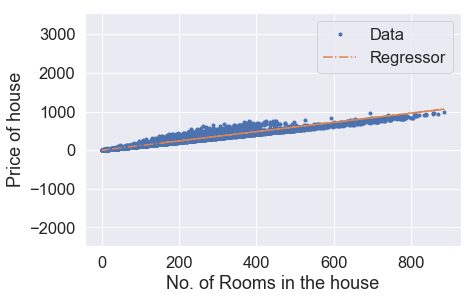

Iteration: 2911,Cost = 942.7920830060286,theta = [0.15878191 1.19827151]
Iteration: 2911,Cost_val = 947.0608632820971,theta = [0.15878191 1.19827151]


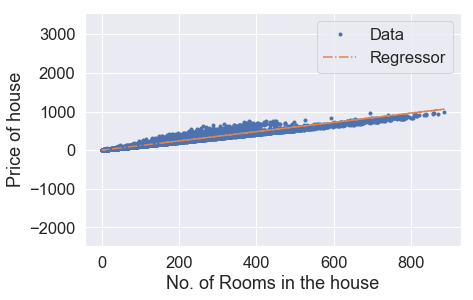

Iteration: 2921,Cost = 942.7894773059265,theta = [0.15929237 1.19826983]
Iteration: 2921,Cost_val = 947.0583026778527,theta = [0.15929237 1.19826983]


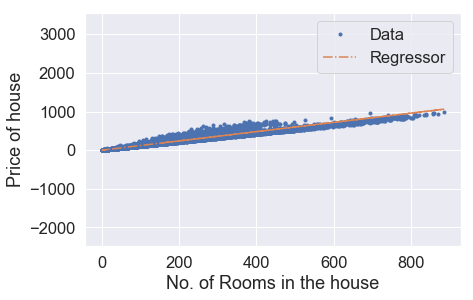

Iteration: 2931,Cost = 942.7868718631121,theta = [0.1598028  1.19826816]
Iteration: 2931,Cost_val = 947.0557423260027,theta = [0.1598028  1.19826816]


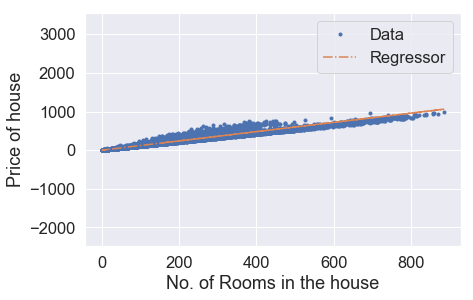

Iteration: 2941,Cost = 942.7842666775769,theta = [0.16031321 1.19826649]
Iteration: 2941,Cost_val = 947.05318222653,theta = [0.16031321 1.19826649]


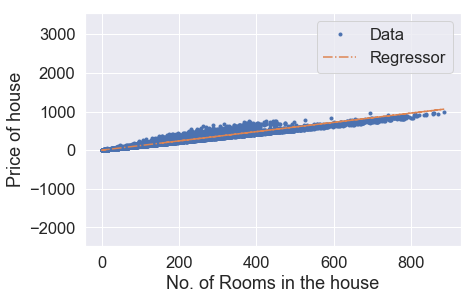

Iteration: 2951,Cost = 942.7816617492939,theta = [0.16082359 1.19826481]
Iteration: 2951,Cost_val = 947.0506223794138,theta = [0.16082359 1.19826481]


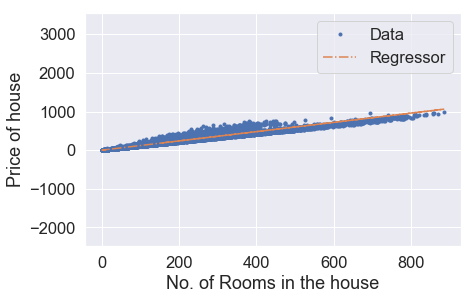

Iteration: 2961,Cost = 942.7790570782355,theta = [0.16133395 1.19826314]
Iteration: 2961,Cost_val = 947.0480627846185,theta = [0.16133395 1.19826314]


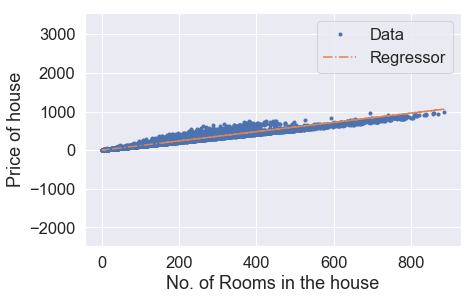

Iteration: 2971,Cost = 942.7764526643818,theta = [0.16184428 1.19826147]
Iteration: 2971,Cost_val = 947.0455034421268,theta = [0.16184428 1.19826147]


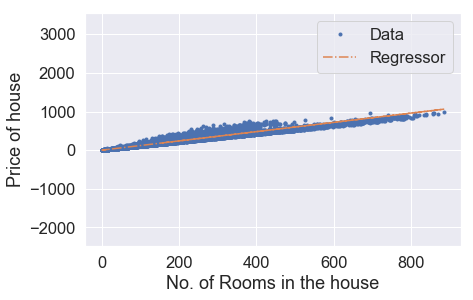

Iteration: 2981,Cost = 942.7738485076974,theta = [0.16235459 1.19825979]
Iteration: 2981,Cost_val = 947.0429443519113,theta = [0.16235459 1.19825979]


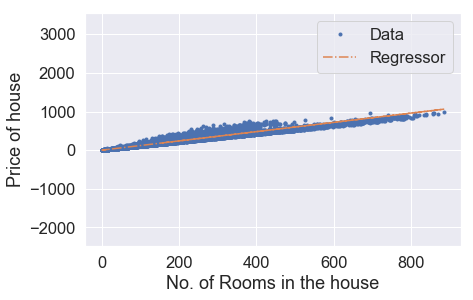

Iteration: 2991,Cost = 942.7712446081705,theta = [0.16286487 1.19825812]
Iteration: 2991,Cost_val = 947.040385513946,theta = [0.16286487 1.19825812]


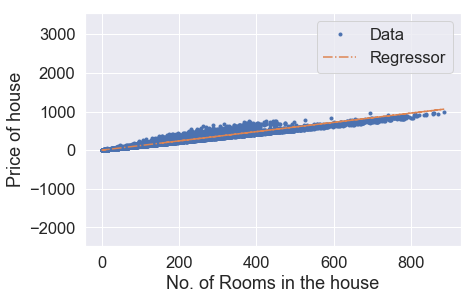

Iteration: 3001,Cost = 942.7686409657572,theta = [0.16337513 1.19825645]
Iteration: 3001,Cost_val = 947.037826928211,theta = [0.16337513 1.19825645]


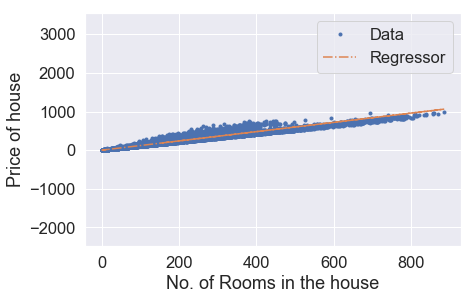

Iteration: 3011,Cost = 942.7660375804422,theta = [0.16388536 1.19825477]
Iteration: 3011,Cost_val = 947.035268594673,theta = [0.16388536 1.19825477]


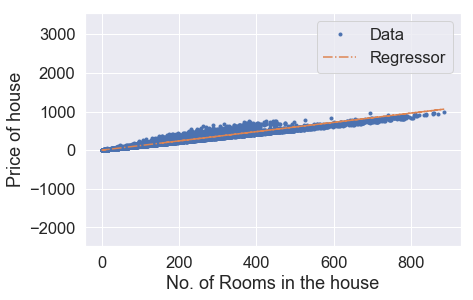

Iteration: 3021,Cost = 942.7634344522054,theta = [0.16439557 1.1982531 ]
Iteration: 3021,Cost_val = 947.0327105133156,theta = [0.16439557 1.1982531 ]


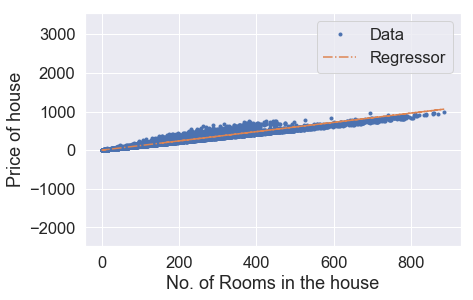

Iteration: 3031,Cost = 942.7608315810114,theta = [0.16490575 1.19825143]
Iteration: 3031,Cost_val = 947.0301526841084,theta = [0.16490575 1.19825143]


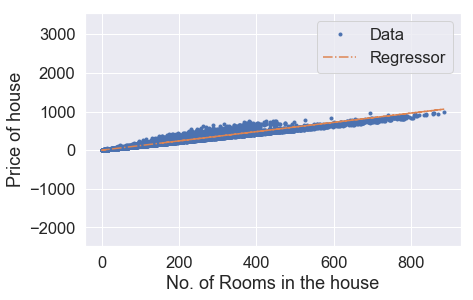

Iteration: 3041,Cost = 942.7582289668492,theta = [0.1654159  1.19824975]
Iteration: 3041,Cost_val = 947.0275951070299,theta = [0.1654159  1.19824975]


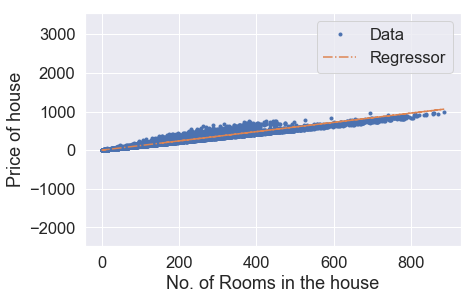

Iteration: 3051,Cost = 942.7556266096689,theta = [0.16592603 1.19824808]
Iteration: 3051,Cost_val = 947.0250377820544,theta = [0.16592603 1.19824808]


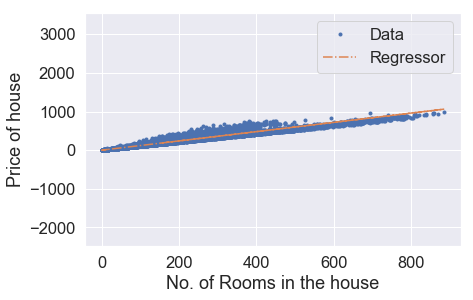

Iteration: 3061,Cost = 942.753024509467,theta = [0.16643614 1.19824641]
Iteration: 3061,Cost_val = 947.0224807091519,theta = [0.16643614 1.19824641]


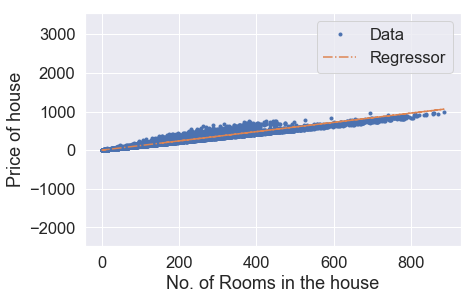

Iteration: 3071,Cost = 942.7504226662126,theta = [0.16694622 1.19824474]
Iteration: 3071,Cost_val = 947.0199238883041,theta = [0.16694622 1.19824474]


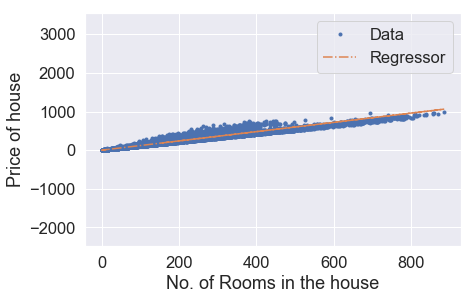

Iteration: 3081,Cost = 942.747821079879,theta = [0.16745628 1.19824306]
Iteration: 3081,Cost_val = 947.0173673194851,theta = [0.16745628 1.19824306]


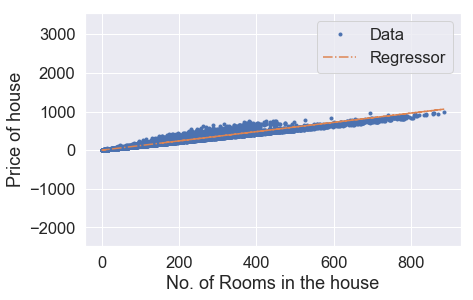

Iteration: 3091,Cost = 942.7452197504414,theta = [0.16796631 1.19824139]
Iteration: 3091,Cost_val = 947.0148110026674,theta = [0.16796631 1.19824139]


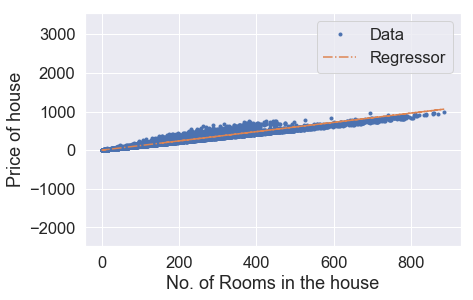

Iteration: 3101,Cost = 942.742618677869,theta = [0.16847631 1.19823972]
Iteration: 3101,Cost_val = 947.0122549378314,theta = [0.16847631 1.19823972]


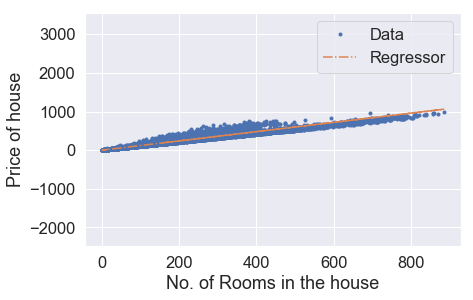

Iteration: 3111,Cost = 942.7400178621617,theta = [0.16898629 1.19823805]
Iteration: 3111,Cost_val = 947.0096991249467,theta = [0.16898629 1.19823805]


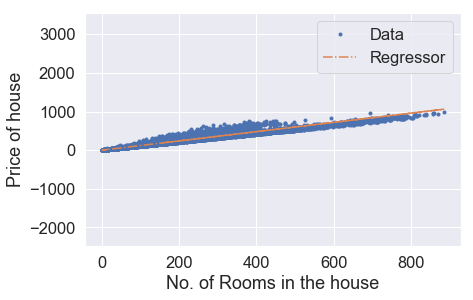

Iteration: 3121,Cost = 942.7374173032431,theta = [0.16949625 1.19823637]
Iteration: 3121,Cost_val = 947.0071435639885,theta = [0.16949625 1.19823637]


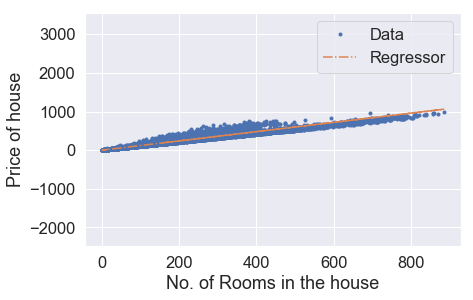

Iteration: 3131,Cost = 942.7348170011347,theta = [0.17000618 1.1982347 ]
Iteration: 3131,Cost_val = 947.0045882549339,theta = [0.17000618 1.1982347 ]


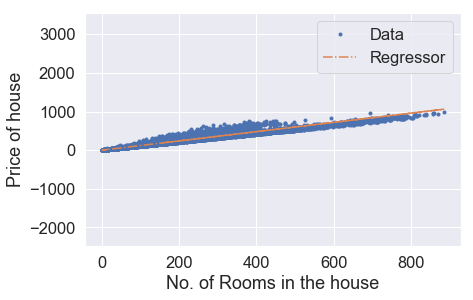

Iteration: 3141,Cost = 942.7322169557948,theta = [0.17051608 1.19823303]
Iteration: 3141,Cost_val = 947.002033197758,theta = [0.17051608 1.19823303]


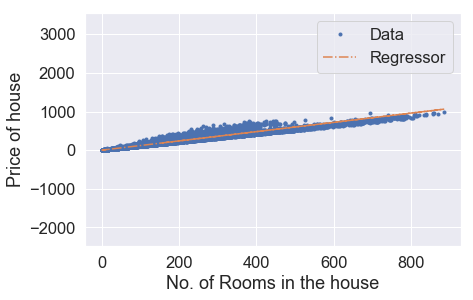

Iteration: 3151,Cost = 942.7296171671974,theta = [0.17102596 1.19823136]
Iteration: 3151,Cost_val = 946.9994783924386,theta = [0.17102596 1.19823136]


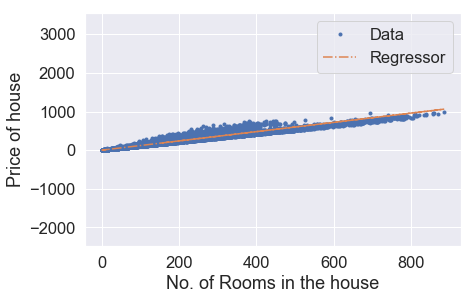

Iteration: 3161,Cost = 942.7270176353104,theta = [0.17153581 1.19822969]
Iteration: 3161,Cost_val = 946.996923838946,theta = [0.17153581 1.19822969]


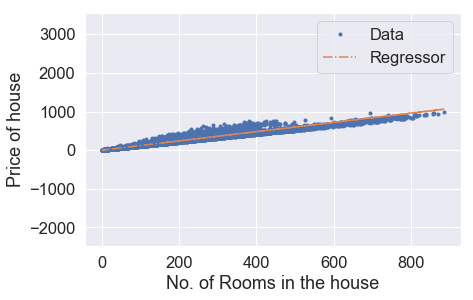

Iteration: 3171,Cost = 942.7244183601275,theta = [0.17204564 1.19822802]
Iteration: 3171,Cost_val = 946.9943695372563,theta = [0.17204564 1.19822802]


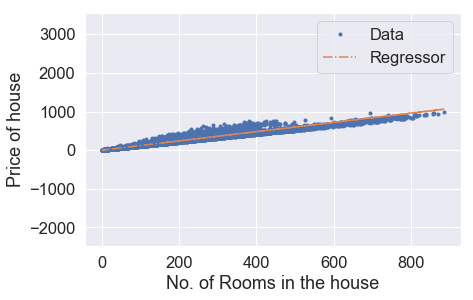

Iteration: 3181,Cost = 942.7218193415983,theta = [0.17255545 1.19822634]
Iteration: 3181,Cost_val = 946.991815487349,theta = [0.17255545 1.19822634]


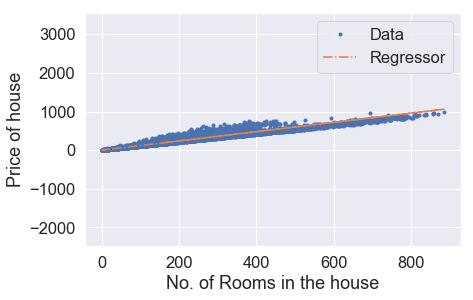

Iteration: 3191,Cost = 942.7192205797276,theta = [0.17306522 1.19822467]
Iteration: 3191,Cost_val = 946.989261689189,theta = [0.17306522 1.19822467]


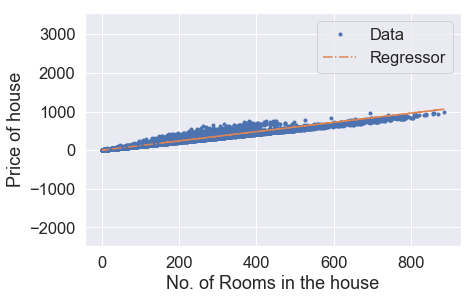

Iteration: 3201,Cost = 942.7166220744514,theta = [0.17357498 1.198223  ]
Iteration: 3201,Cost_val = 946.9867081427662,theta = [0.17357498 1.198223  ]


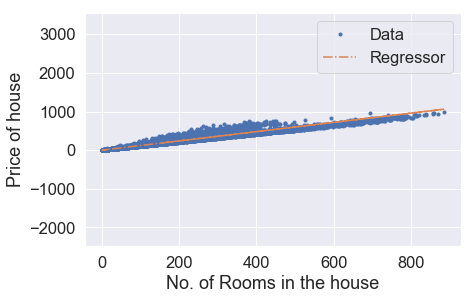

Iteration: 3211,Cost = 942.7140238257779,theta = [0.17408471 1.19822133]
Iteration: 3211,Cost_val = 946.9841548480468,theta = [0.17408471 1.19822133]


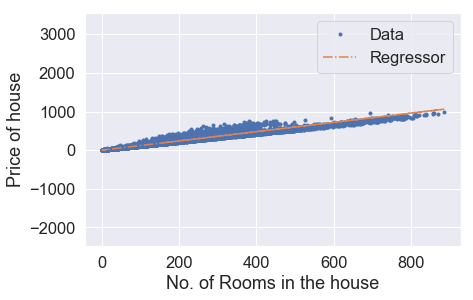

Iteration: 3221,Cost = 942.7114258336891,theta = [0.17459441 1.19821966]
Iteration: 3221,Cost_val = 946.9816018050034,theta = [0.17459441 1.19821966]


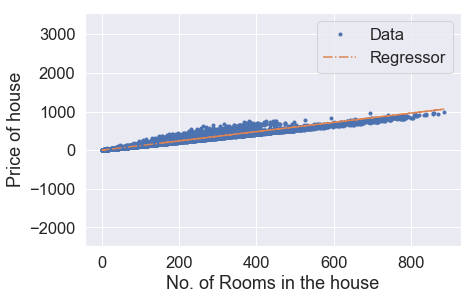

Iteration: 3231,Cost = 942.7088280981172,theta = [0.17510409 1.19821799]
Iteration: 3231,Cost_val = 946.9790490136203,theta = [0.17510409 1.19821799]


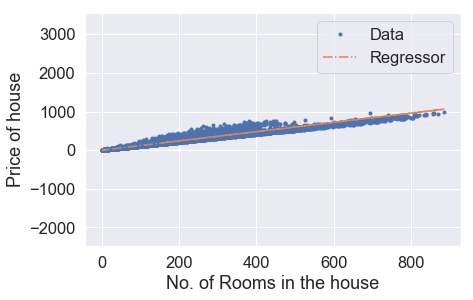

Iteration: 3241,Cost = 942.7062306190566,theta = [0.17561374 1.19821632]
Iteration: 3241,Cost_val = 946.9764964738614,theta = [0.17561374 1.19821632]


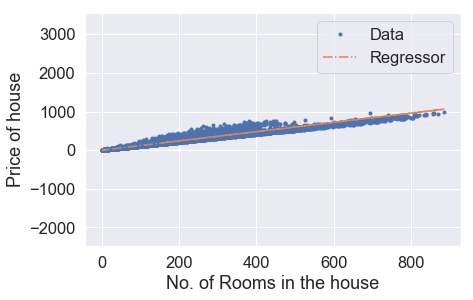

Iteration: 3251,Cost = 942.7036333964991,theta = [0.17612337 1.19821464]
Iteration: 3251,Cost_val = 946.9739441857084,theta = [0.17612337 1.19821464]


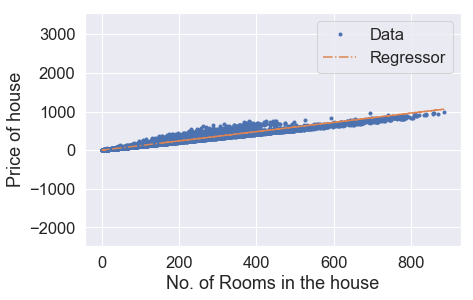

Iteration: 3261,Cost = 942.7010364304082,theta = [0.17663297 1.19821297]
Iteration: 3261,Cost_val = 946.9713921491435,theta = [0.17663297 1.19821297]


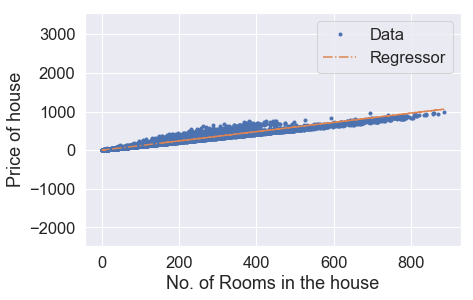

Iteration: 3271,Cost = 942.6984397207534,theta = [0.17714255 1.1982113 ]
Iteration: 3271,Cost_val = 946.9688403641236,theta = [0.17714255 1.1982113 ]


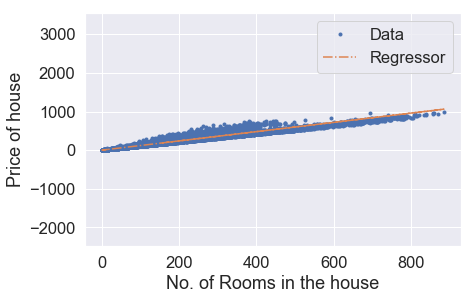

Iteration: 3281,Cost = 942.6958432675033,theta = [0.1776521  1.19820963]
Iteration: 3281,Cost_val = 946.9662888306408,theta = [0.1776521  1.19820963]


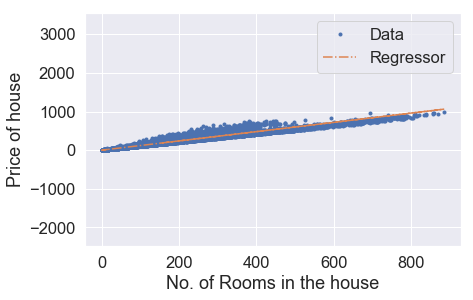

Iteration: 3291,Cost = 942.6932470706574,theta = [0.17816162 1.19820796]
Iteration: 3291,Cost_val = 946.9637375486645,theta = [0.17816162 1.19820796]


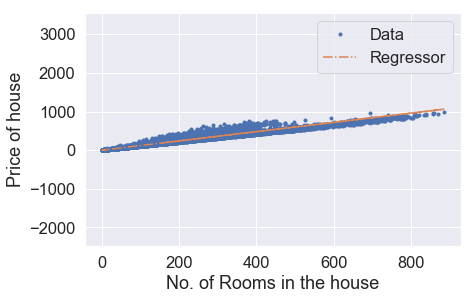

Iteration: 3301,Cost = 942.6906511301663,theta = [0.17867113 1.19820629]
Iteration: 3301,Cost_val = 946.9611865181654,theta = [0.17867113 1.19820629]


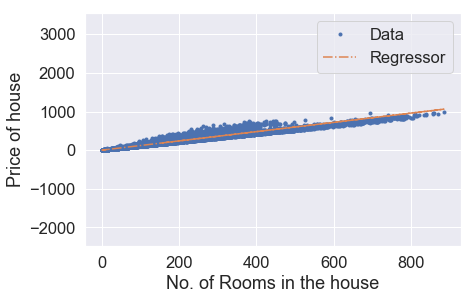

Iteration: 3311,Cost = 942.6880554460089,theta = [0.1791806  1.19820462]
Iteration: 3311,Cost_val = 946.958635739131,theta = [0.1791806  1.19820462]


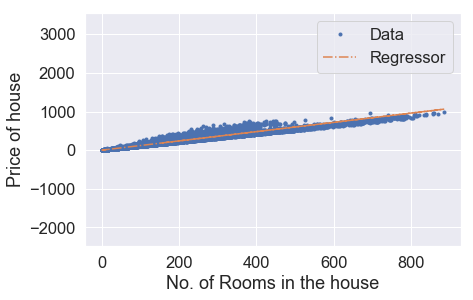

Iteration: 3321,Cost = 942.6854600181671,theta = [0.17969005 1.19820295]
Iteration: 3321,Cost_val = 946.9560852115192,theta = [0.17969005 1.19820295]


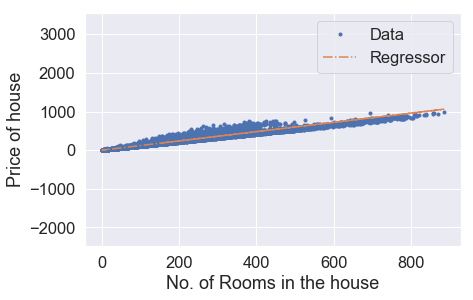

Iteration: 3331,Cost = 942.6828648466146,theta = [0.18019948 1.19820128]
Iteration: 3331,Cost_val = 946.9535349353185,theta = [0.18019948 1.19820128]


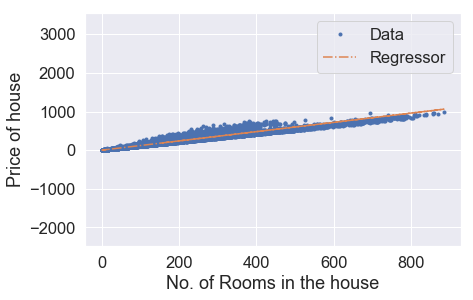

Iteration: 3341,Cost = 942.6802699313141,theta = [0.18070888 1.19819961]
Iteration: 3341,Cost_val = 946.950984910496,theta = [0.18070888 1.19819961]


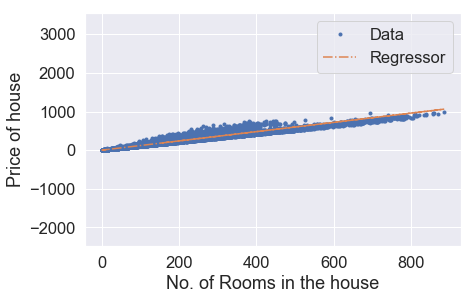

Iteration: 3351,Cost = 942.6776752722612,theta = [0.18121826 1.19819794]
Iteration: 3351,Cost_val = 946.9484351370335,theta = [0.18121826 1.19819794]


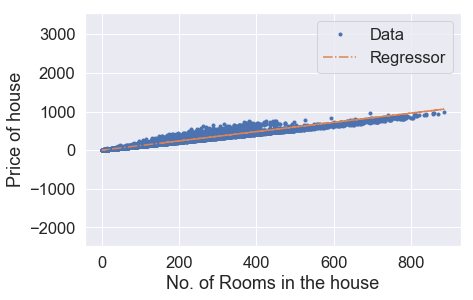

Iteration: 3361,Cost = 942.6750808694144,theta = [0.18172761 1.19819627]
Iteration: 3361,Cost_val = 946.9458856149056,theta = [0.18172761 1.19819627]


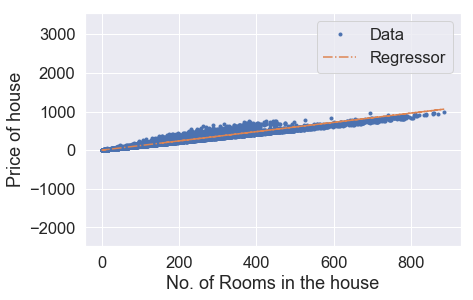

Iteration: 3371,Cost = 942.6724867227622,theta = [0.18223693 1.1981946 ]
Iteration: 3371,Cost_val = 946.9433363440819,theta = [0.18223693 1.1981946 ]


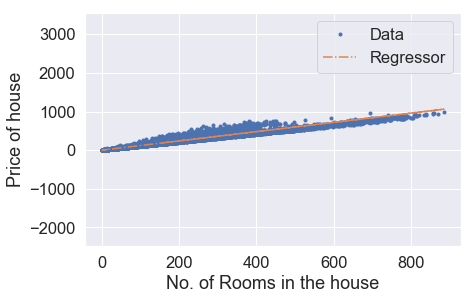

Iteration: 3381,Cost = 942.6698928322597,theta = [0.18274623 1.19819293]
Iteration: 3381,Cost_val = 946.9407873245441,theta = [0.18274623 1.19819293]


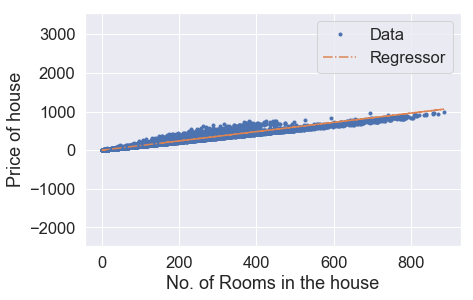

Iteration: 3391,Cost = 942.6672991978983,theta = [0.18325551 1.19819126]
Iteration: 3391,Cost_val = 946.9382385562614,theta = [0.18325551 1.19819126]


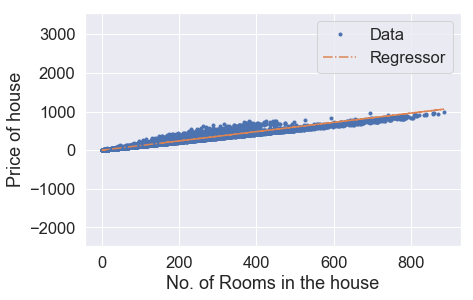

Iteration: 3401,Cost = 942.6647058196507,theta = [0.18376476 1.19818959]
Iteration: 3401,Cost_val = 946.9356900392096,theta = [0.18376476 1.19818959]


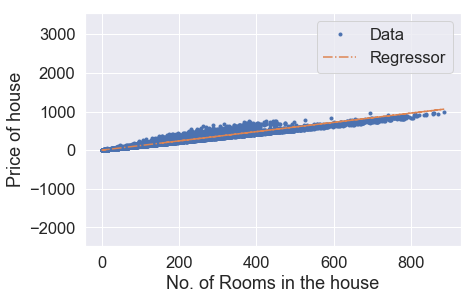

Iteration: 3411,Cost = 942.6621126974728,theta = [0.18427398 1.19818792]
Iteration: 3411,Cost_val = 946.9331417733764,theta = [0.18427398 1.19818792]


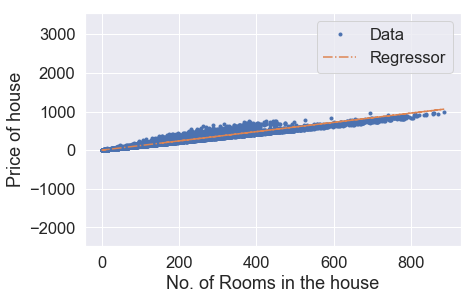

Iteration: 3421,Cost = 942.6595198313759,theta = [0.18478318 1.19818625]
Iteration: 3421,Cost_val = 946.930593758717,theta = [0.18478318 1.19818625]


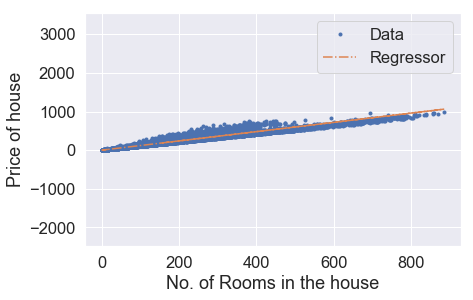

Iteration: 3431,Cost = 942.6569272212918,theta = [0.18529236 1.19818458]
Iteration: 3431,Cost_val = 946.9280459952204,theta = [0.18529236 1.19818458]


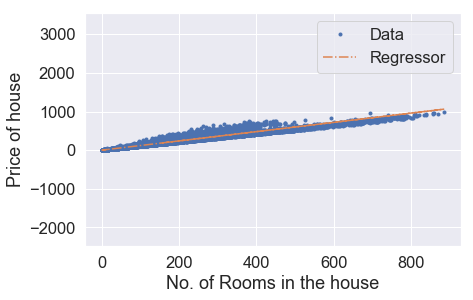

Iteration: 3441,Cost = 942.6543348672329,theta = [0.18580151 1.19818291]
Iteration: 3441,Cost_val = 946.9254984828563,theta = [0.18580151 1.19818291]


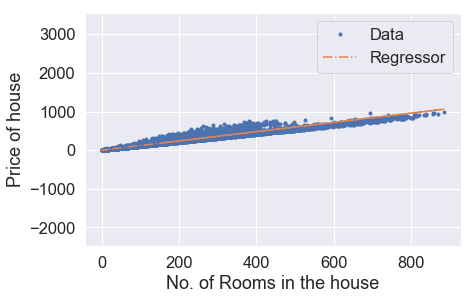

Iteration: 3451,Cost = 942.651742769151,theta = [0.18631063 1.19818124]
Iteration: 3451,Cost_val = 946.9229512216035,theta = [0.18631063 1.19818124]


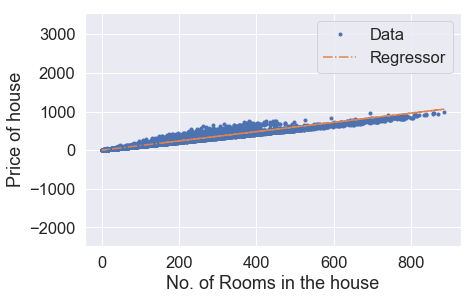

Iteration: 3461,Cost = 942.64915092703,theta = [0.18681973 1.19817957]
Iteration: 3461,Cost_val = 946.9204042114314,theta = [0.18681973 1.19817957]


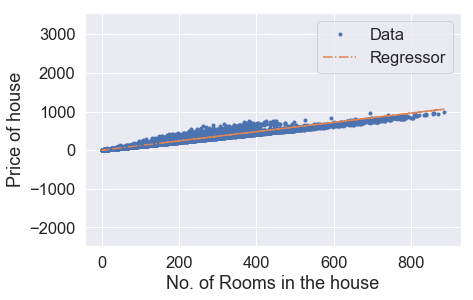

Iteration: 3471,Cost = 942.646559340835,theta = [0.18732881 1.1981779 ]
Iteration: 3471,Cost_val = 946.917857452322,theta = [0.18732881 1.1981779 ]


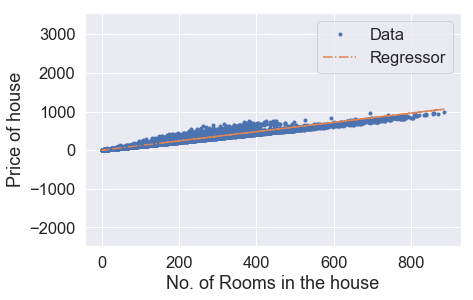

Iteration: 3481,Cost = 942.6439680105545,theta = [0.18783785 1.19817623]
Iteration: 3481,Cost_val = 946.9153109442514,theta = [0.18783785 1.19817623]


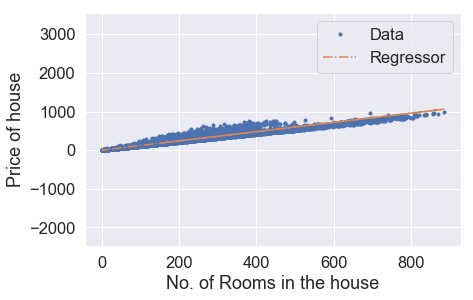

Iteration: 3491,Cost = 942.6413769361641,theta = [0.18834688 1.19817456]
Iteration: 3491,Cost_val = 946.9127646871843,theta = [0.18834688 1.19817456]


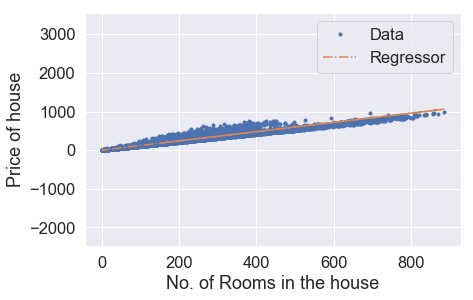

Iteration: 3501,Cost = 942.638786117617,theta = [0.18885588 1.19817289]
Iteration: 3501,Cost_val = 946.9102186811064,theta = [0.18885588 1.19817289]


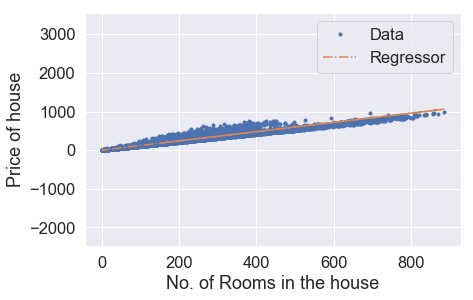

Iteration: 3511,Cost = 942.636195554907,theta = [0.18936485 1.19817123]
Iteration: 3511,Cost_val = 946.9076729259892,theta = [0.18936485 1.19817123]


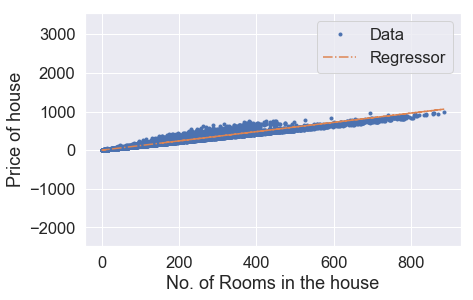

Iteration: 3521,Cost = 942.633605248006,theta = [0.1898738  1.19816956]
Iteration: 3521,Cost_val = 946.9051274218049,theta = [0.1898738  1.19816956]


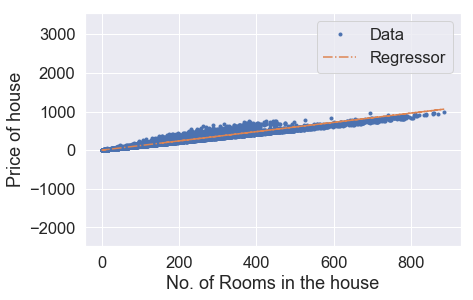

Iteration: 3531,Cost = 942.6310151968837,theta = [0.19038272 1.19816789]
Iteration: 3531,Cost_val = 946.9025821685339,theta = [0.19038272 1.19816789]


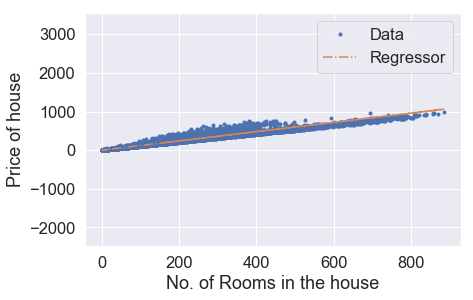

Iteration: 3541,Cost = 942.6284254015222,theta = [0.19089162 1.19816622]
Iteration: 3541,Cost_val = 946.9000371661516,theta = [0.19089162 1.19816622]


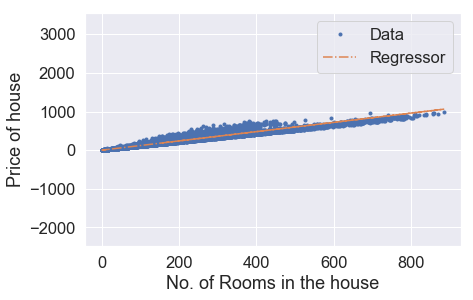

Iteration: 3551,Cost = 942.6258358618762,theta = [0.19140049 1.19816455]
Iteration: 3551,Cost_val = 946.8974924146286,theta = [0.19140049 1.19816455]


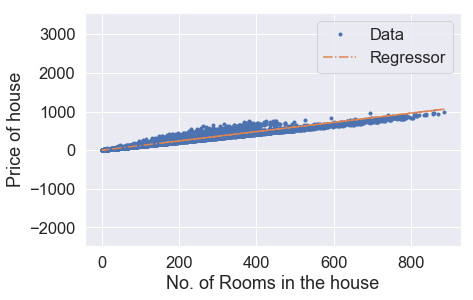

Iteration: 3561,Cost = 942.6232465779525,theta = [0.19190934 1.19816288]
Iteration: 3561,Cost_val = 946.8949479139427,theta = [0.19190934 1.19816288]


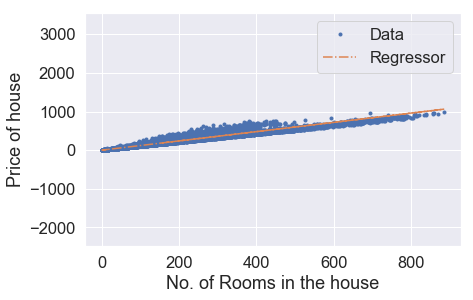

Iteration: 3571,Cost = 942.620657549713,theta = [0.19241816 1.19816121]
Iteration: 3571,Cost_val = 946.892403664071,theta = [0.19241816 1.19816121]


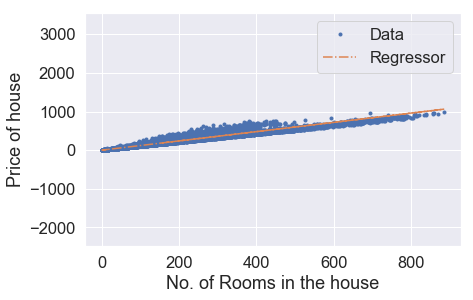

Iteration: 3581,Cost = 942.6180687771231,theta = [0.19292696 1.19815954]
Iteration: 3581,Cost_val = 946.8898596649824,theta = [0.19292696 1.19815954]


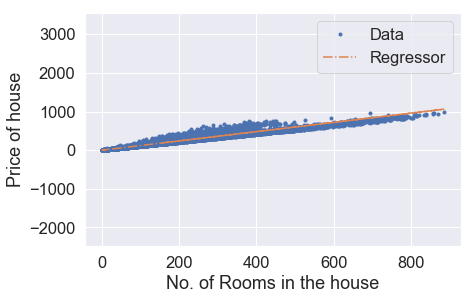

Iteration: 3591,Cost = 942.6154802601558,theta = [0.19343573 1.19815788]
Iteration: 3591,Cost_val = 946.8873159166584,theta = [0.19343573 1.19815788]


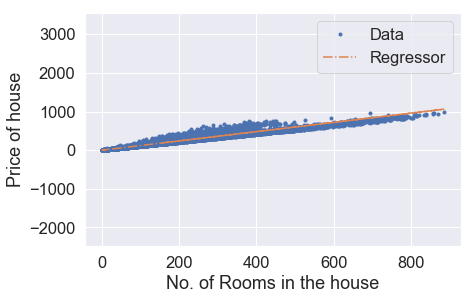

Iteration: 3601,Cost = 942.6128919987966,theta = [0.19394448 1.19815621]
Iteration: 3601,Cost_val = 946.8847724190725,theta = [0.19394448 1.19815621]


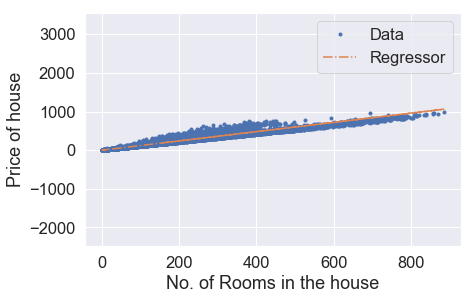

Iteration: 3611,Cost = 942.610303993025,theta = [0.1944532  1.19815454]
Iteration: 3611,Cost_val = 946.8822291722043,theta = [0.1944532  1.19815454]


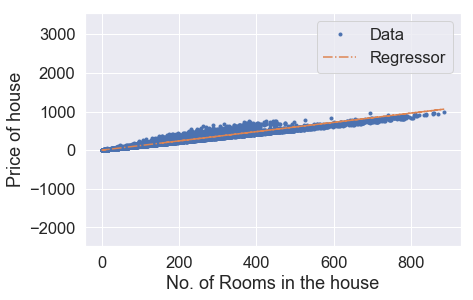

Iteration: 3621,Cost = 942.607716242794,theta = [0.1949619  1.19815287]
Iteration: 3621,Cost_val = 946.8796861760177,theta = [0.1949619  1.19815287]


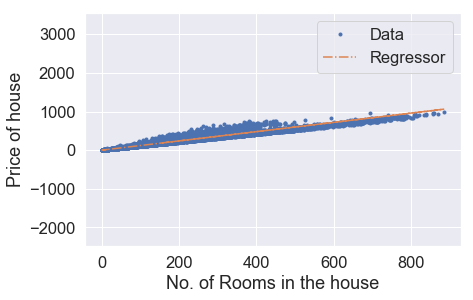

Iteration: 3631,Cost = 942.6051287481081,theta = [0.19547057 1.1981512 ]
Iteration: 3631,Cost_val = 946.8771434305008,theta = [0.19547057 1.1981512 ]


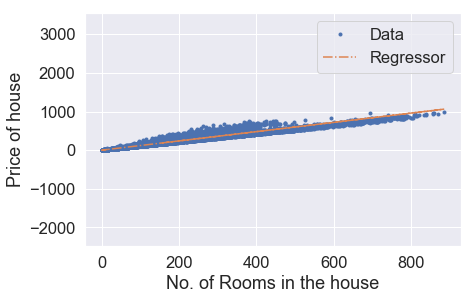

Iteration: 3641,Cost = 942.6025415089163,theta = [0.19597922 1.19814954]
Iteration: 3641,Cost_val = 946.874600935618,theta = [0.19597922 1.19814954]


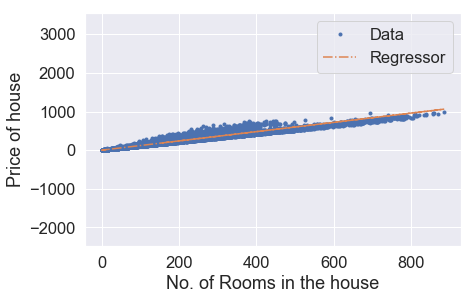

Iteration: 3651,Cost = 942.5999545252042,theta = [0.19648784 1.19814787]
Iteration: 3651,Cost_val = 946.8720586913535,theta = [0.19648784 1.19814787]


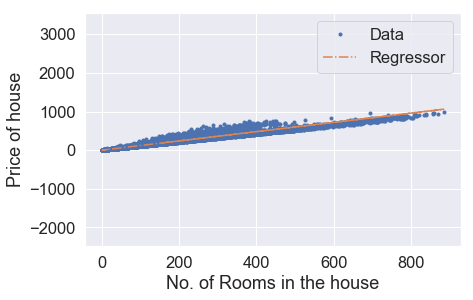

Iteration: 3661,Cost = 942.5973677969471,theta = [0.19699644 1.1981462 ]
Iteration: 3661,Cost_val = 946.8695166976746,theta = [0.19699644 1.1981462 ]


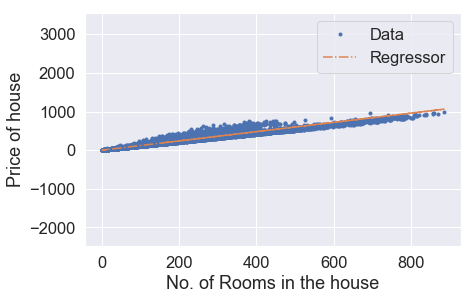

Iteration: 3671,Cost = 942.5947813241091,theta = [0.19750501 1.19814453]
Iteration: 3671,Cost_val = 946.8669749545627,theta = [0.19750501 1.19814453]


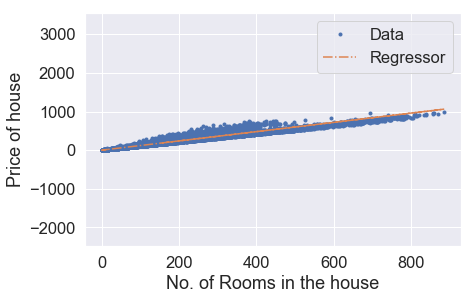

Iteration: 3681,Cost = 942.592195106683,theta = [0.19801356 1.19814287]
Iteration: 3681,Cost_val = 946.8644334619926,theta = [0.19801356 1.19814287]


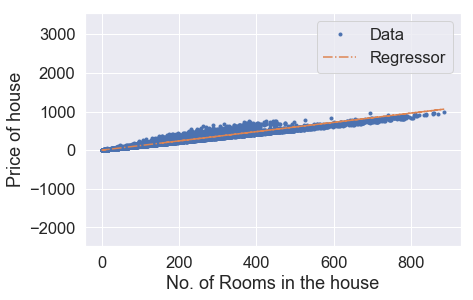

Iteration: 3691,Cost = 942.589609144636,theta = [0.19852208 1.1981412 ]
Iteration: 3691,Cost_val = 946.8618922199332,theta = [0.19852208 1.1981412 ]


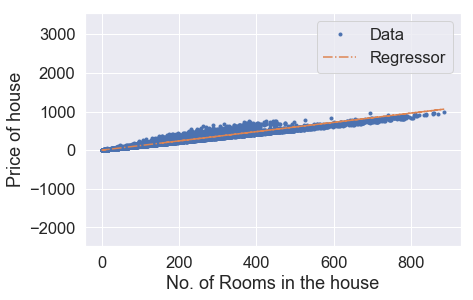

Iteration: 3701,Cost = 942.587023437947,theta = [0.19903058 1.19813953]
Iteration: 3701,Cost_val = 946.8593512283684,theta = [0.19903058 1.19813953]


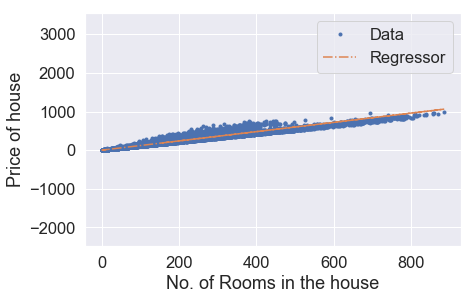

Iteration: 3711,Cost = 942.5844379865703,theta = [0.19953905 1.19813786]
Iteration: 3711,Cost_val = 946.8568104872702,theta = [0.19953905 1.19813786]


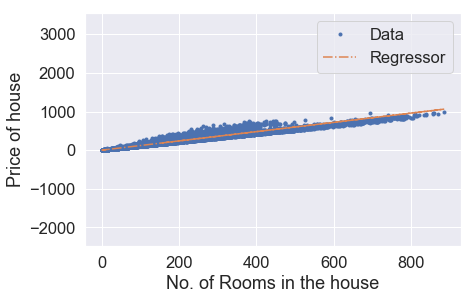

Iteration: 3721,Cost = 942.5818527905042,theta = [0.20004749 1.1981362 ]
Iteration: 3721,Cost_val = 946.854269996612,theta = [0.20004749 1.1981362 ]


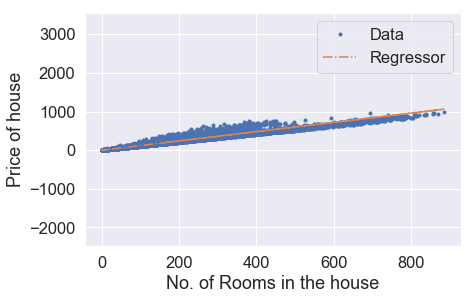

Iteration: 3731,Cost = 942.579267849712,theta = [0.20055591 1.19813453]
Iteration: 3731,Cost_val = 946.8517297563675,theta = [0.20055591 1.19813453]


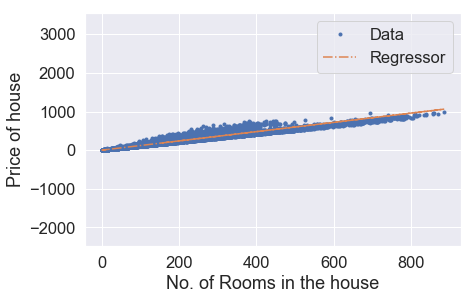

Iteration: 3741,Cost = 942.5766831641729,theta = [0.20106431 1.19813286]
Iteration: 3741,Cost_val = 946.8491897665205,theta = [0.20106431 1.19813286]


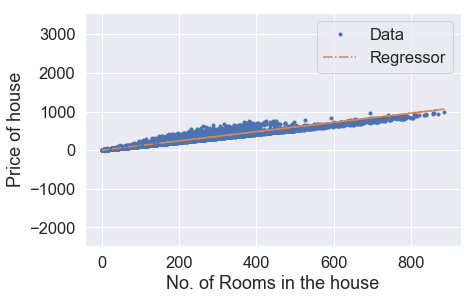

Iteration: 3751,Cost = 942.5740987338623,theta = [0.20157268 1.1981312 ]
Iteration: 3751,Cost_val = 946.8466500270382,theta = [0.20157268 1.1981312 ]


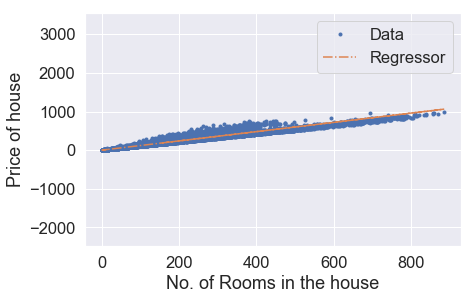

Iteration: 3761,Cost = 942.571514558743,theta = [0.20208103 1.19812953]
Iteration: 3761,Cost_val = 946.8441105378977,theta = [0.20208103 1.19812953]


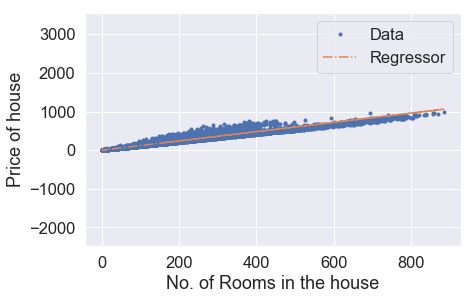

Iteration: 3771,Cost = 942.5689306388142,theta = [0.20258935 1.19812786]
Iteration: 3771,Cost_val = 946.8415712990763,theta = [0.20258935 1.19812786]


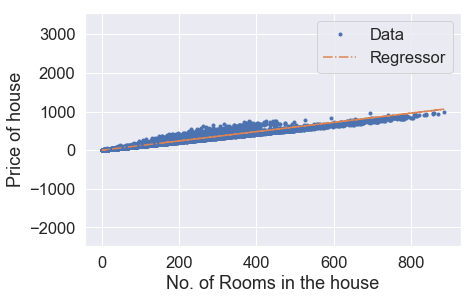

Iteration: 3781,Cost = 942.5663469740249,theta = [0.20309764 1.19812619]
Iteration: 3781,Cost_val = 946.8390323105505,theta = [0.20309764 1.19812619]


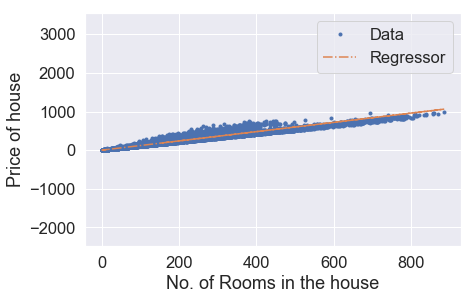

Iteration: 3791,Cost = 942.563763564374,theta = [0.20360591 1.19812453]
Iteration: 3791,Cost_val = 946.8364935722819,theta = [0.20360591 1.19812453]


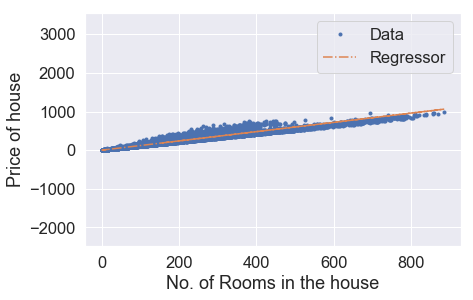

Iteration: 3801,Cost = 942.5611804098054,theta = [0.20411416 1.19812286]
Iteration: 3801,Cost_val = 946.8339550842666,theta = [0.20411416 1.19812286]


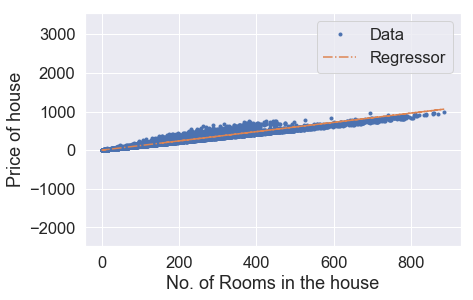

Iteration: 3811,Cost = 942.5585975103348,theta = [0.20462238 1.1981212 ]
Iteration: 3811,Cost_val = 946.8314168464668,theta = [0.20462238 1.1981212 ]


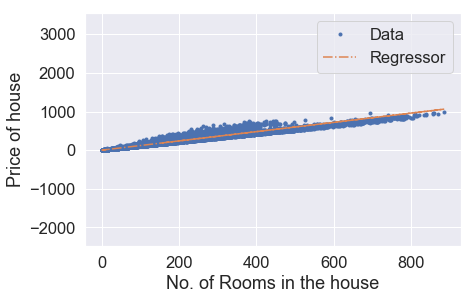

Iteration: 3821,Cost = 942.5560148659043,theta = [0.20513057 1.19811953]
Iteration: 3821,Cost_val = 946.8288788588651,theta = [0.20513057 1.19811953]


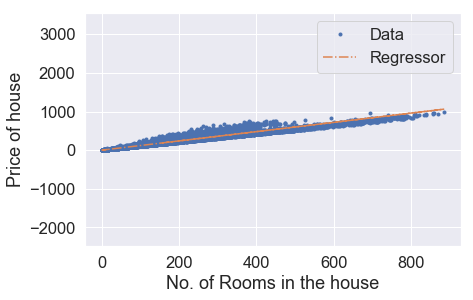

Iteration: 3831,Cost = 942.5534324764978,theta = [0.20563874 1.19811786]
Iteration: 3831,Cost_val = 946.8263411214291,theta = [0.20563874 1.19811786]


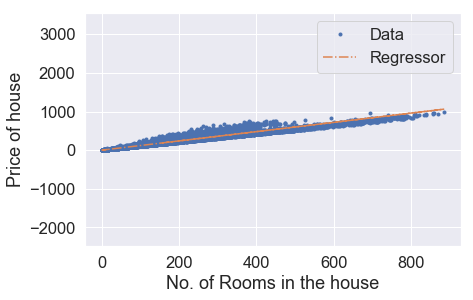

Iteration: 3841,Cost = 942.5508503420849,theta = [0.20614689 1.1981162 ]
Iteration: 3841,Cost_val = 946.8238036341442,theta = [0.20614689 1.1981162 ]


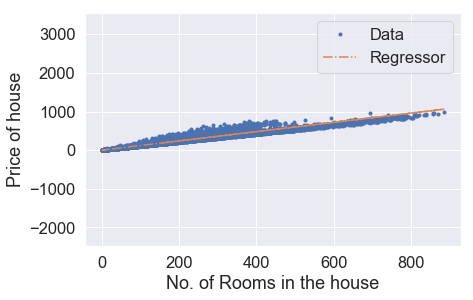

Iteration: 3851,Cost = 942.5482684626465,theta = [0.20665501 1.19811453]
Iteration: 3851,Cost_val = 946.8212663969747,theta = [0.20665501 1.19811453]


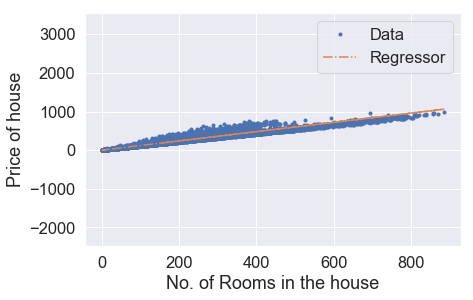

Iteration: 3861,Cost = 942.5456868381718,theta = [0.2071631  1.19811286]
Iteration: 3861,Cost_val = 946.8187294099005,theta = [0.2071631  1.19811286]


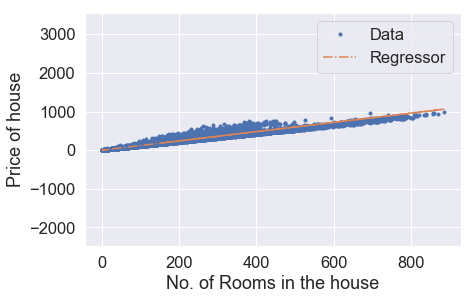

Iteration: 3871,Cost = 942.5431054686165,theta = [0.20767117 1.1981112 ]
Iteration: 3871,Cost_val = 946.8161926728978,theta = [0.20767117 1.1981112 ]


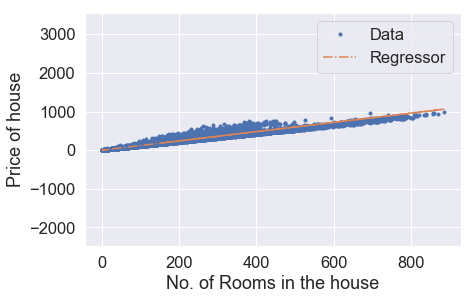

Iteration: 3881,Cost = 942.5405243539542,theta = [0.20817922 1.19810953]
Iteration: 3881,Cost_val = 946.813656185939,theta = [0.20817922 1.19810953]


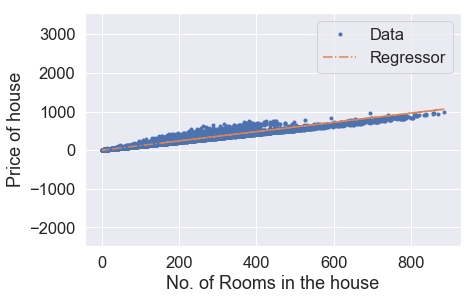

Iteration: 3891,Cost = 942.5379434941508,theta = [0.20868724 1.19810787]
Iteration: 3891,Cost_val = 946.8111199490098,theta = [0.20868724 1.19810787]


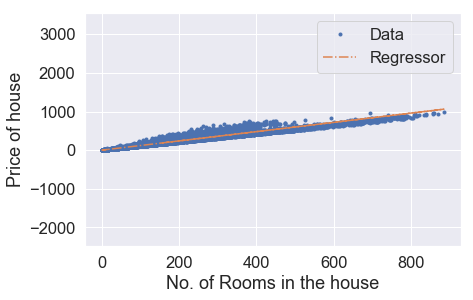

Iteration: 3901,Cost = 942.5353628892203,theta = [0.20919523 1.1981062 ]
Iteration: 3901,Cost_val = 946.8085839620686,theta = [0.20919523 1.1981062 ]


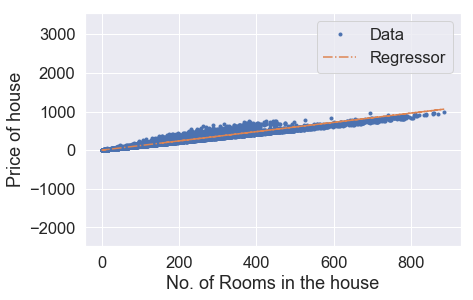

Iteration: 3911,Cost = 942.5327825391065,theta = [0.2097032  1.19810453]
Iteration: 3911,Cost_val = 946.8060482251061,theta = [0.2097032  1.19810453]


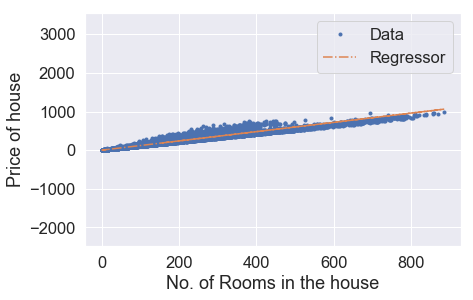

Iteration: 3921,Cost = 942.5302024437965,theta = [0.21021115 1.19810287]
Iteration: 3921,Cost_val = 946.8035127380874,theta = [0.21021115 1.19810287]


In [ ]:
'''use the saved weight'''
costs_val,costs_train,theta,iteration  = gradientDescentLinearRegression(alpha=0.00001,iter=10000, theta=theta)

In [ ]:
'''Calculate the loss for test data'''
J_test = calculateCost(x_test,theta,Y_test)
print(f"Cost_test = {J_test}")

In [ ]:
'''plot the test data'''
abline(x_test,theta,Y_test)

In [ ]:
''' create range of iteration'''
iteration_range=list(range(0, iteration))

In [ ]:
'''plot loss'''
loss_plot(iteration_range,costs_train,costs_val)